In [1]:
import pandas as pd
import numpy as np
import string
from string import punctuation
import re
import unidecode

In [2]:
import nltk
from nltk.corpus import stopwords  
from nltk.tokenize import word_tokenize  
from nltk.stem import WordNetLemmatizer 


In [3]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Administrateur\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [4]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Administrateur\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [5]:
nltk.download('averaged_perceptron_tagger')
nltk.download('omw-1.4')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Administrateur\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Administrateur\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [6]:
data=pd.read_csv(r'C:\Users\Administrateur\Ironhack\LAB\DAFT_212\Final_project\FUB data\75056\75056\commentaires-75056.csv')
data.head()

,insee,sexe,travail,utilitaire,enfants,tourisme,sport,freq,texte
0,75056,F,1,1,1,0,0,1,"Il serait bon de signaler, au sol, les pistes ..."
1,75056,F,1,1,0,1,1,1,Pour moi le vélo en libre service a accentué l...
2,75056,F,1,1,0,1,0,1,Les difficultés rencontrées par les cyclistes ...
3,75056,N,1,0,0,1,1,1,mieux connecter les piste cyclables entre elles
4,75056,F,1,1,0,1,0,1,"A Paris, il y a maintenant énormément de voies..."


In [7]:
text=list(data['texte'])
type(text)
text

['Il serait bon de signaler, au sol, les pistes cyclables par une couleur visible qui trancherait avec la route ou les trottoirs. Cela ferait de grands couloirs colorés qui seraient visibles par tous, y compris par les cyclistes !',
 'Pour moi le vélo en libre service a accentué les incivilités et les usagers ne sont ni respectueux du matériel ni du code de la route. Je ne veux pas que mes impôts servent à cela .',
 "Les difficultés rencontrées par les cyclistes sont plus liées à l'absence de civisme et à l'incompétence des néo cyclistes et des usagers de vélos en location qu'à la qualité des pistes cyclables dont les logiques d'utilisation laissent par ailleurs à désirer ( tout est fait pour que les néo cyclistes se sentent en situation d'impunité).",
 'mieux connecter les piste cyclables entre elles',
 "A Paris, il y a maintenant énormément de voies cyclables mais leur qualité est très variable (pavés, caniveau dangereux). Très peu de feux tricolores pour les vélos. Les voies cyclabl

In [8]:
text_clean = list()
for t in text:
    t=re.sub('[^a-zA-Zéèàêôù\s]', '', str(t))
    text_clean.append(t)
print(text_clean)

['Il serait bon de signaler au sol les pistes cyclables par une couleur visible qui trancherait avec la route ou les trottoirs Cela ferait de grands couloirs colorés qui seraient visibles par tous y compris par les cyclistes ', 'Pour moi le vélo en libre service a accentué les incivilités et les usagers ne sont ni respectueux du matériel ni du code de la route Je ne veux pas que mes impôts servent à cela ', 'Les difficultés rencontrées par les cyclistes sont plus liées à labsence de civisme et à lincompétence des néo cyclistes et des usagers de vélos en location quà la qualité des pistes cyclables dont les logiques dutilisation laissent par ailleurs à désirer  tout est fait pour que les néo cyclistes se sentent en situation dimpunité', 'mieux connecter les piste cyclables entre elles', 'A Paris il y a maintenant énormément de voies cyclables mais leur qualité est très variable pavés caniveau dangereux Très peu de feux tricolores pour les vélos Les voies cyclables passent de gauche à dr

In [9]:
text_clean = [t.lower() for t in text_clean]
text_clean

['il serait bon de signaler au sol les pistes cyclables par une couleur visible qui trancherait avec la route ou les trottoirs cela ferait de grands couloirs colorés qui seraient visibles par tous y compris par les cyclistes ',
 'pour moi le vélo en libre service a accentué les incivilités et les usagers ne sont ni respectueux du matériel ni du code de la route je ne veux pas que mes impôts servent à cela ',
 'les difficultés rencontrées par les cyclistes sont plus liées à labsence de civisme et à lincompétence des néo cyclistes et des usagers de vélos en location quà la qualité des pistes cyclables dont les logiques dutilisation laissent par ailleurs à désirer  tout est fait pour que les néo cyclistes se sentent en situation dimpunité',
 'mieux connecter les piste cyclables entre elles',
 'a paris il y a maintenant énormément de voies cyclables mais leur qualité est très variable pavés caniveau dangereux très peu de feux tricolores pour les vélos les voies cyclables passent de gauche 

In [10]:
text_clean = [unidecode.unidecode(t) for t in text_clean]
text_clean

['il serait bon de signaler au sol les pistes cyclables par une couleur visible qui trancherait avec la route ou les trottoirs cela ferait de grands couloirs colores qui seraient visibles par tous y compris par les cyclistes ',
 'pour moi le velo en libre service a accentue les incivilites et les usagers ne sont ni respectueux du materiel ni du code de la route je ne veux pas que mes impots servent a cela ',
 'les difficultes rencontrees par les cyclistes sont plus liees a labsence de civisme et a lincompetence des neo cyclistes et des usagers de velos en location qua la qualite des pistes cyclables dont les logiques dutilisation laissent par ailleurs a desirer  tout est fait pour que les neo cyclistes se sentent en situation dimpunite',
 'mieux connecter les piste cyclables entre elles',
 'a paris il y a maintenant enormement de voies cyclables mais leur qualite est tres variable paves caniveau dangereux tres peu de feux tricolores pour les velos les voies cyclables passent de gauche 

In [11]:
stoplist=list(stopwords.words('french'))
stoplist_manual=['a']
stoplist_final=stoplist +stoplist_manual
stoplist_final

['au',
 'aux',
 'avec',
 'ce',
 'ces',
 'dans',
 'de',
 'des',
 'du',
 'elle',
 'en',
 'et',
 'eux',
 'il',
 'ils',
 'je',
 'la',
 'le',
 'les',
 'leur',
 'lui',
 'ma',
 'mais',
 'me',
 'même',
 'mes',
 'moi',
 'mon',
 'ne',
 'nos',
 'notre',
 'nous',
 'on',
 'ou',
 'par',
 'pas',
 'pour',
 'qu',
 'que',
 'qui',
 'sa',
 'se',
 'ses',
 'son',
 'sur',
 'ta',
 'te',
 'tes',
 'toi',
 'ton',
 'tu',
 'un',
 'une',
 'vos',
 'votre',
 'vous',
 'c',
 'd',
 'j',
 'l',
 'à',
 'm',
 'n',
 's',
 't',
 'y',
 'été',
 'étée',
 'étées',
 'étés',
 'étant',
 'étante',
 'étants',
 'étantes',
 'suis',
 'es',
 'est',
 'sommes',
 'êtes',
 'sont',
 'serai',
 'seras',
 'sera',
 'serons',
 'serez',
 'seront',
 'serais',
 'serait',
 'serions',
 'seriez',
 'seraient',
 'étais',
 'était',
 'étions',
 'étiez',
 'étaient',
 'fus',
 'fut',
 'fûmes',
 'fûtes',
 'furent',
 'sois',
 'soit',
 'soyons',
 'soyez',
 'soient',
 'fusse',
 'fusses',
 'fût',
 'fussions',
 'fussiez',
 'fussent',
 'ayant',
 'ayante',
 'ayantes',


In [12]:
splitwords = [nltk.word_tokenize(str(t)) for t in text_clean]
splitwords=[x for l in splitwords for x in l]

splitwords

['il',
 'serait',
 'bon',
 'de',
 'signaler',
 'au',
 'sol',
 'les',
 'pistes',
 'cyclables',
 'par',
 'une',
 'couleur',
 'visible',
 'qui',
 'trancherait',
 'avec',
 'la',
 'route',
 'ou',
 'les',
 'trottoirs',
 'cela',
 'ferait',
 'de',
 'grands',
 'couloirs',
 'colores',
 'qui',
 'seraient',
 'visibles',
 'par',
 'tous',
 'y',
 'compris',
 'par',
 'les',
 'cyclistes',
 'pour',
 'moi',
 'le',
 'velo',
 'en',
 'libre',
 'service',
 'a',
 'accentue',
 'les',
 'incivilites',
 'et',
 'les',
 'usagers',
 'ne',
 'sont',
 'ni',
 'respectueux',
 'du',
 'materiel',
 'ni',
 'du',
 'code',
 'de',
 'la',
 'route',
 'je',
 'ne',
 'veux',
 'pas',
 'que',
 'mes',
 'impots',
 'servent',
 'a',
 'cela',
 'les',
 'difficultes',
 'rencontrees',
 'par',
 'les',
 'cyclistes',
 'sont',
 'plus',
 'liees',
 'a',
 'labsence',
 'de',
 'civisme',
 'et',
 'a',
 'lincompetence',
 'des',
 'neo',
 'cyclistes',
 'et',
 'des',
 'usagers',
 'de',
 'velos',
 'en',
 'location',
 'qua',
 'la',
 'qualite',
 'des',
 'pist

In [13]:
len(splitwords)

156406

In [14]:
print(type(stoplist_final))
print(type(splitwords))

<class 'list'>
<class 'list'>


In [15]:
filtered_text = [w for w in splitwords if not w in stoplist_final]  
filtered_text

['bon',
 'signaler',
 'sol',
 'pistes',
 'cyclables',
 'couleur',
 'visible',
 'trancherait',
 'route',
 'trottoirs',
 'cela',
 'ferait',
 'grands',
 'couloirs',
 'colores',
 'visibles',
 'tous',
 'compris',
 'cyclistes',
 'velo',
 'libre',
 'service',
 'accentue',
 'incivilites',
 'usagers',
 'ni',
 'respectueux',
 'materiel',
 'ni',
 'code',
 'route',
 'veux',
 'impots',
 'servent',
 'cela',
 'difficultes',
 'rencontrees',
 'cyclistes',
 'plus',
 'liees',
 'labsence',
 'civisme',
 'lincompetence',
 'neo',
 'cyclistes',
 'usagers',
 'velos',
 'location',
 'qua',
 'qualite',
 'pistes',
 'cyclables',
 'dont',
 'logiques',
 'dutilisation',
 'laissent',
 'ailleurs',
 'desirer',
 'tout',
 'fait',
 'neo',
 'cyclistes',
 'sentent',
 'situation',
 'dimpunite',
 'mieux',
 'connecter',
 'piste',
 'cyclables',
 'entre',
 'elles',
 'paris',
 'maintenant',
 'enormement',
 'voies',
 'cyclables',
 'qualite',
 'tres',
 'variable',
 'paves',
 'caniveau',
 'dangereux',
 'tres',
 'peu',
 'feux',
 'trico

In [16]:
count = pd.Series(filtered_text).value_counts()
count.head(50)

pistes           2021
velo             1855
cyclables        1693
cyclistes        1411
plus             1274
velos            1148
tres              897
paris             841
pietons           749
route             748
trop              719
dangereux         637
voitures          630
beaucoup          610
faire             588
cest              572
vehicules         504
faut              489
code              486
piste             485
cyclable          459
voies             442
motorises         432
sens              431
souvent           390
circulation       381
usagers           380
autres            374
feux              357
entre             354
sans              346
ville             329
aussi             328
tout              319
respect           315
fait              309
bien              308
non               305
encore            304
danger            303
stationnement     301
place             300
etre              297
rue               289
peu               288
tous      

In [17]:
from nltk.probability import FreqDist
fdist=FreqDist()

In [18]:
for word in filtered_text:
    fdist[word]+=1
fdist

FreqDist({'pistes': 2021, 'velo': 1855, 'cyclables': 1693, 'cyclistes': 1411, 'plus': 1274, 'velos': 1148, 'tres': 897, 'paris': 841, 'pietons': 749, 'route': 748, ...})

In [19]:
fdist['velo']

1855

In [20]:
fdist_top10=fdist.most_common(10)
fdist_top10

[('pistes', 2021),
 ('velo', 1855),
 ('cyclables', 1693),
 ('cyclistes', 1411),
 ('plus', 1274),
 ('velos', 1148),
 ('tres', 897),
 ('paris', 841),
 ('pietons', 749),
 ('route', 748)]

In [21]:
from nltk.util import bigrams, trigrams, ngrams

In [22]:
text_bigrams=list(nltk.bigrams(filtered_text))
text_bigrams

[('bon', 'signaler'),
 ('signaler', 'sol'),
 ('sol', 'pistes'),
 ('pistes', 'cyclables'),
 ('cyclables', 'couleur'),
 ('couleur', 'visible'),
 ('visible', 'trancherait'),
 ('trancherait', 'route'),
 ('route', 'trottoirs'),
 ('trottoirs', 'cela'),
 ('cela', 'ferait'),
 ('ferait', 'grands'),
 ('grands', 'couloirs'),
 ('couloirs', 'colores'),
 ('colores', 'visibles'),
 ('visibles', 'tous'),
 ('tous', 'compris'),
 ('compris', 'cyclistes'),
 ('cyclistes', 'velo'),
 ('velo', 'libre'),
 ('libre', 'service'),
 ('service', 'accentue'),
 ('accentue', 'incivilites'),
 ('incivilites', 'usagers'),
 ('usagers', 'ni'),
 ('ni', 'respectueux'),
 ('respectueux', 'materiel'),
 ('materiel', 'ni'),
 ('ni', 'code'),
 ('code', 'route'),
 ('route', 'veux'),
 ('veux', 'impots'),
 ('impots', 'servent'),
 ('servent', 'cela'),
 ('cela', 'difficultes'),
 ('difficultes', 'rencontrees'),
 ('rencontrees', 'cyclistes'),
 ('cyclistes', 'plus'),
 ('plus', 'liees'),
 ('liees', 'labsence'),
 ('labsence', 'civisme'),
 ('ci

In [23]:
text_bigrams=list(nltk.bigrams(splitwords))
text_bigrams

[('il', 'serait'),
 ('serait', 'bon'),
 ('bon', 'de'),
 ('de', 'signaler'),
 ('signaler', 'au'),
 ('au', 'sol'),
 ('sol', 'les'),
 ('les', 'pistes'),
 ('pistes', 'cyclables'),
 ('cyclables', 'par'),
 ('par', 'une'),
 ('une', 'couleur'),
 ('couleur', 'visible'),
 ('visible', 'qui'),
 ('qui', 'trancherait'),
 ('trancherait', 'avec'),
 ('avec', 'la'),
 ('la', 'route'),
 ('route', 'ou'),
 ('ou', 'les'),
 ('les', 'trottoirs'),
 ('trottoirs', 'cela'),
 ('cela', 'ferait'),
 ('ferait', 'de'),
 ('de', 'grands'),
 ('grands', 'couloirs'),
 ('couloirs', 'colores'),
 ('colores', 'qui'),
 ('qui', 'seraient'),
 ('seraient', 'visibles'),
 ('visibles', 'par'),
 ('par', 'tous'),
 ('tous', 'y'),
 ('y', 'compris'),
 ('compris', 'par'),
 ('par', 'les'),
 ('les', 'cyclistes'),
 ('cyclistes', 'pour'),
 ('pour', 'moi'),
 ('moi', 'le'),
 ('le', 'velo'),
 ('velo', 'en'),
 ('en', 'libre'),
 ('libre', 'service'),
 ('service', 'a'),
 ('a', 'accentue'),
 ('accentue', 'les'),
 ('les', 'incivilites'),
 ('incivilites'

In [24]:
text_trigrams=list(nltk.trigrams(filtered_text))
text_trigrams

[('bon', 'signaler', 'sol'),
 ('signaler', 'sol', 'pistes'),
 ('sol', 'pistes', 'cyclables'),
 ('pistes', 'cyclables', 'couleur'),
 ('cyclables', 'couleur', 'visible'),
 ('couleur', 'visible', 'trancherait'),
 ('visible', 'trancherait', 'route'),
 ('trancherait', 'route', 'trottoirs'),
 ('route', 'trottoirs', 'cela'),
 ('trottoirs', 'cela', 'ferait'),
 ('cela', 'ferait', 'grands'),
 ('ferait', 'grands', 'couloirs'),
 ('grands', 'couloirs', 'colores'),
 ('couloirs', 'colores', 'visibles'),
 ('colores', 'visibles', 'tous'),
 ('visibles', 'tous', 'compris'),
 ('tous', 'compris', 'cyclistes'),
 ('compris', 'cyclistes', 'velo'),
 ('cyclistes', 'velo', 'libre'),
 ('velo', 'libre', 'service'),
 ('libre', 'service', 'accentue'),
 ('service', 'accentue', 'incivilites'),
 ('accentue', 'incivilites', 'usagers'),
 ('incivilites', 'usagers', 'ni'),
 ('usagers', 'ni', 'respectueux'),
 ('ni', 'respectueux', 'materiel'),
 ('respectueux', 'materiel', 'ni'),
 ('materiel', 'ni', 'code'),
 ('ni', 'code', 

In [25]:
text_trigrams_series=pd.Series(text_trigrams).value_counts()
text_trigrams_series.head(50)

(respect, code, route)                 81
(respectent, code, route)              75
(respecter, code, route)               46
(certaines, pistes, cyclables)         42
(pistes, cyclables, trop)              40
(pistes, cyclables, plus)              33
(pistes, cyclables, tres)              31
(code, route, cyclistes)               29
(cyclistes, respectent, code)          28
(pistes, cyclables, souvent)           27
(pistes, cyclables, trottoirs)         24
(non, respect, code)                   24
(faire, respecter, code)               23
(velo, pistes, cyclables)              23
(pistes, cyclables, cest)              22
(plus, pistes, cyclables)              22
(deux, roues, motorises)               22
(stationnement, pistes, cyclables)     21
(cyclables, double, sens)              21
(pistes, cyclables, double)            21
(nouvelles, pistes, cyclables)         20
(faire, pistes, cyclables)             20
(font, nimporte, quoi)                 20
(autres, usagers, route)          

In [26]:
text_trigrams=list(nltk.trigrams(splitwords))
text_trigrams

[('il', 'serait', 'bon'),
 ('serait', 'bon', 'de'),
 ('bon', 'de', 'signaler'),
 ('de', 'signaler', 'au'),
 ('signaler', 'au', 'sol'),
 ('au', 'sol', 'les'),
 ('sol', 'les', 'pistes'),
 ('les', 'pistes', 'cyclables'),
 ('pistes', 'cyclables', 'par'),
 ('cyclables', 'par', 'une'),
 ('par', 'une', 'couleur'),
 ('une', 'couleur', 'visible'),
 ('couleur', 'visible', 'qui'),
 ('visible', 'qui', 'trancherait'),
 ('qui', 'trancherait', 'avec'),
 ('trancherait', 'avec', 'la'),
 ('avec', 'la', 'route'),
 ('la', 'route', 'ou'),
 ('route', 'ou', 'les'),
 ('ou', 'les', 'trottoirs'),
 ('les', 'trottoirs', 'cela'),
 ('trottoirs', 'cela', 'ferait'),
 ('cela', 'ferait', 'de'),
 ('ferait', 'de', 'grands'),
 ('de', 'grands', 'couloirs'),
 ('grands', 'couloirs', 'colores'),
 ('couloirs', 'colores', 'qui'),
 ('colores', 'qui', 'seraient'),
 ('qui', 'seraient', 'visibles'),
 ('seraient', 'visibles', 'par'),
 ('visibles', 'par', 'tous'),
 ('par', 'tous', 'y'),
 ('tous', 'y', 'compris'),
 ('y', 'compris', 'p

In [27]:
text_trigrams_series=pd.Series(text_trigrams).value_counts()
text_trigrams_series.head(50)

(les, pistes, cyclables)       708
(de, la, route)                583
(code, de, la)                 440
(sur, les, pistes)             297
(il, y, a)                     292
(des, pistes, cyclables)       258
(le, code, de)                 222
(ne, sont, pas)                191
(ne, respectent, pas)          162
(pour, les, velos)             154
(du, code, de)                 151
(pistes, cyclables, sont)      144
(de, pistes, cyclables)        131
(pour, les, cyclistes)         118
(les, vehicules, motorises)    104
(la, piste, cyclable)          100
(la, route, et)                 95
(velo, a, paris)                93
(qui, ne, respectent)           88
(lusage, du, velo)              88
(plus, en, plus)                82
(respect, du, code)             82
(de, plus, en)                  81
(pratique, du, velo)            80
(pas, le, code)                 78
(respectent, pas, les)          75
(du, velo, a)                   73
(usagers, de, la)               71
(il, ny, a)         

In [28]:
text_ngrams=list(nltk.ngrams(filtered_text, 5))
text_ngrams

[('bon', 'signaler', 'sol', 'pistes', 'cyclables'),
 ('signaler', 'sol', 'pistes', 'cyclables', 'couleur'),
 ('sol', 'pistes', 'cyclables', 'couleur', 'visible'),
 ('pistes', 'cyclables', 'couleur', 'visible', 'trancherait'),
 ('cyclables', 'couleur', 'visible', 'trancherait', 'route'),
 ('couleur', 'visible', 'trancherait', 'route', 'trottoirs'),
 ('visible', 'trancherait', 'route', 'trottoirs', 'cela'),
 ('trancherait', 'route', 'trottoirs', 'cela', 'ferait'),
 ('route', 'trottoirs', 'cela', 'ferait', 'grands'),
 ('trottoirs', 'cela', 'ferait', 'grands', 'couloirs'),
 ('cela', 'ferait', 'grands', 'couloirs', 'colores'),
 ('ferait', 'grands', 'couloirs', 'colores', 'visibles'),
 ('grands', 'couloirs', 'colores', 'visibles', 'tous'),
 ('couloirs', 'colores', 'visibles', 'tous', 'compris'),
 ('colores', 'visibles', 'tous', 'compris', 'cyclistes'),
 ('visibles', 'tous', 'compris', 'cyclistes', 'velo'),
 ('tous', 'compris', 'cyclistes', 'velo', 'libre'),
 ('compris', 'cyclistes', 'velo', 

In [29]:
from french_lefff_lemmatizer.french_lefff_lemmatizer import FrenchLefffLemmatizer

In [30]:
len(splitwords)

156406

In [31]:
splitwords_sample=splitwords[:156406]
splitwords_sample

['il',
 'serait',
 'bon',
 'de',
 'signaler',
 'au',
 'sol',
 'les',
 'pistes',
 'cyclables',
 'par',
 'une',
 'couleur',
 'visible',
 'qui',
 'trancherait',
 'avec',
 'la',
 'route',
 'ou',
 'les',
 'trottoirs',
 'cela',
 'ferait',
 'de',
 'grands',
 'couloirs',
 'colores',
 'qui',
 'seraient',
 'visibles',
 'par',
 'tous',
 'y',
 'compris',
 'par',
 'les',
 'cyclistes',
 'pour',
 'moi',
 'le',
 'velo',
 'en',
 'libre',
 'service',
 'a',
 'accentue',
 'les',
 'incivilites',
 'et',
 'les',
 'usagers',
 'ne',
 'sont',
 'ni',
 'respectueux',
 'du',
 'materiel',
 'ni',
 'du',
 'code',
 'de',
 'la',
 'route',
 'je',
 'ne',
 'veux',
 'pas',
 'que',
 'mes',
 'impots',
 'servent',
 'a',
 'cela',
 'les',
 'difficultes',
 'rencontrees',
 'par',
 'les',
 'cyclistes',
 'sont',
 'plus',
 'liees',
 'a',
 'labsence',
 'de',
 'civisme',
 'et',
 'a',
 'lincompetence',
 'des',
 'neo',
 'cyclistes',
 'et',
 'des',
 'usagers',
 'de',
 'velos',
 'en',
 'location',
 'qua',
 'la',
 'qualite',
 'des',
 'pist

In [32]:
splitwords_sample_string=' '.join(splitwords_sample)
splitwords_sample_string

'il serait bon de signaler au sol les pistes cyclables par une couleur visible qui trancherait avec la route ou les trottoirs cela ferait de grands couloirs colores qui seraient visibles par tous y compris par les cyclistes pour moi le velo en libre service a accentue les incivilites et les usagers ne sont ni respectueux du materiel ni du code de la route je ne veux pas que mes impots servent a cela les difficultes rencontrees par les cyclistes sont plus liees a labsence de civisme et a lincompetence des neo cyclistes et des usagers de velos en location qua la qualite des pistes cyclables dont les logiques dutilisation laissent par ailleurs a desirer tout est fait pour que les neo cyclistes se sentent en situation dimpunite mieux connecter les piste cyclables entre elles a paris il y a maintenant enormement de voies cyclables mais leur qualite est tres variable paves caniveau dangereux tres peu de feux tricolores pour les velos les voies cyclables passent de gauche a droite et vicevers

In [33]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd
import  numpy as np
from PIL import Image
import requests

In [34]:
wordcloud = WordCloud(width = 500, height = 500, 
                background_color ='white', 
                min_font_size = 10).generate(str(filtered_text))

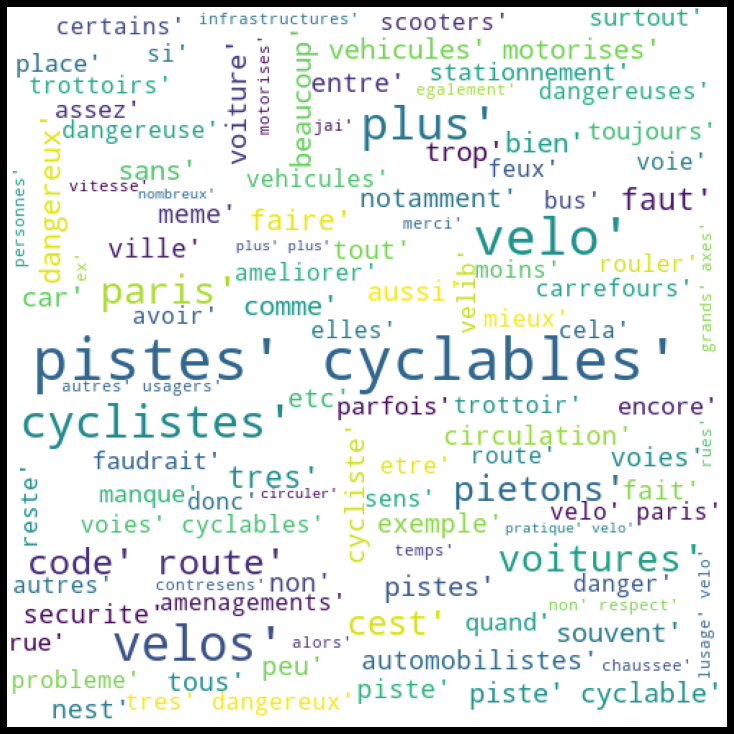

In [35]:
plt.figure(figsize = (10, 10), facecolor = 'black', edgecolor='blue') 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

In [36]:
!python -m spacy download fr_core_news_md

     ---------------------------------------- 47.4/47.4 MB 4.4 MB/s eta 0:00:00


2022-04-18 14:54:17.002171: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'cudart64_110.dll'; dlerror: cudart64_110.dll not found
2022-04-18 14:54:17.003211: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


[+] Download and installation successful
You can now load the package via spacy.load('fr_core_news_md')


In [37]:
import spacy
import fr_core_news_md

In [38]:
nlp = spacy.load("fr_core_news_md")
doc = nlp(splitwords_sample_string)

In [39]:
for i in range(156406):
    print(doc[i].text, doc[i].pos_, doc[i].lemma_)

il PRON il
serait AUX être
bon ADJ bon
de ADP de
signaler VERB signaler
au ADP au
sol NOUN sol
les DET le
pistes NOUN piste
cyclables ADJ cyclable
par ADP par
une DET un
couleur NOUN couleur
visible ADJ visible
qui PRON qui
trancherait VERB trancher
avec ADP avec
la DET le
route NOUN route
ou CCONJ ou
les DET le
trottoirs NOUN trottoir
cela PRON cela
ferait VERB faire
de DET de
grands ADJ grand
couloirs NOUN couloir
colores ADJ colore
qui PRON qui
seraient AUX être
visibles ADJ visible
par ADP par
tous ADJ tout
y PRON y
compris ADJ compris
par ADP par
les DET le
cyclistes NOUN cycliste
pour ADP pour
moi PRON moi
le DET le
velo NOUN velo
en ADP en
libre ADJ libre
service NOUN service
a AUX avoir
accentue VERB accentue
les DET le
incivilites NOUN incivilite
et CCONJ et
les DET le
usagers NOUN usager
ne ADV ne
sont AUX être
ni CCONJ ni
respectueux ADJ respectueux
du ADP de
materiel NOUN materiel
ni CCONJ ni
du ADP de
code NOUN code
de ADP de
la DET le
route NOUN route
je PRON je
ne ADV ne

danger NOUN danger
et CCONJ et
bien ADV bien
attention NOUN attention
a VERB avoir
la DET le
surprise NOUN surprise
qui PRON qui
peut VERB pouvoir
surgir VERB surgir
et CCONJ et
qu SCONJ qu
on PRON on
avait VERB avoir
pas ADV pas
vue NOUN vue
ou CCONJ ou
entendu VERB entendre
mais CCONJ mais
ces DET ce
quand ADV quand
meme ADJ mem
un DET un
plaisir NOUN plaisir
et CCONJ et
un DET un
sentiment NOUN sentiment
de ADP de
liberte NOUN liberte
avant ADP avant
tous ADJ tout
le DET le
velo NOUN velo
pour ADP pour
moi PRON moi
trop ADV trop
peu ADV peu
daction NOUN daction
sur ADP sur
les DET le
stationnements NOUN stationnement
genants NOUN genant
des ADP de
motorises NOUN motorise
la DET le
politique NOUN politique
velo NOUN velo
de ADP de
la DET le
commune NOUN commune
de ADP de
paris PROPN pari
est AUX être
inegale VERB inegale
elle PRON lui
est AUX être
developpee VERB developpee
dans ADP dans
lestcentre NOUN lestcentre
et CCONJ et
pas ADV pas
du ADP de
tout ADV tout
dans ADP dans
le DET l

un DET un
laisse VERB laisse
passe VERB passer
a VERB avoir
la DET le
betise NOUN betise
quil SCONJ quil
y PRON y
est VERB être
des ADP de
obstacles NOUN obstacle
en ADP en
ville NOUN ville
est AUX être
normal ADJ normal
il PRON il
faut VERB falloir
apprendre VERB apprendre
a VERB avoir
les PRON le
contourner VERB contourner
a AUX avoir
etre AUX etre
patient NOUN patient
et CCONJ et
serein VERB serein
si SCONJ si
les DET le
voitures NOUN voiture
se PRON se
comportaient VERB comporter
comme ADP comme
les DET le
cyclistes NOUN cycliste
ont AUX avoir
serait AUX être
choques ADJ choque
cest VERB cest
un DET un
point NOUN point
essentiel ADJ essentiel
deducation NOUN deducation
jai AUX jai
parcouru VERB parcourir
km NOUN kilomètre
a AUX avoir
paris VERB paris
sans ADP sans
un DET un
seul ADJ seul
coup NOUN coup
de ADP de
sonnette NOUN sonnette
avec ADP avec
la DET le
fermeture NOUN fermeture
du ADP de
bd NOUN bd
du ADP de
palais NOUN palais
la DET le
rue NOUN rue
st PROPN st
jacques PROPN j

pistes NOUN piste
cyclables ADJ cyclable
comme ADP comme
des DET un
parkings NOUN parking
occasionnels ADJ occasionnel
chantiers NOUN chantier
de ADP de
voirie NOUN voirie
non ADV non
securises ADJ securise
pour ADP pour
les DET le
cyclistes NOUN cycliste
implementer VERB implementer
la DET le
diffusion NOUN diffusion
des ADP de
puces NOUN puce
pour ADP pour
retrouver VERB retrouver
les DET le
velos NOUN velo
perdus VERB perdre
les DET le
conflits NOUN conflit
avec ADP avec
les DET le
motorises NOUN motorise
sont AUX être
trop ADV trop
frequents ADJ frequent
et CCONJ et
degenerent ADV degenerent
souvent ADV souvent
je PRON je
me PRON me
suis AUX être
fait AUX faire
agresser VERB agresser
plusieurs DET plusieurs
fois NOUN fois
apres DET apres
avoir AUX avoir
indique VERB indique
a ADP à
des DET un
automobiles NOUN automobile
ou CCONJ ou
des DET un
scooters NOUN scooter
quil PRON quil
fallait VERB falloir
quitter VERB quitter
la DET le
piste NOUN piste
cyclable ADJ cyclable
il PRON il
fa

quand SCONJ quand
le DET le
velo NOUN velo
dois VERB devoir
changer VERB changer
de DET de
direction NOUN direction
au ADP au
carrefour NOUN carrefour
par ADP par
ou CCONJ ou
commencer VERB commencer
globalement ADV globalement
les DET le
relations NOUN relation
entre ADP entre
les DET le
differents ADJ different
usagers ADJ usager
sont AUX être
tres ADV tres
mauvaises ADJ mauvais
mieux ADV mieux
penser VERB penser
les DET le
pistes NOUN piste
cyclables ADJ cyclable
sur ADP sur
danciennes NOUN dancienne
places NOUN place
ou CCONJ ou
dans ADP dans
des DET un
rues NOUN rue
tres X tres
commercantes ADJ commercante
il PRON il
faut VERB falloir
quil SCONJ quil
y PRON y
ait VERB avoir
des DET un
places NOUN place
pour ADP pour
les DET le
livreurs NOUN livreur
ailleurs ADV ailleurs
sinon ADV sinon
ils PRON il
se PRON se
mettent VERB mettre
sur ADP sur
les DET le
pistes NOUN piste
cycables ADJ cycable
bah CCONJ bah
oui ADV oui
faut VERB falloir
bien ADV bien
livrer VERB livrer
les DET le
magas

en ADP en
ans NOUN an
je PRON je
nai VERB ner
jamais ADV jamais
vu VERB voir
un DET un
rappel NOUN rappel
a AUX avoir
lordre NOUN lordre
alors ADV alors
que SCONJ que
la DET le
situation NOUN situation
sest AUX sest
produite VERB produire
de ADP de
tres NOUN tre
nombreuses ADJ nombreux
fois NOUN fois
resultat NOUN resultat
les DET le
cyclistes NOUN cycliste
nutilisent ADJ nutilisent
pas ADV pas
cet DET ce
equipement NOUN equipement
peu ADV peu
de ADP de
respect NOUN respect
des ADP de
cyclistes NOUN cycliste
par ADP par
les DET le
autres ADJ autre
usagers ADJ usager
motorises ADJ motorise
necessite VERB necessite
de ADP de
faire VERB faire
de ADP de
la DET le
prevention NOUN prevention
aupres ADJ aupre
des ADP de
cyclistes NOUN cycliste
qui PRON qui
ne ADV ne
respectent VERB respecter
pas ADV pas
le DET le
code NOUN code
de ADP de
laroutz NOUN laroutz
le DET le
questionnaire NOUN questionnaire
est AUX être
un DET un
peu ADV peu
long ADJ long
et CCONJ et
il PRON il
devrait VERB devoir
e

mises VERB mettre
en ADP en
place NOUN place
depuis ADP depuis
le DET le
confinement NOUN confinement
et CCONJ et
revoir VERB revoir
les DET le
amenagement NOUN amenagement
au ADP au
niveau NOUN niveau
des ADP de
arrets NOUN arret
de ADP de
bus NOUN bus
qui PRON qui
conduisent VERB conduire
a VERB avoir
des DET un
absence NOUN absence
devacuation NOUN devacuation
des ADP de
dechets NOUN dechet
urbains ADJ urbain
en ADP en
raison NOUN raison
de ADP de
leur DET leur
mauvaise ADJ mauvais
conception NOUN conception
verbaliser VERB verbaliser
les DET le
camionettes NOUN camionette
de ADP de
livraison NOUN livraison
qui PRON qui
se PRON se
stationnent VERB stationner
sur ADP sur
les DET le
pistes NOUN piste
cyables ADJ cyable
ne ADV ne
pas ADV pas
laisser VERB laisser
les DET le
livreurs NOUN livreur
a AUX avoir
velo VERB velo
prendre VERB prendre
des DET un
mauvaises ADJ mauvais
habitudes NOUN habitude
en ADP en
se PRON se
stationnant NOUN stationnant
sur ADP sur
les DET le
pistes NOUN pist

des DET un
frictions NOUN friction
avec ADP avec
les DET le
pietons NOUN pieton
ou CCONJ ou
motorise NOUN motorise
il PRON il
y PRON y
a VERB avoir
un DET un
code NOUN code
de ADP de
la DET le
route NOUN route
des ADP de
velo NOUN velo
meconnu VERB meconnu
des DET un
usagers NOUN usager
velo ADJ velo
voitures NOUN voiture
et CCONJ et
pieton VERB pieton
les DET le
pistes NOUN piste
cyclables ADJ cyclable
a VERB avoir
double ADJ double
sens NOUN sens
sont AUX être
dangeureuses VERB dangeureuser
il PRON il
faut VERB falloir
les PRON le
eviter VERB eviter
tendance NOUN tendance
favorable ADJ favorable
a VERB avoir
la DET le
hausse NOUN hausse
meme ADJ mem
si SCONJ si
la DET le
situation NOUN situation
sameliore ADJ samelior
a AUX avoir
reste VERB reste
trop ADV trop
souvent ADV souvent
lanarchie VERB lanarchie
a VERB avoir
certains DET certain
endroits NOUN endroit
du ADP de
parcours NOUN parcours
il PRON il
faut VERB falloir
developper VERB developper
les DET le
parcours NOUN parcours
ave

controle NOUN controle
de ADP de
police NOUN police
pour ADP pour
limiter VERB limiter
au ADP au
maximum NOUN maximum
les DET le
roues NOUN roue
motorises ADJ motorise
dans ADP dans
les DET le
pistes NOUN piste
cyclables ADJ cyclable
la DET le
politique NOUN politique
de ADP de
poster VERB poster
des ADP de
agents NOUN agent
de ADP de
police NOUN police
pendant ADP pendant
jours NOUN jour
au ADP au
meme ADJ mem
endroit NOUN endroit
pour ADP pour
limiter VERB limiter
ce DET ce
fleau NOUN fleau
ne ADV ne
fonctionne VERB fonctionne
que SCONJ que
pendant ADP pendant
a AUX avoir
jours ADV jours
tout ADV tout
au ADP au
plus ADV plus
entre ADP entre
linstitut NOUN linstitut
du ADP de
monde NOUN monde
arabe ADJ arabe
et CCONJ et
la DET le
place NOUN place
valubert VERB valubert
aucune DET aucun
piste NOUN piste
cyclable ADJ cyclable
dans ADP dans
ce DET ce
sens NOUN sens
de ADP de
circulation NOUN circulation
lorsque SCONJ lorsque
lon PRON lon
sort VERB sortir
de ADP de
la DET le
faculte NOUN 

de ADP de
nids NOUN nid
de ADP de
poule NOUN poule
ne ADV ne
sont AUX être
jamais ADV jamais
signales VERB signaler
et CCONJ et
encore ADV encore
moins ADV moins
repares ADJ repare
de ADP de
plus ADV plus
bons ADJ bon
nombres NOUN nombre
de ADP de
neopratiquants NOUN neopratiquant
ne ADV ne
respectent VERB respecter
pas ADV pas
assez ADV assez
les DET le
regles NOUN regle
de ADP de
circulation NOUN circulation
dommage NOUN dommage
que SCONJ que
lon ADJ lon
soit AUX être
obliger VERB obliger
de ADP de
repondre VERB repondre
a VERB avoir
toutes ADJ tout
les DET le
questions NOUN question
y PRON y
compris ADJ compris
lorsque SCONJ lorsque
lon ADJ lon
nest VERB nest
pas ADV pas
concerne VERB concerne
le DET le
questionnaire NOUN questionnaire
se PRON se
focalise VERB focalise
bcp ADV bcp
sur ADP sur
le DET le
comportement NOUN comportement
des ADP de
autres ADJ autre
usagers NOUN usager
que PRON que
les DET le
cyclistes NOUN cycliste
je PRON je
tiens VERB tenir
a AUX avoir
souligner VERB s

y PRON y
a VERB avoir
un DET un
camion NOUN camion
qui PRON qui
passe VERB passer
je PRON je
ne ADV ne
vois VERB voir
vraiment ADV vraiment
pas ADV pas
linteret VERB linteret
de ADP de
telles DET tel
infrastructures NOUN infrastructure
qui PRON qui
creent ADV creent
une DET un
gene NOUN gene
voire CCONJ voire
un DET un
danger NOUN danger
au ADP au
lieu NOUN lieu
de ADP de
proteger VERB proteger
eviter VERB eviter
aussi ADV aussi
de ADP de
mettre VERB mettre
des DET un
pistes NOUN piste
cyclables ADJ cyclable
au ADP au
centre NOUN centre
des ADP de
rondspoints NOUN rondspoint
comme ADP comme
la DET le
coronapiste NOUN coronapiste
a AUX avoir
place VERB placer
de ADP de
clichy NOUN clichy
difficile ADJ difficile
dy PRON dy
acceder VERB acceder
et CCONJ et
den AUX den
sortir VERB sortir
sans ADP sans
se PRON se
sentir VERB sentir
en ADP en
danger NOUN danger
les DET le
voitures NOUN voiture
ne ADV ne
sattendent VERB sattender
pas ADV pas
a AUX avoir
nous PRON nous
voir VERB voir
arriver V

verbaliser VERB verbaliser
les DET le
cyclistes NOUN cycliste
avec ADP avec
beaucoup ADV beaucoup
plus ADV plus
de ADP de
severite NOUN severite
car CCONJ car
ces DET ce
derniers ADJ dernier
sont AUX être
irrespectueux ADJ irrespectueux
du ADP de
code NOUN code
de ADP de
la DET le
route NOUN route
je PRON je
me PRON me
deplace VERB deplace
a AUX avoir
velo VERB velo
depuis ADP depuis
ans NOUN an
c NOUN c
est AUX être
beaucoup ADV beaucoup
plus ADV plus
dangereux ADJ dangereux
actuellement ADV actuellement
la DET le
situation NOUN situation
avec ADP avec
les DET le
velo NOUN velo
a AUX avoir
moteur ADJ moteur
electriques ADJ electrique
trottinettes NOUN trottinette
electriques ADJ electrique
bref ADV bref
tous ADJ tout
les DET le
vehicules NOUN vehicule
a AUX avoir
moteur NOUN moteur
est AUX être
insuportable ADJ insuportabl
les DET le
pistes NOUN piste
a VERB avoir
double ADJ double
sens NOUN sens
sont AUX être
dangereuses ADJ dangereux
a AUX avoir
eviter VERB eviter
augmenter VERB aug

pas ADV pas
les DET le
infractions NOUN infraction
des ADP de
vehicules NOUN vehicule
motorises ADJ motorise
stationnement NOUN stationnement
sur ADP sur
pistes NOUN piste
cyclables NOUN cyclable
motosscooters ADJ motosscooter
utilisant VERB utiliser
les DET le
pistes NOUN piste
cyclables ADJ cyclable
non ADV non
respect NOUN respect
de ADP de
la DET le
distance NOUN distance
de ADP de
securite NOUN securite
dans ADP dans
les DET le
petites ADJ petit
rues NOUN rue
non ADV non
respect NOUN respect
de ADP de
la DET le
zone NOUN zone
reservee ADP reservee
aux ADP à
feux NOUN feu
rouges ADJ rouge
il PRON il
serait AUX être
necessaire ADJ necessair
de ADP de
verbaliser VERB verbaliser
egalement ADV egalement
les DET le
cyclistes NOUN cycliste
ne ADV ne
respectant VERB respecter
pas ADV pas
les DET le
regles NOUN regle
de ADP de
securite NOUN securite
et CCONJ et
mettant VERB mettre
en ADP en
danger NOUN danger
les DET le
pietons NOUN pieton
gros ADJ gros
soucis NOUN souci
avec ADP avec
les 

a AUX avoir
paris VERB paris
mais CCONJ mais
certains DET certain
amenagements NOUN amenagement
restent VERB rester
tres ADV tres
mal ADV mal
penses NOUN pense
notamment ADV notamment
sur ADP sur
la DET le
cohabitation NOUN cohabitation
avec ADP avec
les DET le
pietons NOUN pieton
pistes NOUN piste
ciclables ADJ ciclable
sur ADP sur
les DET le
trottoirs NOUN trottoir
qui PRON qui
impliquent VERB impliquer
forcement ADV forcement
des ADP de
conflits NOUN conflit
dusage NOUN dusage
voire CCONJ voire
dangereux ADJ dangereux
traversee VERB traversee
de ADP de
grands ADJ grand
axes NOUN axe
routiers ADJ routier
les DET le
pistes NOUN piste
cyclables ADJ cyclable
sur ADP sur
le DET le
trottoir NOUN trottoir
sont AUX être
tres ADV tres
desagreable ADJ desagreabl
a AUX avoir
rouler VERB rouler
car CCONJ car
les DET le
pietons NOUN pieton
peuvent VERB pouvoir
etre AUX etre
tente VERB tente
de ADP de
se PRON se
lapproprier VERB lapproprier
si SCONJ si
ils PRON il
sont AUX être
tres ADV tres
nomb

place NOUN place
de ADP de
la DET le
bastille NOUN bastille
pour ADP pour
les DET le
velos NOUN velo
cest VERB cest
lenfer NOUN lenfer
a AUX avoir
traverser VERB traverser
alors ADV alors
que SCONJ que
cest VERB cest
tout ADV tout
neuf ADJ neuf
mal ADV mal
pense VERB pense
a VERB avoir
mon DET mon
avis NOUN avis
il PRON il
existe VERB existe
il PRON il
est VERB être
vrai ADJ vrai
beaucoup ADV beaucoup
ditineraires ADJ ditineraire
mais CCONJ mais
ils PRON il
sont AUX être
tres ADV tres
mal ADV mal
entretenus VERB entretenir
ils PRON il
sont AUX être
engorges ADJ engorge
et CCONJ et
avec ADP avec
trop ADV trop
de ADP de
coupure NOUN coupure
faisons VERB faire
respecter VERB respecter
les DET le
lois NOUN loi
que SCONJ que
ce PRON ce
soit AUX être
envers ADP envers
les DET le
cyclistes NOUN cycliste
pas ADV pas
decouteurs ADJ decouteur
ne ADV ne
pas ADV pas
prendre VERB prendre
une DET un
piste NOUN piste
cyclable ADJ cyclable
mono ADJ mono
sens NOUN sens
en ADP en
sens NOUN sens
inverse 

sont AUX être
peu ADV peu
ou CCONJ ou
mal ADV mal
entretenus VERB entretenir
et CCONJ et
la DET le
ventilation NOUN ventilation
des ADP de
velos NOUN velo
dans ADP dans
les DET le
stations NOUN station
quasi VERB quasi
inexistants ADJ inexistant
de ADP de
ce DET ce
fait NOUN fait
lutilisation NOUN lutilisation
est AUX être
compliquee ADJ complique
voire CCONJ voire
dangereuse ADJ dangereux
etat NOUN etat
de ADP de
velos NOUN velo
malgre ADP malgre
les DET le
gros ADJ gros
efforts NOUN effort
de ADP de
la DET le
mairie NOUN mairie
pour ADP pour
creer NOUN creer
des ADP de
pistes NOUN piste
cyclables ADJ cyclable
ces DET ce
dernieres NOUN derniere
sont AUX être
sous ADP sous
dimensionnees NOUN dimensionnee
et CCONJ et
les DET le
itineraires NOUN itineraire
des ADP de
pistes NOUN piste
sont AUX être
peu ADV peu
pratiques ADJ pratique
parfois ADV parfois
illisibles ADJ illisible
on PRON on
sent VERB sentir
encore ADV encore
que SCONJ que
la DET le
voiture NOUN voiture
est AUX être
privileg

les DET le
bus NOUN bus
qui PRON qui
est AUX être
tres ADV tres
mauvaise ADJ mauvais
et CCONJ et
dangereuse ADJ dangereux
les DET le
conducteurs NOUN conducteur
nayant VERB nayer
pour ADP pour
la DET le
plupart NOUN plupart
rien PRON rien
a AUX avoir
faire VERB faire
des DET un
cyclistes NOUN cycliste
je PRON je
fais VERB faire
du ADP de
velo NOUN velo
depuis ADP depuis
de DET de
nombreuses ADJ nombreux
annees NOUN annee
avec ADP avec
la DET le
democratisation NOUN democratisation
des ADP de
velos NOUN velo
les DET le
pistes NOUN piste
cyclables ADJ cyclable
deviennent VERB devenir
trop ADV trop
etroites ADJ etroite
et CCONJ et
paradoxalement ADV paradoxalement
jai VERB jer
plus ADV plus
peur NOUN peur
des ADP de
velos NOUN velo
que SCONJ que
des DET un
voitures NOUN voiture
le DET le
partage NOUN partage
de ADP de
lespace NOUN lespace
public ADJ public
avec ADP avec
les DET le
vehicules NOUN vehicule
motorises ADJ motorise
est AUX être
tres ADV tres
difficile ADJ difficile
y PRON y
co

aupres ADJ aupre
des ADP de
autres ADJ autre
usagers NOUN usager
privilegier ADP privilegier
les DET le
pistes NOUN piste
separees VERB separeer
de ADP de
la DET le
chaussee NOUN chaussee
pour ADP pour
les DET le
voitures NOUN voiture
notamment ADV notamment
lorsque SCONJ lorsque
les DET le
couloirs NOUN couloir
sont AUX être
larges ADJ large
partager VERB partager
le DET le
trottoir NOUN trottoir
avec ADP avec
les DET le
pietons NOUN pieton
plutot NOUN plutot
que SCONJ que
les DET le
voies NOUN voie
de ADP de
bus NOUN bus
quand SCONJ quand
il PRON il
y PRON y
a VERB avoir
des DET un
arrets NOUN arret
de ADP de
bus NOUN bus
prevoir VERB prevoir
un DET un
decrochement NOUN decrochement
pour ADP pour
que SCONJ que
le DET le
bus NOUN bus
sarrete ADJ sarret
mais CCONJ mais
pas ADV pas
avec ADP avec
la DET le
piste NOUN piste
cyclable ADJ cyclable
a AUX avoir
droite NOUN droite
comme ADP comme
par ADP par
ex CCONJ ex
sur ADP sur
les DET le
champs NOUN champ
elysees ADJ elysee
manque ADJ man

pistes NOUN piste
cyclables NOUN cyclable
ne ADV ne
semblent VERB sembler
pas ADV pas
etres NOUN etre
conues ADJ conue
par ADP par
des DET un
cyclistes NOUN cycliste
elles PRON lui
sont AUX être
dangereuses ADJ dangereux
car CCONJ car
il PRON il
faut VERB falloir
souvent ADV souvent
passer VERB passer
dun DET dun
cote NOUN cote
a AUX avoir
lautres ADJ lautre
de ADP de
la DET le
routes NOUN route
cela PRON cela
devient VERB devenir
difficile ADJ difficile
de ADP de
faire VERB faire
un DET un
trajet NOUN trajet
a AUX avoir
velo VERB velo
lorsque SCONJ lorsque
lon PRON lon
ne ADV ne
connait VERB conner
pas ADV pas
la DET le
route NOUN route
a AUX avoir
emprunter VERB emprunter
car CCONJ car
il PRON il
y PRON y
a VERB avoir
beaucoup ADV beaucoup
de DET de
passages NOUN passage
illogiques ADJ illogique
donc ADV donc
on PRON on
hesite VERB hesite
on PRON on
freine VERB freine
et CCONJ et
cela PRON cela
devient VERB devenir
dangereux ADJ dangereux
elles PRON lui
ne ADV ne
sont AUX être
souven

et CCONJ et
letroitesse NOUN letroitesse
des ADP de
pistes NOUN piste
cyclables ADJ cyclable
constituent VERB constituer
les DET le
plus ADV plus
grands ADJ grand
dangers NOUN danger
dans ADP dans
paris PROPN pari
un DET un
parisien NOUN parisien
velocycliste ADJ velocyclist
depuis ADP depuis
ans NOUN an
le DET le
probleme NOUN probleme
pour ADP pour
la DET le
circulation NOUN circulation
en ADP en
velo NOUN velo
dans ADP dans
paris PROPN pari
sont AUX être
les DET le
memes NOUN meme
que SCONJ que
pour ADP pour
la DET le
circulation NOUN circulation
dans ADP dans
paris NOUN pari
en ADP en
general ADV general
beaucoup ADV beaucoup
de ADP de
trafic NOUN trafic
directions NOUN direction
peu ADV peu
indiquees X indiquees
conducteurs NOUN conducteur
tendus ADJ tendre
cependant ADV cependant
des DET un
efforts NOUN effort
sont AUX être
faits VERB faire
pour ADP pour
les DET le
cyclistes NOUN cycliste
depuis ADP depuis
deux NUM deux
ans NOUN an
et CCONJ et
le DET le
velo NOUN velo
sest VERB s

assez ADV assez
larges ADJ large
ne ADV ne
permettant VERB permettre
pas ADV pas
de ADP de
doubler VERB doubler
il PRON il
faudrait VERB falloir
rendre VERB rendre
obligatoire ADJ obligatoire
lequipement NOUN lequipement
de ADP de
cameras NOUN camera
et CCONJ et
capteurs NOUN capteur
pour ADP pour
tous ADJ tout
les DET le
camions NOUN camion
et CCONJ et
bus NOUN bus
certaines DET certain
rues NOUN rue
sont AUX être
toujours ADV toujours
inadaptees ADJ inadaptee
a VERB avoir
la DET le
pratique NOUN pratique
du ADP de
velo NOUN velo
absence ADJ absenc
de ADP de
piste NOUN piste
cyclable ADJ cyclable
ou CCONJ ou
partagees ADV partagees
avec ADP avec
les DET le
pietons VERB pieter
bus NOUN bus
taxis ADV taxis
ce PRON ce
qui PRON qui
engendre VERB engendre
un DET un
manque NOUN manque
de ADP de
securite NOUN securite
pour ADP pour
tous DET tout
pistes NOUN piste
nombreuses ADJ nombreux
mais CCONJ mais
tres DET tres
morcelees NOUN morcelee
et CCONJ et
non ADV non
reflechies VERB reflechier
o

conflits NOUN conflit
notamment ADV notamment
au ADP au
niveau NOUN niveau
du ADP de
carrefour NOUN carrefour
jaures ADJ jaure
ainsi ADV ainsi
quau DET quau
croisement ADJ croisement
rue NOUN rue
de ADP de
crimeequai NOUN crimeequai
de ADP de
loire PROPN loire
adapter VERB adapter
la DET le
largeur NOUN largeur
des ADP de
pistes NOUN piste
cyclables ADJ cyclable
pour ADP pour
permettre VERB permettre
le DET le
depassement NOUN depassement
entre ADP entre
cyclistes NOUN cycliste
aux ADP à
heures NOUN heure
de ADP de
forte ADJ fort
affluence NOUN affluence
cest VERB cest
embouteillage NOUN embouteillage
et CCONJ et
prise NOUN prise
de ADP de
risques NOUN risque
des ADP de
cyclistes NOUN cycliste
qui PRON qui
doublent VERB doubler
sans ADP sans
avoir VERB avoir
la DET le
place NOUN place
de ADP de
le PRON le
faire VERB faire
le DET le
pire NOUN pire
dans ADP dans
la DET le
circulation NOUN circulation
cest VERB cest
certes ADV certes
les DET le
voitures NOUN voiture
mais CCONJ mais
souven

respect NOUN respect
du ADP de
code NOUN code
de ADP de
la DET le
route NOUN route
le DET le
probleme NOUN probleme
reside VERB reside
surtout ADV surtout
dans ADP dans
le DET le
non ADV non
respect NOUN respect
du ADP de
code NOUN code
de ADP de
la DET le
route NOUN route
de ADP de
la DET le
part NOUN part
de ADP de
tous ADJ tout
les DET le
usagers NOUN usager
et CCONJ et
des DET un
pietons NOUN pieton
a AUX avoir
paris VERB paris
je PRON je
circule VERB circule
exclusivement ADV exclusivement
avec ADP avec
les DET le
bus NOUN bus
et CCONJ et
ce PRON ce
ne ADV ne
sont AUX être
pas ADV pas
les DET le
plus ADV plus
attentionnes ADJ attentionne
mais CCONJ mais
on PRON on
doit VERB devoir
partager VERB partager
notre DET notre
voie NOUN voie
avec ADP avec
eux PRON lui
beaucoup ADV beaucoup
dautomobilistes ADJ dautomobiliste
ou CCONJ ou
de ADP de
camion NOUN camion
se PRON se
garent VERB garer
sur ADP sur
les DET le
pistes NOUN piste
cyclables NOUN cyclable
cest VERB cest
dangereux ADJ dan

les DET le
problemes NOUN probleme
quen ADJ quen
developpant VERB developper
leconomie NOUN leconomie
partout ADV partout
dans ADP dans
le DET le
pays NOUN pays
volution NOUN volution
rapide ADJ rapide
ces DET ce
dernieres ADJ derniere
annees NOUN annee
avec ADP avec
les DET le
coronapistes NOUN coronapiste
spacieuses ADJ spacieux
et CCONJ et
securisees ADJ securisee
avec ADP avec
des DET un
plots NOUN plot
evitant VERB eviter
le DET le
stationnement NOUN stationnement
des ADP de
vehicules NOUN vehicule
dessus ADV dessus
trop ADV trop
despace NOUN despace
sur ADP sur
certains DET certain
trotoirs NOUN trotoir
qui PRON qui
pourrait VERB pouvoir
etre AUX etre
utile ADJ utile
pour ADP pour
des DET un
bandes NOUN bande
cyclables ADJ cyclable
a VERB avoir
mon DET mon
avis NOUN avis
le DET le
reseau NOUN reseau
de ADP de
pistes NOUN piste
cyclables ADJ cyclable
ainsi ADV ainsi
que SCONJ que
les DET le
endroits NOUN endroit
pour ADP pour
se PRON se
garer VERB garer
sont AUX être
inegaux VERB 

neanmoins ADV neanmoins
les DET le
transformationsadaptations NOUN transformationsadaptation
des ADP de
infrastructures NOUN infrastructure
et CCONJ et
des ADP de
modes NOUN mode
de ADP de
vie NOUN vie
demandent VERB demander
du ADP de
temps NOUN temps
il PRON il
faut VERB falloir
poursuivre VERB poursuivre
cet DET ce
effort NOUN effort
dans ADP dans
le DET le
temps NOUN temps
au ADP au
moins ADV moins
encore ADV encore
ans NOUN an
avec ADP avec
la DET le
meme ADJ mem
intensite NOUN intensite
daction NOUN daction
trop ADV trop
de ADP de
gens NOUN gens
utilisent VERB utiliser
le DET le
velo NOUN velo
sans ADP sans
savoir VERB savoir
en PRON en
faire VERB faire
correctement ADV correctement
il PRON il
a VERB avoir
rarement ADV rarement
de ADP de
velib NOUN velib
disponibles ADJ disponible
sans ADP sans
aucun DET aucun
doute NOUN doute
une DET un
ville NOUN ville
leader VERB leader
sur ADP sur
le DET le
developpement NOUN developpement
mais CCONJ mais
qui PRON qui
part NOUN part
de ADP de

dans ADP dans
les DET le
grandes ADJ grand
agglomerations NOUN agglomeration
a AUX avoir
cause NOUN cause
du ADP de
trafic NOUN trafic
motorise NOUN motorise
il PRON il
faut VERB falloir
donc ADV donc
limiter VERB limiter
voire CCONJ voire
interdire VERB interdire
ce DET ce
trafic NOUN trafic
lutilisation NOUN lutilisation
des ADP de
pistes NOUN piste
cyclables ADJ cyclable
doit VERB devoir
etre VERB etre
reservee ADV reservee
aux ADP à
enfants NOUN enfant
personnes NOUN personne
peu ADV peu
aguerries ADJ aguerrir
a AUX avoir
lusage NOUN lusage
du ADP de
velo NOUN velo
aujourdhui ADV aujourdhui
il PRON il
y PRON y
a VERB avoir
conflit NOUN conflit
entre ADP entre
ces DET ce
personnes NOUN personne
et CCONJ et
celles PRON celui
utilisant VERB utiliser
depuis ADP depuis
plusieurs DET plusieurs
annees NOUN annee
le DET le
velo NOUN velo
et CCONJ et
les DET le
professionnels NOUN professionnel
les DET le
pistes NOUN piste
cyclables ADJ cyclable
sur ADP sur
les DET le
trottoirs NOUN trottoi

nuisance NOUN nuisance
dans ADP dans
la DET le
pratique NOUN pratique
du ADP de
velo NOUN velo
en ADP en
ville NOUN ville
est AUX être
la DET le
pollution NOUN pollution
les DET le
feux NOUN feu
communs ADJ commun
velosautomotos ADJ velosautomoto
ou CCONJ ou
tout ADJ tout
le DET le
monde NOUN monde
demarre VERB demarre
en ADP en
meme ADJ mem
temps NOUN temps
selon ADP selon
moi PRON moi
la DET le
pratique NOUN pratique
du ADP de
velo NOUN velo
ne ADV ne
se PRON se
developpera VERB developperer
pleinement ADV pleinement
que SCONJ que
lorsque SCONJ lorsque
les DET le
infrastructures NOUN infrastructure
seront AUX être
adaptees VERB adapteer
aux ADP à
velos NOUN velo
je PRON je
constate VERB constate
a AUX avoir
lusage NOUN lusage
que SCONJ que
les DET le
infrastructures NOUN infrastructure
hybrides ADJ hybride
ne ADV ne
fonctionnent VERB fonctionner
pas ADV pas
et CCONJ et
systematiquement ADV systematiquement
nuisent VERB nuire
aux ADP à
cyclistes NOUN cycliste
les DET le
vols NOUN vol


endroits NOUN endroit
dans ADP dans
la DET le
ville NOUN ville
tres ADJ tre
inegal ADJ inegal
selon ADP selon
les DET le
endroits NOUN endroit
par ADP par
exemple NOUN exemple
jai X jai
ecrit VERB ecrit
trois NUM trois
fois NOUN fois
a VERB avoir
la DET le
mairie NOUN mairie
pour ADP pour
demander VERB demander
dajouter VERB dajouter
des DET un
stationnement NOUN stationnement
velo NOUN velo
dans ADP dans
ma DET mon
rue NOUN rue
rue NOUN rue
des ADP de
bluets NOUN bluet
ou CCONJ ou
les DET le
stationnements NOUN stationnement
sont AUX être
tjs ADJ tj
pleins ADJ plein
et CCONJ et
ma DET mon
demande NOUN demande
na AUX na
pas ADV pas
abouti VERB aboutir
hier ADV hier
jetais VERB jeter
a AUX avoir
linstitut ADJ linstitut
pasteur ADJ pasteur
et CCONJ et
il PRON il
ny PRON ny
avait VERB avoir
pas ADV pas
de DET de
stationnement NOUN stationnement
non ADV non
plus ADV plus
dans ADP dans
le DET le
eme ADJ em
cest NOUN cest
souvent ADV souvent
difficile ADJ difficile
aussi ADV aussi
ameliorer 

scooteurs NOUN scooteur
lors ADV lors
des ADP de
passages NOUN passage
en ADP en
force NOUN force
sur ADP sur
piste NOUN piste
cyclables NOUN cyclable
freins ADJ frein
arrache VERB arrache
notamment ADV notamment
enfin ADV enfin
les DET le
boudins NOUN boudin
de ADP de
betons NOUN beton
qui PRON qui
empechent VERB empecher
de ADP de
sortir VERB sortir
des ADP de
pistes NOUN piste
cyclables ADJ cyclable
sont AUX être
dun VERB dun
danger NOUN danger
sans ADP sans
non ADV non
car CCONJ car
ces DET ce
pistes NOUN piste
qui PRON qui
sont AUX être
souvent ADV souvent
des DET un
parkings NOUN parking
a AUX avoir
livraison NOUN livraison
nous PRON nous
obligent VERB obliger
a AUX avoir
descendre VERB descendre
et CCONJ et
porter VERB porter
le DET le
velo NOUN velo
des ADP de
quun DET quun
camion NOUN camion
stationne NOUN stationne
et CCONJ et
lorsquon ADV lorsquon
evite VERB evite
le DET le
danger NOUN danger
en ADP en
roulant VERB rouler
sur ADP sur
la DET le
route NOUN route
lon PRON lon
s

etc PUNCT etc
beaucoup ADV beaucoup
de ADP de
voies NOUN voie
ne ADV ne
sont AUX être
pas ADV pas
des DET un
pistes NOUN piste
cyclable ADJ cyclable
lorsque SCONJ lorsque
nous PRON nous
devons VERB devoir
circuler VERB circuler
sur ADP sur
une DET un
voie NOUN voie
a AUX avoir
sens NOUN sens
unique ADJ unique
a VERB avoir
contre ADP contre
sens NOUN sens
souvent ADV souvent
lespace NOUN lespace
est AUX être
restreint VERB restreindre
croiser VERB croiser
des DET un
gros ADJ gros
vehicules NOUN vehicule
est AUX être
impossible ADJ impossible
il PRON il
aurait AUX avoir
ete AUX ete
judicieux ADJ judicieux
que SCONJ que
les DET le
piste NOUN piste
cyclable ADJ cyclable
soit AUX être
clairement ADV clairement
identifiable ADJ identifiable
et CCONJ et
signaler VERB signaler
avec ADP avec
un DET un
autre ADJ autre
code NOUN code
couleur NOUN couleur
par ADP par
exemple NOUN exemple
inspirons VERB inspirer
nous PRON nous
des ADP de
pays NOUN pays
ou CCONJ ou
le DET le
velo NOUN velo
est AUX ê

que SCONJ que
cycliste ADJ cycliste
je PRON je
me PRON me
fais VERB faire
encore ADV encore
insulter VERB insulter
par ADP par
d DET d
autres ADJ autre
cyclistes NOUN cycliste
quand SCONJ quand
je PRON je
me PRON me
arrete VERB arrete
aux ADP à
feux NOUN feu
rouges ADJ rouge
deja NOUN deja
que SCONJ que
les DET le
insultes NOUN insulte
pleuvent VERB pleuvoir
cote NOUN cote
rm NUM rm
si SCONJ si
les DET le
cyclistes NOUN cycliste
s PRON s
insultent VERB insulter
entre ADP entre
eux PRON lui
outre ADP outre
laspect NOUN laspect
infrastructures ADJ infrastructure
qui PRON qui
globalement ADV globalement
sameliorent NOUN sameliorent
malgre ADP malgre
des DET un
discontinuites NOUN discontinuite
parfois ADV parfois
tres ADJ tre
problematiques ADJ problematique
le DET le
vrai ADJ vrai
danger NOUN danger
pour ADP pour
les DET le
cyclistes NOUN cycliste
a AUX avoir
paris PROPN pari
est AUX être
les DET le
motorises NOUN motorise
qui PRON qui
soit AUX être
par ADP par
ignorance NOUN ignorance
s

parfaite ADJ parfait
les DET le
cyclistes NOUN cycliste
sont AUX être
encore ADV encore
trop ADV trop
souvent ADV souvent
obliges VERB obliger
de ADP de
prendre VERB prendre
des DET un
risques NOUN risque
inconsideres VERB inconsiderer
traverser VERB traverser
un DET un
immense ADJ immense
boulevard NOUN boulevard
cf ADP cf
trocadero NOUN trocadero
pour ADP pour
rejoindre VERB rejoindre
la DET le
piste NOUN piste
sur ADP sur
la DET le
voie NOUN voie
georges ADJ george
pompidou PROPN pompidou
pour ADP pour
recuperer VERB recuperer
leur DET leur
itineraire NOUN itineraire
piste ADJ pist
securisee VERB securisee
a VERB avoir
paris PROPN pari
les DET le
usagers NOUN usager
de ADP de
la DET le
route NOUN route
doivent VERB devoir
apprendre VERB apprendre
a AUX avoir
vivre VERB vivre
ensemble NOUN ensemble
respecter VERB respecter
les DET le
usages NOUN usage
et CCONJ et
etre AUX etre
bienveillants VERB bienveiller
cf ADP cf
les DET le
pietons NOUN pieton
traversant AUX traversant
nimporte V

voies NOUN voie
de ADP de
bus NOUN bus
quant ADV quant
aux DET aux
pistes NOUN piste
cyclables ADJ cyclable
en ADP en
contresens NOUN contresens
prendre VERB prendre
exemple NOUN exemple
sur ADP sur
des DET un
villes NOUN ville
comme ADP comme
nantes ADJ nante
ou CCONJ ou
tram ADJ tram
velos NOUN velo
pietons PRON pietons
et CCONJ et
voitures NOUN voiture
cohabitent VERB cohabiter
plutot ADV plutot
bien ADV bien
je PRON je
suis AUX être
cycliste ADJ cycliste
depuis ADP depuis
longtemps ADV longtemps
rappelez VERB rappeler
aussi ADV aussi
le DET le
code NOUN code
de ADP de
la DET le
route NOUN route
aux ADP à
cyclistes NOUN cycliste
cest VERB cest
pas ADV pas
mal ADV mal
il PRON il
faut VERB falloir
aller VERB aller
vite ADV vite
si SCONJ si
une DET un
autre ADJ autre
majorite NOUN majorite
gagne VERB gagne
paris PROPN pari
nous PRON nous
allons VERB aller
surement ADV surement
reculer VERB reculer
de ADP de
ans NOUN an
rendre VERB rendre
obligatoire VERB obligatoire
le DET le
port NOUN

qui PRON qui
constitue VERB constitue
un DET un
veritable ADJ veritabl
levier NOUN levier
pour ADP pour
ameliorer VERB ameliorer
le DET le
confort NOUN confort
des ADP de
cyclistes NOUN cycliste
cest VERB cest
le DET le
sens NOUN sens
de ADP de
lhistoire NOUN lhistoire
quel DET quel
partage NOUN partage
de ADP de
lespace NOUN lespace
public ADJ public
favoriser VERB favoriser
la DET le
circulation NOUN circulation
des ADP de
velospietons NOUN velospieton
vs ADP vs
reserver VERB reserver
de ADP de
lespace NOUN lespace
pour ADP pour
des DET un
vehicules NOUN vehicule
motorises ADJ motorise
qui PRON qui
stationnent VERB stationner
beaucoup ADV beaucoup
de ADP de
cyclistes NOUN cycliste
representent VERB representer
un DET un
danger NOUN danger
car CCONJ car
ils PRON il
ne ADV ne
respectent VERB respecter
aucune DET aucun
signalisation NOUN signalisation
ils PRON il
sont AUX être
aussi ADV aussi
dangereux ADJ dangereux
pour ADP pour
la DET le
securite NOUN securite
de ADP de
tous ADJ tout


sont AUX être
devenus ADJ devenu
inadaptes NOUN inadapte
comme ADP comme
les DET le
pistes NOUN piste
a VERB avoir
double ADJ double
sens NOUN sens
cellesci PRON cellesci
sont AUX être
dangereuses ADJ dangereux
pour ADP pour
les DET le
cyclistes NOUN cycliste
depassements ADJ depassement
dangereux ADJ dangereux
risques NOUN risque
de ADP de
collision NOUN collision
frontale ADJ frontal
et CCONJ et
pour ADP pour
les DET le
autres ADJ autre
usagers NOUN usager
je PRON je
pense VERB pense
notamment ADV notamment
aux ADP à
pietons VERB pieter
qui PRON qui
se PRON se
retrouvent VERB retrouver
face NOUN face
a AUX avoir
un DET un
flot NOUN flot
ininterrompu VERB ininterrompu
de ADP de
velo NOUN velo
arrivant VERB arriver
de ADP de
deux NUM deux
sens NOUN sens
a AUX avoir
la DET le
fois NOUN fois
la DET le
mairie NOUN mairie
devrait VERB devoir
sinspirer VERB sinspirer
des DET un
equipements NOUN equipement
neerlandais ADJ neerlandai
qui PRON qui
sont AUX être
adaptes ADJ adapte
a VERB avoir


monde NOUN monde
qui PRON qui
sest AUX sest
recemment ADV recemment
mis VERB mettre
au ADP au
velo NOUN velo
et CCONJ et
qui PRON qui
font VERB faire
souvent ADV souvent
nimporte VERB nimporte
quoi SCONJ quoi
je PRON je
demande VERB demande
plus ADV plus
de ADP de
respect NOUN respect
de ADP de
la DET le
part NOUN part
des ADP de
autres ADJ autre
usagers ADJ usager
vis PRON vis
a VERB avoir
vis NOUN vis
de ADP de
la DET le
place NOUN place
reservee NOUN reservee
aux ADP à
velos NOUN velo
sas ADJ sa
velos NOUN velo
stationnement NOUN stationnement
voitures NOUN voiture
sur ADP sur
les DET le
pistes NOUN piste
cyclables ADJ cyclable
circulation NOUN circulation
des ADP de
scooters NOUN scooter
sur ADP sur
les DET le
pistes NOUN piste
cyclables ADJ cyclable
etc ADP etc
beaucoup ADV beaucoup
de ADP de
bandes NOUN bande
cyclables ADJ cyclable
delimitees VERB delimiteer
par ADP par
de DET de
simples ADJ simple
traits NOUN trait
de ADP de
peinture NOUN peinture
donnent VERB donner
un DET un
f

terre VERB terre
voire CCONJ voire
se PRON se
jeter VERB jeter
sur ADP sur
le DET le
trottoir NOUN trottoir
pour ADP pour
netre VERB netre
pas ADV pas
ecrase VERB ecrase
il PRON il
faudrait VERB falloir
un DET un
meilleur ADJ meilleur
marquage NOUN marquage
jaune ADJ jaune
relief ADJ relief
verbaliser VERB verbaliser
les DET le
vehicules NOUN vehicule
motorises ADJ motorise
plutot ADP plutot
que SCONJ que
les DET le
cyclistes NOUN cycliste
il PRON il
serait AUX être
bon ADJ bon
que SCONJ que
lusage NOUN lusage
du ADP de
velo NOUN velo
soit AUX être
soumis VERB soumettre
a ADP à
un DET un
code NOUN code
de ADP de
la DET le
route NOUN route
plus ADV plus
adapte VERB adapte
que SCONJ que
lactuel ADJ lactuel
fait NOUN fait
pour ADP pour
les DET le
voitures NOUN voiture
ex ADV ex
considerer VERB considerer
les DET le
feux NOUN feu
rouges ADJ rouge
comme ADP comme
des DET un
cederlepassage NOUN cederlepassage
augmenter VERB augmenter
les DET le
places NOUN place
de ADP de
stationnement NOUN 

de DET de
cyclistes NOUN cycliste
donc ADV donc
la DET le
piste NOUN piste
cyclable ADJ cyclable
est AUX être
trop ADV trop
etroite VERB etroite
aussi ADV aussi
beaucoup ADV beaucoup
de ADP de
cyclistes NOUN cycliste
debutants ADJ debutant
qui PRON qui
ne ADV ne
respectent VERB respecter
pas ADV pas
la DET le
code NOUN code
de ADP de
la DET le
route NOUN route
il PRON il
faut VERB falloir
une DET un
formation NOUN formation
generalisee ADJ generalise
pour ADP pour
tous ADJ tout
je PRON je
deplore PRON deplore
les DET le
conflits NOUN conflit
de ADP de
plus ADV plus
en ADP en
plus ADV plus
frequents ADJ frequent
lies NOUN lie
a VERB avoir
la DET le
propension NOUN propension
de ADP de
la DET le
majorite NOUN majorite
des ADP de
cyclistes NOUN cycliste
a AUX avoir
paris VERB paris
de ADP de
se PRON se
dispenser VERB dispenser
du ADP de
respect NOUN respect
du ADP de
code NOUN code
de ADP de
la DET le
route NOUN route
il PRON il
est AUX être
difficile ADJ difficile
mais CCONJ mais
sest AU

de ADP de
la DET le
route NOUN route
a VERB avoir
tous ADJ tout
les DET le
usagers NOUN usager
automobilistes ADJ automobiliste
rm PROPN rm
velo NOUN velo
trotinettes NOUN trotinette
les DET le
velos NOUN velo
ne ADV ne
respectent VERB respecter
pas ADV pas
les DET le
pietons NOUN pieton
ameliorer VERB ameliorer
la DET le
situation NOUN situation
gare NOUN gare
saint NOUN saint
lazare ADJ lazar
merci VERB merci
le DET le
covid NOUN covid
et CCONJ et
les DET le
nouvelles ADJ nouveau
pistes NOUN piste
certaines DET certain
pistes NOUN piste
ne ADV ne
sont AUX être
pas ADV pas
assez ADV assez
larges ADJ large
pour ADP pour
permettre VERB permettre
de ADP de
doubler VERB doubler
en ADP en
securite NOUN securite
questionnaire ADJ questionnair
biaise ADJ biais
ne ADV ne
laissant VERB laisser
pas ADV pas
de ADP de
possibilites NOUN possibilite
de ADP de
reponses NOUN reponse
neutre ADJ neutre
quand SCONJ quand
on PRON on
ne ADV ne
connait VERB conner
pas ADV pas
un DET un
sujet NOUN sujet
par

velo NOUN velo
change VERB changer
beaucoup ADV beaucoup
dun VERB dun
quartier NOUN quartier
a VERB avoir
lautre ADJ lautr
les DET le
nouveaux ADJ nouveau
usagers NOUN usager
de ADP de
velo NOUN velo
oublient VERB oublier
souvent ADV souvent
les DET le
priorites NOUN priorite
en ADP en
particulier ADJ particulier
a AUX avoir
legard VERB legard
des DET un
pietons NOUN pieton
que PRON que
les DET le
cyclistes NOUN cycliste
passent VERB passer
le DET le
code NOUN code
avant ADP avant
de ADP de
pouvoir VERB pouvoir
rouler VERB rouler
a AUX avoir
velo NOUN velo
en ADP en
effet NOUN effet
le DET le
non ADV non
respect NOUN respect
du ADP de
code NOUN code
de ADP de
la DET le
route NOUN route
feux NOUN feu
rouges ADJ rouge
grilles NOUN grille
priorite NOUN priorite
a AUX avoir
droite NOUN droite
amene VERB amene
a VERB avoir
des DET un
situations NOUN situation
perilleuses ADJ perilleuse
tout ADV tout
comme ADP comme
les DET le
automobilistes NOUN automobiliste
qui PRON qui
ne ADV ne
prennent

les DET le
grands ADJ grand
carrefours NOUN carrefour
restent VERB rester
des DET un
points NOUN point
noirs ADJ noir
trop ADV trop
de ADP de
stationnement NOUN stationnement
sur ADP sur
les DET le
pistes NOUN piste
cyclables ADJ cyclable
pour ADP pour
un DET un
enfant NOUN enfant
le DET le
deplacement NOUN deplacement
sr X sr
a AUX avoir
velo NOUN velo
a AUX avoir
paris VERB paris
reste VERB reste
un DET un
reve NOUN reve
lointain ADJ lointain
proposer VERB proposer
des DET un
services NOUN service
de ADP de
gardiennage NOUN gardiennage
des ADP de
velos NOUN velo
a AUX avoir
moindre ADJ moindre
cot NOUN cot
le DET le
premier ADJ premier
frein NOUN frein
davoir VERB davoir
un DET un
velo NOUN velo
a AUX avoir
paris VERB paris
sest VERB sest
de ADP de
ne ADV ne
pas ADV pas
pouvoir VERB pouvoir
le PRON le
garder VERB garder
en ADP en
securite NOUN securite
trop ADV trop
de ADP de
conflits NOUN conflit
avec ADP avec
les DET le
motorises NOUN motorise
vitesse NOUN vitesse
stationnement NOU

cycliste ADJ cycliste
sont AUX être
souvent ADV souvent
les DET le
autres ADJ autre
cyclistes NOUN cycliste
et CCONJ et
fois NOUN fois
sur ADP sur
les DET le
cyclistes NOUN cycliste
sont AUX être
responsables ADJ responsable
dans ADP dans
les DET le
accrochages NOUN accrochage
avec ADP avec
les DET le
pietons NOUN pieton
que PRON que
je PRON je
constate VERB constate
toutefois ADV toutefois
ce DET ce
manque NOUN manque
de ADP de
civilite NOUN civilite
massif ADJ massif
ne ADV ne
rend VERB rendre
pas ADV pas
les DET le
autres ADJ autre
cyclistes NOUN cycliste
aussi ADV aussi
dangereux ADJ dangereux
que SCONJ que
les DET le
usagers NOUN usager
de ADP de
vehicules NOUN vehicule
motorises ADJ motorise
le DET le
eme ADJ em
arrondissement NOUN arrondissement
est AUX être
un DET un
monde NOUN monde
a AUX avoir
part NOUN part
les DET le
reponses NOUN reponse
apportees ADJ apportee
auraient AUX avoir
ete AUX ete
tres X tres
differentes ADJ differente
en ADP en
bcp ADV bcp
moins ADV moins
favora

ma DET mon
minutes NOUN minute
reac ADJ reac
augmenter VERB augmenter
la DET le
largeur NOUN largeur
des ADP de
pistes NOUN piste
cyclables ADJ cyclable
pour ADP pour
rendre VERB rendre
les DET le
depassements NOUN depassement
moins ADV moins
dangereux ADJ dangereux
beaucoup ADV beaucoup
de ADP de
progres NOUN progre
sur ADP sur
paris PROPN pari
merci NOUN merci
par ADP par
contre ADP contre
les DET le
pistes NOUN piste
cyclables ADJ cyclable
a VERB avoir
double ADJ double
sens NOUN sens
cest VERB cest
lhorreur ADJ lhorreur
certaines DET certain
nouvelles ADJ nouveau
pistes NOUN piste
cyclables ADJ cyclable
sont AUX être
inutilisables VERB inutilisabler
voir VERB voir
dangereuses ADJ dangereux
car CCONJ car
tres X tres
mal ADV mal
conues ADJ conue
piste ADJ pist
invisible ADJ invisible
des ADP de
automobilistes NOUN automobiliste
car CCONJ car
masquee ADJ masque
par ADP par
des DET un
places NOUN place
de ADP de
stationnement NOUN stationnement
double ADJ double
sens NOUN sens
cyclable

pneu NOUN pneu
poubelle NOUN poubelle
car CCONJ car
beaucoup ADV beaucoup
dentaille VERB dentaille
sur ADP sur
bande NOUN bande
de ADP de
roulement NOUN roulement
en ADP en
tres NOUN tre
bonne ADJ bon
amelioration NOUN amelioration
mais CCONJ mais
encore ADV encore
plein ADJ plein
de ADP de
progres NOUN progre
a AUX avoir
faire VERB faire
les DET le
automobilistes NOUN automobiliste
motards ADJ motard
peuvent VERB pouvoir
en ADP en
toute ADJ tout
impunite NOUN impunite
mettre VERB mettre
en ADP en
danger NOUN danger
les DET le
cyclistes NOUN cycliste
ils PRON il
ne ADV ne
sont AUX être
ni CCONJ ni
interpelles ADJ interpelle
ni CCONJ ni
verbalises NOUN verbalise
la DET le
vitesse NOUN vitesse
nest AUX nest
pas ADV pas
controlee ADJ controle
depuis ADP depuis
le DET le
passage NOUN passage
a VERB avoir
kmh ADV kmh
ceuxci PRON ceuxci
deviennent VERB devenir
tres ADV tres
agressifs ADJ agressif
nous PRON nous
avons VERB avoir
besoin NOUN besoin
detre AUX detre
mieux ADV mieux
proteges VERB

top ADJ top
une DET un
forte ADJ fort
amelioration NOUN amelioration
ces DET ce
deux NUM deux
dernieres ADJ derniere
annees NOUN annee
grce X grce
a VERB avoir
la DET le
livraison NOUN livraison
des ADP de
pistes NOUN piste
cyclabeles ADJ cyclabele
et CCONJ et
aux ADP à
coronapistes NOUN coronapiste
globalement ADV globalement
de ADP de
grands ADJ grand
efforts NOUN effort
ont AUX avoir
ete AUX ete
faits VERB faire
et CCONJ et
de DET de
nombreuses ADJ nombreux
pistes NOUN piste
cyclables ADJ cyclable
existent VERB exister
toutefois ADV toutefois
elles PRON lui
sont AUX être
parfois ADV parfois
dangereuses ADJ dangereux
dun DET dun
point NOUN point
de ADP de
vue NOUN vue
de ADP de
la DET le
circulation NOUN circulation
voies NOUN voie
a AUX avoir
contresens VERB contresens
trop ADV trop
etroites ADJ etroite
en ADP en
raison NOUN raison
du ADP de
stationnement NOUN stationnement
par ADP par
exemple NOUN exemple
passages NOUN passage
dangereux ADJ dangereux
comme ADP comme
autour ADV auto

de ADP de
la DET le
salete NOUN salete
de ADP de
la DET le
ville NOUN ville
bris VERB bris
de ADP de
verres NOUN verre
reste VERB reste
de ADP de
cannettes NOUN cannette
a AUX avoir
force NOUN force
en ADP en
un DET un
an NOUN an
le DET le
budget NOUN budget
velo ADJ velo
est AUX être
plus ADV plus
eleve VERB eleve
que SCONJ que
lassurance NOUN lassurance
annuelle ADJ annuel
de ADP de
ma DET mon
voiture NOUN voiture
les DET le
pistes NOUN piste
cyclables NOUN cyclable
ne ADV ne
sont AUX être
pas ADV pas
assez ADV assez
bien ADV bien
demarquees NOUN demarquee
du ADP de
trottoir NOUN trottoir
ou CCONJ ou
de ADP de
la DET le
route NOUN route
il PRON il
faudrait VERB falloir
les PRON le
peindre VERB peindre
dans ADP dans
une DET un
couleur NOUN couleur
voyante NOUN voyant
les DET le
feux NOUN feu
devraient VERB devoir
etre VERB etre
en ADP en
decale NOUN decale
avec ADP avec
ceux PRON celui
des ADP de
voitures NOUN voiture
pour ADP pour
permettre VERB permettre
aux ADP à
cyclistes NOUN cyc

manques ADJ manque
importants ADJ important
dans ADP dans
le DET le
questionnaire NOUN questionnaire
la DET le
plaie NOUN plaie
totale ADJ total
a AUX avoir
paris PROPN pari
cest VERB cest
la DET le
jungle NOUN jungle
des ADP de
trotinettes NOUN trotinette
qui PRON qui
circulent VERB circuler
et CCONJ et
stationnent VERB stationner
nimporte VERB nimporte
comment ADV comment
il PRON il
est VERB être
dommage NOUN dommage
que SCONJ que
votre DET votre
questionnaire NOUN questionnaire
parle VERB parle
de ADP de
la DET le
relation NOUN relation
velopietons ADJ velopieton
et CCONJ et
velovehicules ADJ velovehicule
motorises ADJ motorise
et CCONJ et
ne ADV ne
parle VERB parle
pas ADV pas
de ADP de
du DET de
pb NOUN problème
les DET le
trotinettes NOUN trotinette
et CCONJ et
autres ADJ autre
saloperies NOUN saloperie
electriques ADJ electrique
vous PRON vous
interrogez VERB interroger
specifiquement ADV specifiquement
sur ADP sur
le DET le
vol NOUN vol
de ADP de
velos NOUN velo
mais CCONJ mais

mais CCONJ mais
surtout ADV surtout
beaucoup ADV beaucoup
de ADP de
choses NOUN chose
a AUX avoir
faire VERB faire
securisation NOUN securisation
des ADP de
rondspoints NOUN rondspoint
des ADP de
grandes ADJ grand
places NOUN place
et CCONJ et
grands ADJ grand
axes NOUN axe
rue NOUN rue
lafayette NOUN lafayette
grands ADJ grand
boulevards NOUN boulevard
rue NOUN rue
des ADP de
pyrenees NOUN pyrenee
boulevard NOUN boulevard
du ADP de
xvieme NOUN xvieme
et CCONJ et
xveme NOUN xveme
en ADP en
priorite NOUN priorite
mieux ADV mieux
verbaliser VERB verbaliser
les DET le
automobilistes NOUN automobiliste
circulant ADJ circulant
ou CCONJ ou
gares NOUN gare
sur ADP sur
les DET le
voies NOUN voie
cyclables NOUN cyclable
eviter VERB eviter
les DET le
coupures NOUN coupure
de ADP de
trajet NOUN trajet
absurdes ADJ absurde
ou CCONJ ou
dangereuses ADJ dangereux
coupure NOUN coupure
subite NOUN subite
de ADP de
la DET le
piste NOUN piste
obligation NOUN obligation
de ADP de
changer VERB changer
de A

sont AUX être
souvent ADV souvent
les DET le
plus ADV plus
dangereux ADJ dangereux
integrer VERB integrer
dans ADP dans
la DET le
signaletique NOUN signaletique
pour ADP pour
les DET le
pietons PROPN pietons
linformation NOUN linformation
sur ADP sur
les DET le
velos NOUN velo
par ADP par
ex ADV ex
les DET le
gens NOUN gens
ne ADV ne
sont AUX être
pas ADV pas
alertes NOUN alerte
sur ADP sur
les DET le
velos NOUN velo
qui PRON qui
roulent VERB rouler
a AUX avoir
contresens VERB contresens
en ADP en
toute ADJ tout
legalite NOUN legalite
il PRON il
faut VERB falloir
agir VERB agir
contre ADP contre
les DET le
scooters NOUN scooter
qui PRON qui
roulent VERB rouler
sur ADP sur
les DET le
pistes NOUN piste
cycl VERB cycl
je PRON je
nai VERB ner
pas ADV pas
encore ADV encore
vu VERB voir
les DET le
effets NOUN effet
du ADP de
passage NOUN passage
a VERB avoir
kmh NOUN kmh
dans ADP dans
tout ADJ tout
paris NOUN pari
mais CCONJ mais
jen AUX jen
attends VERB attendre
beaucoup ADV beaucoup
pour A

voitures NOUN voiture
dans ADP dans
piste NOUN piste
cyclable ADJ cyclable
impossible ADJ impossible
de ADP de
rester VERB rester
dans ADP dans
ma DET mon
piste NOUN piste
travaux NOUN travail
livraison NOUN livraison
stationnement NOUN stationnement
sauvage ADJ sauvage
quelle DET quel
solution NOUN solution
face NOUN face
aux DET aux
camions NOUN camion
qui PRON qui
ne ADV ne
nous PRON nous
voient VERB voir
pas ADV pas
la DET le
bande NOUN bande
velo NOUN velo
est AUX être
une DET un
fausse ADJ faux
securite NOUN securite
il PRON il
faut VERB falloir
aussi ADV aussi
plus ADV plus
de ADP de
places NOUN place
de ADP de
livraisons NOUN livraison
car CCONJ car
les DET le
camions NOUN camion
nous PRON nous
mettent VERB mettre
en ADP en
dannee NOUN dannee
quand SCONJ quand
ils PRON il
se PRON se
grattant VERB gratter
sur ADP sur
les DET le
pistes NOUN piste
cyclables ADJ cyclable
vraiment ADV vraiment
l NOUN l
entretien NOUN entretien
des ADP de
pistes NOUN piste
cyclables ADJ cyclable
est 

verbales ADJ verbal
les DET le
pistes NOUN piste
cyclables ADJ cyclable
a VERB avoir
double ADJ double
sens NOUN sens
sont AUX être
devenues VERB devenir
tres ADV tres
dangereuses ADJ dangereux
avec ADP avec
laugmentation NOUN laugmentation
du ADP de
traffic NOUN traffic
velo ADJ velo
les DET le
velos NOUN velo
electriques ADJ electrique
ont AUX avoir
transformer VERB transformer
des DET un
pietons NOUN pieton
en ADP en
bolides NOUN bolide
avec ADP avec
des DET un
gens NOUN gens
qui PRON qui
nont VERB nont
pas ADV pas
lhabitude ADJ lhabitud
de ADP de
faire VERB faire
du ADP de
velo NOUN velo
a VERB avoir
cette DET ce
vitesse NOUN vitesse
et CCONJ et
sont AUX être
souvent ADV souvent
dangereux ADJ dangereux
pour ADP pour
euxmeme NOUN euxmeme
et CCONJ et
pour ADP pour
les DET le
autres ADJ autre
selon ADP selon
moi PRON moi
les DET le
gens NOUN gens
devraient VERB devoir
davantage ADV davantage
formes NOUN forme
a AUX avoir
comment ADV comment
faire VERB faire
du ADP de
velo NOUN velo
ce

continuer VERB continuer
trop ADV trop
de ADP de
pietons PROPN pietons
sur ADP sur
les DET le
pistes NOUN piste
cyclables ADJ cyclable
quand SCONJ quand
je PRON je
circule VERB circule
a AUX avoir
velo VERB velo
ce PRON ce
sont AUX être
les DET le
autres ADJ autre
velos NOUN velo
et CCONJ et
trotinettes NOUN trotinette
qui PRON qui
sont AUX être
les DET le
plus ADV plus
dangereux ADJ dangereux
certains DET certain
vehicules NOUN vehicule
motorises ADJ motorise
frolent ADV frolent
les DET le
cyclistes NOUN cycliste
sans ADP sans
respecter VERB respecter
le DET le
m NOUN m
de ADP de
distance NOUN distance
bousculee ADJ bouscule
fois NOUN fois
par ADP par
camionnettes NOUN camionnette
livraison X livraison
chutes NOUN chute
sans ADP sans
gravite VERB gravite
pistes NOUN piste
cyclables ADJ cyclable
souvent ADV souvent
inexistant ADJ inexistant
ou CCONJ ou
ils PRON il
existent VERB exister
pendant ADP pendant
metres NOUN metre
puis CCONJ puis
sarretent ADJ sarretent
il PRON il
y PRON y
a V

la DET le
communication NOUN communication
sur ADP sur
ce DET ce
point NOUN point
et CCONJ et
les DET le
trottinettes NOUN trottinette
les DET le
pires NOUN pire
de ADP de
tous ADJ tout
aucun DET aucun
respect NOUN respect
du ADP de
code NOUN code
de ADP de
la DET le
route NOUN route
bannir VERB bannir
que SCONJ que
de DET de
progres VERB progrer
merci NOUN merci
paris VERB paris
lexplosion NOUN lexplosion
du ADP de
trafic NOUN trafic
velo ADJ velo
depuis ADP depuis
rend VERB rendre
les DET le
infrastructures NOUN infrastructure
actuelles ADJ actuel
pistes NOUN piste
insuffisantes ADJ insuffisant
a AUX avoir
certaines DET certain
heures NOUN heure
des ADP de
jours NOUN jour
de ADP de
semaine NOUN semaine
on PRON on
voit VERB voir
des DET un
bouchons NOUN bouchon
de ADP de
velos NOUN velo
sur ADP sur
les DET le
pistes NOUN piste
il PRON il
faut VERB falloir
absolument ADV absolument
revoir VERB revoir
tous ADJ tout
les DET le
amenagements NOUN amenagement
avenue ADJ avenu
ledru VERB led

il PRON il
manque ADJ manqu
au ADP au
niveau NOUN niveau
de ADP de
certains DET certain
feux NOUN feu
de ADP de
circulation NOUN circulation
un DET un
certain ADJ certain
nombre NOUN nombre
de ADP de
pannonceaux ADJ pannonceal
tournadoite NOUN tournadoite
vatoudroit ADJ vatoudroit
et CCONJ et
autres ADJ autre
equivalent NOUN equivalent
qui PRON qui
y PRON y
auraient AUX avoir
toute ADJ tout
leur DET leur
place NOUN place
les DET le
altercations NOUN altercation
sont AUX être
quasiment ADV quasiment
exclusivement ADV exclusivement
entre ADP entre
cyclistes NOUN cycliste
et CCONJ et
taxis ADV taxis
qui PRON qui
ne ADV ne
respectent VERB respecter
ni CCONJ ni
le DET le
code NOUN code
de ADP de
la DET le
route NOUN route
ni CCONJ ni
la DET le
distance NOUN distance
pour ADP pour
doubler VERB doubler
un DET un
velo NOUN velo
les DET le
pistes NOUN piste
cyclables ADJ cyclable
sont AUX être
en ADP en
cours NOUN cours
de ADP de
deploiement NOUN deploiement
et CCONJ et
cest VERB cest
tres ADV 

meme ADJ mem
si SCONJ si
par ADP par
endroits NOUN endroit
toujours ADV toujours
penses NOUN pense
apres VERB aprer
la DET le
voiture NOUN voiture
synchronisation NOUN synchronisation
des ADP de
feux NOUN feu
ou CCONJ ou
itineraires NOUN itineraire
favorisant VERB favoriser
la DET le
voie NOUN voie
generale ADJ general
plutot CCONJ plutot
que SCONJ que
cyclable NOUN cyclable
ex ADV ex
place VERB placer
leon PRON leon
blum VERB blum
carrefour ADJ carrefour
jaures ADJ jaure
beaucoup ADV beaucoup
de ADP de
progres NOUN progre
a AUX avoir
paris VERB paris
sur ADP sur
les DET le
infrastructures NOUN infrastructure
mais CCONJ mais
encore ADV encore
mal ADV mal
adaptees VERB adapteer
et CCONJ et
toujours ADV toujours
trop ADV trop
de ADP de
place NOUN place
pour ADP pour
la DET le
voiture NOUN voiture
ce PRON ce
qui PRON qui
rend VERB rendre
la DET le
ville NOUN ville
toujours ADV toujours
tres X tres
dangereuse ADJ dangereux
manque ADJ manqu
de ADP de
stationnements NOUN stationnement
pour A

suffit VERB suffire
pas ADV pas
dun DET dun
pot NOUN pot
de ADP de
peinture NOUN peinture
jaune ADJ jaune
pour ADP pour
decreter VERB decreter
une DET un
piste NOUN piste
cyclable ADJ cyclable
certaines DET certain
rue NOUN rue
en ADP en
vieux ADJ vieux
paves NOUN pave
disjoints ADJ disjoint
ne ADV ne
sont AUX être
pas ADV pas
cyclable ADJ cyclable
sauf ADP sauf
en ADP en
vtt NOUN vtt
et CCONJ et
encore ADV encore
impression NOUN impression
enfin ADV enfin
damenagements VERB damenagements
cyclables NOUN cyclable
faits VERB faire
a AUX avoir
la DET le
vavite NOUN vavite
parfois ADV parfois
en PRON en
depits VERB depits
du ADP de
bon ADJ bon
sens NOUN sens
par ADP par
des DET un
gens NOUN gens
qui PRON qui
ny PRON ny
connaissent VERB connaître
manifestement ADV manifestement
rien PRON rien
et CCONJ et
au ADP au
mepris PROPN mepris
des ADP de
riverains NOUN riverain
et CCONJ et
autres ADJ autre
usagers ADJ usager
par ADP par
pur ADJ pur
dogmatisme NOUN dogmatisme
borne NOUN borne
resultat

plus ADV plus
de ADP de
variation NOUN variation
de ADP de
vitesse NOUN vitesse
trotinettes NOUN trotinette
electriques ADJ electrique
triporteur NOUN triporteur
etc ADP etc
un DET un
autre ADJ autre
probleme NOUN probleme
sest VERB sest
revele ADV revele
les DET le
pistes NOUN piste
sont AUX être
pas ADV pas
assez ADV assez
large ADJ large
pour ADP pour
accomoder VERB accomoder
le DET le
nombre NOUN nombre
dutilisateurs NOUN dutilisateur
et CCONJ et
ne ADV ne
facilitent VERB faciliter
pas ADV pas
la DET le
depassement NOUN depassement
quand SCONJ quand
il PRON il
y PRON y
a VERB avoir
des DET un
differents ADJ different
vitesses NOUN vitesse
la DET le
grande ADJ grand
priorite NOUN priorite
doit VERB devoir
etre AUX etre
dameliorer VERB dameliorer
les DET le
relations NOUN relation
entre ADP entre
velo NOUN velo
pietons ADJ pieton
vehicules ADJ vehicule
motorises ADJ motorise
il PRON il
y PRON y
a VERB avoir
trop ADV trop
de DET de
conflits NOUN conflit
il PRON il
y PRON y
a VERB avoi

sur ADP sur
les DET le
grands ADJ grand
axes NOUN axe
cyclistes ADJ cycliste
est AUX être
anarchique ADJ anarchique
et CCONJ et
rend VERB rendre
les DET le
trajets NOUN trajet
stressants ADJ stressant
les DET le
pistes NOUN piste
cyclables ADJ cyclable
amenagees PROPN amenagees
temporairement ADV temporairement
lors ADV lors
de ADP de
la DET le
crise NOUN crise
de ADP de
la DET le
covid NOUN covid
devraient VERB devoir
etre VERB etre
perennisees PROPN perennisees
selon ADP selon
moi PRON moi
il PRON il
serait AUX être
preferable ADJ preferabl
de ADP de
creer NOUN creer
de ADP de
nouvelles ADJ nouveau
pistes NOUN piste
la DET le
ou CCONJ ou
elles PRON lui
nexistent VERB nexister
pas ADV pas
encore ADV encore
pex VERB pex
avenue NOUN avenue
parmentier ADJ parmentier
plutot VERB plutot
que ADV que
de ADP de
perenniser VERB perenniser
tres ADV tres
vite ADV vite
les DET le
coronapistes NOUN coronapiste
cest VERB cest
de ADP de
loin ADV loin
le DET le
meilleur ADJ meilleur
moyen NOUN moyen


pas ADV pas
reellement ADV reellement
separees VERB separeer
du ADP de
trafic NOUN trafic
ce PRON ce
qui PRON qui
amenuise VERB amenuise
les DET le
efforts NOUN effort
faits VERB faire
par ADP par
la DET le
mairie NOUN mairie
pour ADP pour
construire VERB construire
des DET un
itineraires NOUN itineraire
cyclables NOUN cyclable
il PRON il
ny PRON ny
a AUX avoir
definitivement ADV definitivement
pas ADV pas
assez ADV assez
de ADP de
places NOUN place
pour ADP pour
se PRON se
garer VERB garer
pas ADV pas
assez ADV assez
de ADP de
sanctions NOUN sanction
pour ADP pour
les DET le
velostrotinettes NOUN velostrotinette
qui PRON qui
grillent VERB griller
les DET le
feux NOUN feu
et CCONJ et
roulent VERB rouler
a VERB avoir
contre ADP contre
sens NOUN sens
hyperdangereux ADJ hyperdangereux
et CCONJ et
donnent VERB donner
une DET un
tres NOUN tre
mauvaise ADJ mauvais
image NOUN image
des ADP de
velos NOUN velo
en ADP en
general ADV general
les DET le
sanctions NOUN sanction
pour ADP pour
les DE

cyclistes NOUN cycliste
a AUX avoir
paris PROPN pari
a AUX avoir
explose VERB explose
ces DET ce
dernieres ADJ derniere
annees NOUN annee
donc ADV donc
il PRON il
faut VERB falloir
du ADP de
temps NOUN temps
pour ADP pour
que SCONJ que
les DET le
cyclistes NOUN cycliste
mais CCONJ mais
aussi ADV aussi
les DET le
pietons NOUN pieton
et CCONJ et
les DET le
voitures NOUN voiture
shabituent ADJ shabituent
au ADP au
fait NOUN fait
quil SCONJ quil
y PRON y
ait VERB avoir
autant ADV autant
de ADP de
velos NOUN velo
trop ADV trop
de ADP de
voitures NOUN voiture
probleme ADJ problem
aux ADP à
carrefour NOUN carrefour
amenagements ADJ amenagement
cyclables NOUN cyclable
pas ADV pas
assez ADV assez
large ADJ large
manque ADJ manqu
de ADP de
stationnements NOUN stationnement
securises ADJ securise
impossible ADJ impossible
de ADP de
mettre VERB mettre
les DET le
velos NOUN velo
dans ADP dans
les DET le
tc NOUN tc
la DET le
mairie NOUN mairie
du ADP de
xve ADJ xv
souhaite VERB souhaite
supprimer VE

sur ADP sur
de DET de
grands ADJ grand
axes NOUN axe
et CCONJ et
la DET le
limitation NOUN limitation
de ADP de
la DET le
vitesse NOUN vitesse
a AUX avoir
kmh ADV kmh
est AUX être
une DET un
bonne ADJ bon
chose NOUN chose
si SCONJ si
elle PRON lui
ne ADV ne
reste VERB reste
pas ADV pas
theorique ADJ theoriqu
est AUX être
il PRON il
si SCONJ si
complexe NOUN complexe
ou CCONJ ou
couteux ADJ couteux
ou CCONJ ou
risque VERB risque
politiquement ADV politiquement
de ADP de
controler VERB controler
le DET le
respect NOUN respect
des ADP de
limitations NOUN limitation
de ADP de
vitesse NOUN vitesse
et CCONJ et
de ADP de
sanctionner VERB sanctionner
par ADP par
ailleurs ADV ailleurs
il PRON il
manque ADJ manqu
de ADP de
piste NOUN piste
securise ADJ securis
hors ADP hors
des ADP de
grands ADJ grand
axes NOUN axe
exemple NOUN exemple
dans ADP dans
le DET le
eme ADJ em
la DET le
plupart NOUN plupart
des ADP de
avenues NOUN avenue
ou CCONJ ou
boulevards NOUN boulevard
sont AUX être
maintenant AD

ce DET ce
quon NOUN quon
peut VERB pouvoir
en PRON en
attendre VERB attendre
jarrive VERB jarrive
pas ADV pas
a AUX avoir
croire VERB croire
que SCONJ que
les DET le
incivilites NOUN incivilite
soient AUX être
la DET le
raison NOUN raison
dun ADP dun
service NOUN service
aussi ADV aussi
degrade ADJ degrad
merci NOUN merci
le DET le
desinvestissement NOUN desinvestissement
sur ADP sur
lentretien NOUN lentretien
de ADP de
la DET le
voirieles NOUN voiriele
nids NOUN nid
de ADP de
poules NOUN poule
et CCONJ et
pistes NOUN piste
finies ADJ fini
a AUX avoir
larrache VERB larrache
dans ADP dans
le DET le
eme ADJ em
eme ADJ em
eme NOUN eme
quand ADV quand
dans ADP dans
le DET le
eme ADJ em
visiblement ADV visiblement
une DET un
forme NOUN forme
de ADP de
clientelisme NOUN clientelisme
doit VERB devoir
aider VERB aider
a VERB avoir
avoir VERB avoir
des DET un
rues NOUN rue
propres ADJ propre
et CCONJ et
agreables ADJ agreable
pas ADV pas
tres ADV tres
genereux ADJ genereux
la DET le
prime NOUN 

chaussee NOUN chaussee
peu ADV peu
lisse ADJ lisse
est AUX être
tres ADV tres
desagreable ADJ desagreabl
pour ADP pour
les DET le
cyclistes NOUN cycliste
avertis VERB avertir
et CCONJ et
dangereux ADJ dangereux
pour ADP pour
les DET le
nouveaux ADJ nouveau
utilisateurs NOUN utilisateur
ils PRON il
obligent VERB obliger
meme ADV meme
parfois ADV parfois
a VERB avoir
des DET un
ecarts NOUN ecart
incomprehensibles ADJ incomprehensible
pour ADP pour
les DET le
autres ADJ autre
usagers NOUN usager
et CCONJ et
evidemment ADV evidemment
dangereux ADJ dangereux
l PRON l
duquer VERB duquer
les DET le
cyclistes NOUN cycliste
au ADP au
code NOUN code
de ADP de
la DET le
route NOUN route
serrer VERB serrer
a VERB avoir
droite NOUN droite
dans ADP dans
paris PROPN pari
il PRON il
manque ADJ manqu
cruellement ADV cruellement
de ADP de
stationnement NOUN stationnement
velo ADJ velo
securise ADJ securis
et CCONJ et
il PRON il
ny AUX ny
pas ADV pas
assez ADV assez
de DET de
bons ADJ bon
anneaux NOUN an

certaines DET certain
bandes NOUN bande
cyclables NOUN cyclable
ajoutees PROPN ajoutees
sur ADP sur
le DET le
trottoir NOUN trottoir
ne ADV ne
sont AUX être
pas ADV pas
assez ADV assez
visibles ADJ visible
couleur NOUN couleur
pas ADV pas
assez ADV assez
distinctive ADJ distinctif
du ADP de
reste NOUN reste
du ADP de
trottoir NOUN trottoir
ce PRON ce
qui PRON qui
cree NOUN cree
de ADP de
gros ADJ gros
conflits NOUN conflit
et CCONJ et
dangers ADJ danger
avec ADP avec
les DET le
pietons NOUN pieton
les DET le
pistes NOUN piste
cyclables ADJ cyclable
actuelles ADJ actuel
sont AUX être
datees ADJ datee
leur DET leur
calibrage NOUN calibrage
seul ADJ seul
velo NOUN velo
de ADP de
front NOUN front
a AUX avoir
permis VERB permettre
un DET un
essor NOUN essor
du ADP de
velo NOUN velo
mais CCONJ mais
desormais ADV desormais
il PRON il
faut VERB falloir
les DET le
elargir VERB elargir
passage NOUN passage
a VERB avoir
deux NUM deux
voies NOUN voie
pour ADP pour
quelles DET quel
correspondent NO

les DET le
efforts NOUN effort
besoin NOUN besoin
dinformation NOUN dinformation
destinee VERB destinee
aux ADP à
voitures NOUN voiture
mais CCONJ mais
aussi ADV aussi
des DET un
velos NOUN velo
sur ADP sur
la DET le
securite NOUN securite
les DET le
plus ADV plus
dangereux ADJ dangereux
sont AUX être
souvent ADV souvent
des DET un
trottinettes NOUN trottinette
et CCONJ et
des DET un
autres ADJ autre
velos NOUN velo
rappel NOUN rappel
de ADP de
code NOUN code
de ADP de
la DET le
route NOUN route
la DET le
degradation NOUN degradation
et CCONJ et
les DET le
mesusages NOUN mesusage
des ADP de
velib NOUN velib
me PRON me
fendent VERB fendre
le DET le
coeur NOUN coeur
paris ADJ pari
est VERB être
sur ADP sur
la DET le
bonne ADJ bon
voie NOUN voie
il PRON il
y PRON y
a AUX avoir
eu VERB avoir
beaucoup ADV beaucoup
defforts NOUN deffort
ces DET ce
derniers ADJ dernier
temps NOUN temps
mais CCONJ mais
nous PRON nous
partions NOUN partion
de ADP de
tres ADV tres
loin ADV loin
cest NOUN cest
mi

cree ADJ cre
des ADP de
bouchons NOUN bouchon
partout ADV partout
est AUX être
penible ADJ penibl
pour ADP pour
les DET le
cyclistes NOUN cycliste
lutilisation NOUN lutilisation
des ADP de
contresens NOUN contresens
est AUX être
essentielle ADJ essentiel
dans ADP dans
les DET le
centrevilles NOUN centreville
mais CCONJ mais
il PRON il
faut VERB falloir
absolument ADV absolument
ameliorer VERB ameliorer
les DET le
conditions NOUN condition
dusage NOUN dusage
par ADP par
exemple NOUN exemple
lorsquil ADV lorsquil
y PRON y
a VERB avoir
des DET un
travaux NOUN travail
ou CCONJ ou
aux ADP à
arrets NOUN arret
stop VERB stop
ou CCONJ ou
feux NOUN feu
necessite VERB necessite
de ADP de
preserver VERB preserver
une DET un
zone NOUN zone
de ADP de
securite NOUN securite
pour ADP pour
les DET le
cyclistes NOUN cycliste
resensibiliser VERB resensibiliser
les DET le
vehicules NOUN vehicule
motorisees ADJ motorisee
aux ADP à
angles NOUN angle
morts NOUN mort
clignotantsetc VERB clignotantsetc
lagres

priorites NOUN priorite
meme ADJ mem
si SCONJ si
cest NOUN cest
vert ADJ vert
pour ADP pour
les DET le
pietons NOUN pieton
et CCONJ et
quil ADP quil
y PRON y
a VERB avoir
des DET un
gens NOUN gens
qui PRON qui
traversent VERB traverser
ils PRON il
continuent VERB continuer
de ADP de
rouler VERB rouler
la DET le
plupart NOUN plupart
des ADP de
cyclistes NOUN cycliste
font VERB faire
tout ADV tout
pour ADP pour
ne ADV ne
pas ADV pas
mettre VERB mettre
le DET le
pied NOUN pied
a AUX avoir
terre VERB terre
et CCONJ et
ralentir VERB ralentir
une DET un
minute NOUN minute
ils PRON il
considerent VERB considerer
quen DET quen
velo NOUN velo
on PRON on
la DET le
moindre ADJ moindre
minute NOUN minute
darret VERB darret
est AUX être
une DET un
perte NOUN perte
de ADP de
temps NOUN temps
cela PRON cela
se PRON se
fait VERB faire
au ADP au
detriment NOUN detriment
des ADP de
pietons NOUN pieton
qui PRON qui
se PRON se
sentent VERB sentir
en ADP en
insecurite NOUN insecurite
je PRON je
suis AUX êt

regardant VERB regarder
pas ADV pas
besoin NOUN besoin
de ADP de
places NOUN place
securisees VERB securiseer
pour ADP pour
garer VERB garer
les DET le
velo NOUN velo
et CCONJ et
pas ADV pas
seulement ADV seulement
des DET un
arceaux NOUN arceau
largeur ADJ largeur
des ADP de
voies NOUN voie
cyclables NOUN cyclable
rer VERB rer
v NOUN v
comme ADP comme
rue NOUN rue
de ADP de
rivoli NOUN rivoli
une DET un
voie NOUN voie
de ADP de
metre VERB metre
de ADP de
large NOUN large
sinon ADV sinon
impossible ADJ impossible
de ADP de
depasser VERB depasser
magenta VERB magenter
voltaire ADJ voltair
trop ADV trop
etroites ADJ etroite
sanctions NOUN sanction
pour ADP pour
non ADV non
respect NOUN respect
du ADP de
sas NOUN sas
velo ADJ velo
la DET le
recente ADJ recent
haine NOUN haine
de ADP de
certains DET certain
taxis NOUN taxi
parisiens ADJ parisien
envers ADP envers
les DET le
cyclistes NOUN cycliste
est AUX être
assez ADV assez
insupportable ADJ insupportable
les DET le
voies NOUN voie
parta

a AUX avoir
moto X moto
je PRON je
comprends VERB comprendre
quil SCONJ quil
y PRON y
ait VERB avoir
des DET un
urgences NOUN urgence
mais CCONJ mais
les DET le
escadrons NOUN escadron
de ADP de
motos NOUN moto
qui PRON qui
prennent VERB prendre
lautoroute NOUN lautoroute
a AUX avoir
velo X velo
pres ADJ pre
de ADP de
la DET le
place NOUN place
de ADP de
la DET le
republique NOUN republique
et CCONJ et
se PRON se
permettent VERB permettre
de ADP de
mettre VERB mettre
en ADP en
danger NOUN danger
les DET le
cyclistes NOUN cycliste
est AUX être
une DET un
plaie NOUN plaie
beaucoup ADV beaucoup
de ADP de
rues NOUN rue
ont VERB avoir
des DET un
nids NOUN nid
de ADP de
poule NOUN poule
qui PRON qui
rendent VERB rendre
la DET le
circulation NOUN circulation
des ADP de
velos NOUN velo
dangereuse ADJ dangereux
nette ADJ net
amelioration NOUN amelioration
notamment ADV notamment
apres VERB aprer
le DET le
premier ADJ premier
confinement NOUN confinement
il PRON il
serait AUX être
bien ADV bien


de ADP de
republique NOUN republique
a AUX avoir
opera VERB operer
tous ADJ tout
les DET le
jours NOUN jour
cest VERB cest
assez ADV assez
desagreable ADJ desagreabl
mais CCONJ mais
rouler VERB rouler
rue NOUN rue
de ADP de
rivoli NOUN rivoli
cest NOUN cest
genial ADJ genial
il PRON il
faut VERB falloir
commencer VERB commencer
par ADP par
faire AUX faire
respecter VERB respecter
les DET le
infrastructures NOUN infrastructure
existantes ADJ existant
sanctionner VERB sanctionner
les DET le
stationnements NOUN stationnement
sur ADP sur
pistes NOUN piste
les DET le
refus NOUN refus
de ADP de
priorite NOUN priorite
les DET le
depassements NOUN depassement
sans ADP sans
ecartement NOUN ecartement
de ADP de
m NOUN m
le DET le
non ADV non
respect NOUN respect
des ADP de
sas NOUN sas
velo ADJ velo
etc CCONJ etc
tres NOUN tre
grands ADJ grand
efforts NOUN effort
apportes VERB apporter
sur ADP sur
les DET le
amenagements NOUN amenagement
mais CCONJ mais
ce PRON ce
qui PRON qui
freine VERB freine

contre ADP contre
le DET le
velo NOUN velo
et CCONJ et
pourtant ADV pourtant
la DET le
cohesion NOUN cohesion
est AUX être
possibile VERB possibile
avoir VERB avoir
une DET un
vraie NOUN vraie
logique ADJ logique
dentretien ADJ dentretien
des ADP de
velib NOUN velib
car CCONJ car
trouver VERB trouver
un DET un
velo NOUN velo
parfait ADJ parfait
est AUX être
impossible ADJ impossible
et CCONJ et
rouler VERB rouler
sans ADP sans
freins NOUN frein
est AUX être
un DET un
reel NOUN reel
danger ADJ danger
eduquer VERB eduquer
les DET le
cyclistes NOUN cycliste
sur ADP sur
le DET le
code NOUN code
de ADP de
la DET le
route NOUN route
parce SCONJ parce
quils ADV quils
sont AUX être
dangeureux ADJ dangeureux
pour ADP pour
tous ADJ tout
la DET le
circulation NOUN circulation
en ADP en
velo NOUN velo
sur ADP sur
lavenue NOUN lavenue
edouard PROPN edouard
vaillant ADJ vaillant
et CCONJ et
le DET le
pont NOUN pont
de ADP de
sevres NOUN sevre
est AUX être
catastrophique ADJ catastrophique
et CCONJ e

des DET un
petits ADJ petit
axes NOUN axe
pour ADP pour
velo NOUN velo
et CCONJ et
des ADP de
grands ADJ grand
axes NOUN axe
voiture NOUN voiture
et CCONJ et
ne ADV ne
pas ADV pas
faire VERB faire
des DET un
axes NOUN axe
velovoiture ADJ velovoitur
sur ADP sur
les DET le
memes NOUN meme
avenues NOUN avenue
elle PRON lui
sest VERB sest
beaucoup ADV beaucoup
amelioree ADJ ameliore
mais CCONJ mais
la DET le
ville NOUN ville
etant AUX etant
tres X tres
grande ADJ grand
il PRON il
reste VERB reste
encore ADV encore
du ADP de
travail NOUN travail
et CCONJ et
de ADP de
la DET le
pedagogie NOUN pedagogie
jai ADV jai
repondu VERB repondu
notamment ADV notamment
au ADP au
sujet NOUN sujet
du ADP de
paris PROPN pari
eme ADJ em
arrondissement NOUN arrondissement
et CCONJ et
plus ADV plus
precisement ADV precisement
du ADP de
secteur NOUN secteur
avoisinant VERB avoisiner
ivry NOUN ivry
sur ADP sur
seine NOUN seine
ma DET mon
commune NOUN commune
de ADP de
residence NOUN residence
ou CCONJ ou
je PR

partie NOUN partie
due ADJ devoir
a VERB avoir
la DET le
monopolisation NOUN monopolisation
de ADP de
de ADP de
lespace NOUN lespace
par ADP par
les DET le
vehicules NOUN vehicule
motorises ADJ motorise
les DET le
pistes NOUN piste
sont AUX être
insuffisantes ADJ insuffisant
pour ADP pour
le DET le
nombre NOUN nombre
et CCONJ et
la DET le
diversite NOUN diversite
dutilisateurs ADJ dutilisateur
ce PRON ce
qui PRON qui
les PRON le
rend VERB rendre
parfois ADV parfois
plus ADV plus
dangereuses ADJ dangereux
que SCONJ que
rouler VERB rouler
parmi ADP parmi
les DET le
voitures NOUN voiture
il PRON il
faudrait VERB falloir
des DET un
doubles NOUN double
voies NOUN voie
a VERB avoir
chaque DET chaque
piste NOUN piste
changer VERB changer
de DET de
prestataire NOUN prestataire
soustraitant VERB soustraiter
de ADP de
velib NOUN velib
qui PRON qui
se PRON se
comporte VERB comporte
comme ADP comme
une DET un
entreprise NOUN entreprise
voyou NOUN voyou
elle PRON lui
est AUX être
dangereuse ADJ dan

le DET le
code NOUN code
de ADP de
la DET le
route NOUN route
sinon ADV sinon
reglementer VERB reglementer
le DET le
partage NOUN partage
des ADP de
voies NOUN voie
sur ADP sur
berge NOUN berge
car CCONJ car
la DET le
mixite NOUN mixite
velopieton ADJ velopieton
me PRON me
fait VERB faire
un DET un
peu ADV peu
peur NOUN peur
pour ADP pour
les DET le
pietons NOUN pieton
les DET le
travaux NOUN travail
a AUX avoir
paris VERB paris
rendent VERB rendre
la DET le
circulation NOUN circulation
a AUX avoir
velo NOUN velo
tres ADV tres
difficile ADJ difficile
beaucoup ADV beaucoup
de ADP de
passages NOUN passage
ne ADV ne
sont AUX être
pas ADV pas
empruntables ADJ empruntable
les DET le
velos NOUN velo
et CCONJ et
les DET le
voitures NOUN voiture
se PRON se
retrouvent VERB retrouver
au ADP au
meme NOUN meme
endroit NOUN endroit
les DET le
conducteurs NOUN conducteur
sont AUX être
irrites VERB irriter
et CCONJ et
conduisent VERB conduire
dangereusement ADV dangereusement
cest VERB cest
un DET un

les DET le
scooters NOUN scooter
qui PRON qui
empruntent VERB emprunter
regulierement ADV regulierement
les DET le
pistes NOUN piste
cyclables ADJ cyclable
et CCONJ et
ne ADV ne
font VERB faire
aucunement ADV aucunement
attention NOUN attention
aux ADP à
cyclistes NOUN cycliste
la DET le
mairie NOUN mairie
de ADP de
paris NOUN pari
communique ADJ communiqu
enormement ADV enormement
mais CCONJ mais
fait VERB faire
en ADP en
realite NOUN realite
tres X tres
peu ADV peu
quelques DET quelque
pistes NOUN piste
pas ADV pas
trop ADV trop
mal ADV mal
le DET le
reste NOUN reste
est AUX être
une DET un
jungle NOUN jungle
ou CCONJ ou
les DET le
suv NOUN suv
et CCONJ et
les DET le
rm PRON rm
font VERB faire
leur DET leur
loi NOUN loi
en ADP en
toute DET tout
impunite NOUN impunite
merci NOUN merci
pour ADP pour
cette DET ce
enquete NOUN enquete
je PRON je
suis AUX être
cycliste ADJ cycliste
depuis ADP depuis
ans NOUN an
donc ADV donc
je PRON je
connais VERB connaître
bien ADV bien
la DET le
situat

pistes NOUN piste
cyclables ADJ cyclable
certaines DET certain
rues NOUN rue
sont AUX être
impraticables ADJ impraticable
faute NOUN faute
de ADP de
pistes NOUN piste
cyclables NOUN cyclable
ex CCONJ ex
rue NOUN rue
de ADP de
bagnolet NOUN bagnolet
que PRON que
les DET le
pietons NOUN pieton
retirent VERB retirer
leurs DET leur
casques NOUN casque
ils PRON il
ne ADV ne
nous PRON nous
entendent VERB entendre
pas ADV pas
arriver VERB arriver
il PRON il
faudrait VERB falloir
sanctionner VERB sanctionner
plus ADV plus
frequemment ADV frequemment
les DET le
infractions NOUN infraction
commises VERB commettre
par ADP par
les DET le
vehicules NOUN vehicule
motorises ADJ motorise
qui PRON qui
mettent VERB mettre
en ADP en
danger NOUN danger
les DET le
cyclistes NOUN cycliste
et CCONJ et
pietons PROPN pietons
je PRON je
me PRON me
demande VERB demande
si SCONJ si
en PRON en
mettant VERB mettre
les DET le
marquages NOUN marquage
des ADP de
pistes NOUN piste
cyclables NOUN cyclable
et CCONJ et
su

les DET le
quartiers NOUN quartier
residentiels ADJ residentiel
a AUX avoir
creer VERB creer
les DET le
patinettes NOUN patinette
electriques ADJ electrique
autres ADJ autre
engins NOUN engin
roulants ADJ roulant
electriques ADJ electrique
de ADP de
meme ADJ mem
que SCONJ que
les DET le
velos NOUN velo
electriques ADJ electrique
ne ADV ne
devrait VERB devoir
pas ADV pas
utiliser VERB utiliser
les DET le
pistes NOUN piste
ciclables ADJ ciclable
cest VERB cest
stressant ADJ stressant
et CCONJ et
cest VERB cest
aussi ADV aussi
source NOUN source
daccidents VERB daccidents
ce PRON ce
sont AUX être
des DET un
engins NOUN engin
motorises ADJ motorise
alors ADV alors
quune DET quune
bicyclette NOUN bicyclette
standard ADJ standard
ne ADV ne
lest NOUN lest
pas ADV pas
mme ADJ mm
hidalgo ADJ hidalgo
va VERB aller
supprimer VERB supprimer
les DET le
diesel NOUN diesel
dans ADP dans
la DET le
ville NOUN ville
de ADP de
paris NOUN pari
mais CCONJ mais
elle PRON lui
ne ADV ne
doit VERB devoir
pas A

les DET le
pistes NOUN piste
cyclables ADJ cyclable
voitures NOUN voiture
motos NOUN moto
camions NOUN camion
trotinettes NOUN trotinette
etc ADP etc
en ADP en
circulant NOUN circulant
ou CCONJ ou
en ADP en
se PRON se
garant VERB garer
dessus NOUN dessus
doivent VERB devoir
etre AUX etre
verbalises VERB verbaliser
il PRON il
manque ADJ manqu
loption NOUN loption
ne ADV ne
sait VERB savoir
pas ADV pas
dans ADP dans
vos DET votre
choix NOUN choix
de ADP de
reponse NOUN reponse
car CCONJ car
je PRON je
nai VERB ner
pas ADV pas
eu VERB avoir
a AUX avoir
louer VERB louer
de ADP de
velo NOUN velo
donc ADV donc
jai AUX jai
repondu VERB repondu
sans ADP sans
savoir VERB savoir
bien ADV bien
que SCONJ que
le DET le
nombre NOUN nombre
de ADP de
voies NOUN voie
cyclables ADJ cyclable
ait AUX avoir
considerablement ADV considerablement
augmente VERB augmente
cela PRON cela
ne ADV ne
les PRON le
rend VERB rendre
pas ADV pas
sans ADP sans
risques NOUN risque
coupure NOUN coupure
vehicules ADJ vehicu

cyclables ADJ cyclable
sont AUX être
mal ADV mal
conues ADJ conue
pas ADV pas
assez ADV assez
larges ADJ large
etou ADJ etou
proximite NOUN proximite
trop ADV trop
forte ADJ fort
avec ADP avec
les DET le
velos NOUN velo
en ADP en
direction NOUN direction
opposee ADJ oppose
mettre VERB mettre
les DET le
voies NOUN voie
de ADP de
circulation NOUN circulation
au ADP au
milieu NOUN milieu
des ADP de
voies NOUN voie
comme ADP comme
fait NOUN fait
dans ADP dans
le DET le
centre NOUN centre
ville NOUN ville
de ADP de
nantes ADJ nante
le DET le
rejet NOUN rejet
du ADP de
velo NOUN velo
par ADP par
les DET le
transports NOUN transport
en ADP en
commun ADJ commun
transilien ADJ transilien
du ADP de
moins ADV moins
rend VERB rendre
la DET le
pratique NOUN pratique
du ADP de
velo NOUN velo
et CCONJ et
de ADP de
lintermodalite NOUN lintermodalite
penible ADJ penibl
la DET le
violence NOUN violence
des ADP de
usagers NOUN usager
motorisee VERB motorisee
envers ADP envers
les DET le
mobilites NOUN mo

repondre VERB repondre
a VERB avoir
ces DET ce
usages NOUN usage
on PRON on
sent VERB sentir
bien ADV bien
la DET le
crispation NOUN crispation
avec ADP avec
les DET le
vehicules NOUN vehicule
motorises ADJ motorise
a AUX avoir
aide NOUN aide
pas ADV pas
a AUX avoir
se PRON se
sentir VERB sentir
en ADP en
securite NOUN securite
les DET le
pistes NOUN piste
cyclables ADJ cyclable
sont AUX être
de ADP de
plus ADV plus
en ADP en
plus ADV plus
qualitative ADJ qualitatif
separation NOUN separation
avec ADP avec
les DET le
voitures NOUN voiture
notamment ADV notamment
mais CCONJ mais
les DET le
anciennes ADJ ancien
sont AUX être
tout ADV tout
simplement ADV simplement
dangereuse ADJ dangereux
axe NOUN axe
republique NOUN republique
barbes ADV barbes
par ADP par
exemple NOUN exemple
ou CCONJ ou
la DET le
cohabitation NOUN cohabitation
avec ADP avec
les DET le
velos NOUN velo
est AUX être
catastrophiques ADJ catastrophique
il PRON il
y PRON y
a VERB avoir
un DET un
vrai ADJ vrai
probleme NOUN 

plus ADV plus
despace NOUN despace
pour ADP pour
les DET le
cycliste NOUN cycliste
pour ADP pour
reduire VERB reduire
le DET le
plus ADV plus
possible ADJ possible
le DET le
trafic NOUN trafic
des ADP de
vehicule NOUN vehicule
motorise VERB motorise
le DET le
non ADV non
respect NOUN respect
des ADP de
regles NOUN regle
du ADP de
code NOUN code
de ADP de
la DET le
route NOUN route
par ADP par
les DET le
cyclistes NOUN cycliste
euxmemes VERB euxmemer
est AUX être
tres ADV tres
problematique ADJ problematiqu
quasiment ADV quasiment
personne NOUN personne
ne ADV ne
sarrete ADJ sarret
aux ADP à
passages NOUN passage
proteges VERB proteger
pour ADP pour
laisser VERB laisser
passer VERB passer
des DET un
enfants NOUN enfant
ou CCONJ ou
autres ADJ autre
personnes NOUN personne
fragiles ADJ fragile
il PRON il
faut VERB falloir
absolument ADV absolument
un DET un
accompagnement NOUN accompagnement
des ADP de
cyclistes NOUN cycliste
par ADP par
des DET un
personnes NOUN personne
chargees VERB ch

solution NOUN solution
globale ADJ global
bricolage NOUN bricolage
par ADP par
oetits NOUN oetit
tronons ADJ tronon
les DET le
principaux ADJ principal
conflits NOUN conflit
sont AUX être
avec ADP avec
les DET le
rm PRON rm
avec ADP avec
laugmentation NOUN laugmentation
du ADP de
trafic NOUN trafic
en ADP en
velo NOUN velo
les DET le
pistes NOUN piste
cyclables ADJ cyclable
en ADP en
double ADJ double
sens NOUN sens
sans ADP sans
separation NOUN separation
sont AUX être
dangereux ADJ dangereux
comme ADP comme
les DET le
cyclistes NOUN cycliste
qui PRON qui
roulent VERB rouler
sans ADP sans
lumiere NOUN lumiere
la DET le
nuit NOUN nuit
dabord ADV dabord
usager NOUN usager
reticent ADJ reticent
je PRON je
ne ADV ne
reviendrais VERB revenir
pour ADP pour
rien PRON rien
au ADP au
monde NOUN monde
a VERB avoir
mes DET mon
precedentes ADJ precedente
habitudes NOUN habitude
transports ADJ transport
en ADP en
commun ADJ commun
un DET un
point NOUN point
a AUX avoir
creuser VERB creuser
avec AD

les DET le
voitures NOUN voiture
les DET le
infrastructures NOUN infrastructure
cyclables ADJ cyclable
sont AUX être
systematiquement ADV systematiquement
mal ADV mal
pensees VERB penseer
le DET le
reseau NOUN reseau
cyclable ADJ cyclable
devrait VERB devoir
etre AUX etre
pense VERB pense
comme ADP comme
a AUX avoir
amsterdam VERB amsterdam
le DET le
respect NOUN respect
des ADP de
engagements NOUN engagement
notre DET notre
rue NOUN rue
a AUX avoir
ete AUX ete
refaite VERB refaire
en ADP en
oubliant VERB oublier
la DET le
bande NOUN bande
cyclable ADJ cyclable
pourtant ADV pourtant
promise VERB promettre
les DET le
bidis NOUN bidi
trop ADV trop
etroites ADJ etroite
sur ADP sur
les DET le
axes NOUN axe
tres X tres
empruntes VERB emprunter
en ADP en
heure NOUN heure
de ADP de
pointe NOUN pointe
sont AUX être
dangereuses ADJ dangereux
bd NOUN bd
sabastopol VERB sabastopol
en ADP en
amelioration NOUN amelioration
mais CCONJ mais
la DET le
conception NOUN conception
des ADP de
pistes NOUN 

changent VERB changer
de ADP de
cote NOUN cote
de ADP de
la DET le
chaussee NOUN chaussee
obligeant VERB obliger
les DET le
cyclistes NOUN cycliste
aux ADP à
zigzags NOUN zigzag
problemes ADJ probleme
des ADP de
travaux NOUN travail
bloquant VERB bloquer
les DET le
pistes NOUN piste
cyclables ADJ cyclable
dangerosite VERB dangerosite
des ADP de
rues NOUN rue
etroites ADJ etroite
a AUX avoir
sens NOUN sens
unique ADJ unique
avec ADP avec
voie NOUN voie
de ADP de
velo NOUN velo
dessinees NOUN dessinee
au ADP au
sol NOUN sol
beaucoup ADV beaucoup
trop ADV trop
etroit ADJ etroit
sensibiliser VERB sensibiliser
les DET le
conducteurs NOUN conducteur
des ADP de
vehicules NOUN vehicule
motorise ADJ motoris
au ADP au
partage NOUN partage
des ADP de
vois NOUN voi
publiques ADJ public
des DET un
efforts NOUN effort
ont AUX avoir
ete AUX ete
faites VERB faire
de ADP de
la DET le
parts PROPN part
des ADP de
maries NOUN marie
mais CCONJ mais
ils PRON il
ne ADV ne
sont AUX être
pas ADV pas
encore ADV

code NOUN code
de ADP de
la DET le
route NOUN route
du ADP de
cote NOUN cote
vehicules ADJ vehicule
motorises ADJ motorise
comme ADP comme
du ADP de
cote NOUN cote
des ADP de
cyclistes NOUN cycliste
peutetre ADV peutetre
communiquer VERB communiquer
plus ADV plus
sur ADP sur
les DET le
regles NOUN regle
a AUX avoir
respecter VERB respecter
a AUX avoir
velo NOUN velo
rouler VERB rouler
a VERB avoir
droite NOUN droite
interdiction NOUN interdiction
de ADP de
telephoner NOUN telephoner
ou CCONJ ou
ecouter VERB ecouter
de ADP de
la DET le
musique NOUN musique
observer VERB observer
toujours ADV toujours
autour ADV autour
de ADP de
soi AUX soi
entretenir VERB entretenir
correctement ADV correctement
son DET son
velo NOUN velo
freins ADJ frein
eclairage NOUN eclairage
differencier ADJ differencier
les DET le
engins NOUN engin
electrifies ADJ electrifie
et CCONJ et
mecaniques ADJ mecanique
pour ADP pour
par ADP par
exemple NOUN exemple
le DET le
port NOUN port
ineluctable ADJ ineluctabl
a AUX

aussi ADV aussi
les DET le
cyclistes NOUN cycliste
qui PRON qui
grillent VERB griller
la DET le
priorite NOUN priorite
aux ADP à
pietons PROPN pietons
en ADP en
moyenne NOUN moyenne
kms ADV kms
effectues VERB effectuer
par ADP par
jour NOUN jour
et CCONJ et
entre ADP entre
a AUX avoir
situations NOUN situation
de ADP de
presque ADV presque
accident NOUN accident
par ADP par
jour NOUN jour
de ADP de
pire NOUN pire
en ADP en
pire ADJ pire
tres ADV tres
gros ADJ gros
progres VERB progrer
a AUX avoir
paris VERB paris
en ADP en
trop ADV trop
peu ADV peu
en ADP en
il PRON il
faut VERB falloir
vite ADV vite
perenniser VERB perenniser
les DET le
corona ADJ corona
pistes NOUN piste
et CCONJ et
surtout ADV surtout
mettre VERB mettre
plus ADV plus
de ADP de
points NOUN point
dattache ADJ dattach
surtout ADV surtout
dans ADP dans
les DET le
quartiers NOUN quartier
touristiques ADJ touristique
il PRON il
faudrait VERB falloir
sensibiliser VERB sensibiliser
les DET le
conducteurs NOUN conducteur
des

et CCONJ et
cicatrisation NOUN cicatrisation
depuis ADP depuis
un DET un
mois NOUN mois
suite NOUN suite
a VERB avoir
cette DET ce
chute NOUN chute
la DET le
mairie NOUN mairie
ma DET mon
repondu VERB repondu
de ADP de
porter VERB porter
plainte NOUN plainte
a AUX avoir
la DET le
voirie NOUN voirie
si SCONJ si
je PRON je
voulais VERB vouloir
il PRON il
faut VERB falloir
vraiment ADV vraiment
du ADP de
temps NOUN temps
et CCONJ et
de ADP de
l DET l
energie NOUN energie
pour ADP pour
faire VERB faire
ce DET ce
dossier NOUN dossier
je PRON je
trouve VERB trouve
etonnant ADJ etonnant
que SCONJ que
la DET le
signaletique NOUN signaletique
soit AUX être
aussi ADV aussi
mauvaise ADJ mauvais
pour ADP pour
les DET le
velos NOUN velo
tres ADV tres
dangereuse ADJ dangereux
pour ADP pour
les DET le
roues NOUN roue
en ADP en
general ADV general
cesser VERB cesser
de ADP de
faire VERB faire
des DET un
amenagements NOUN amenagement
cyclables NOUN cyclable
des ADP de
variables NOUN variable
dajustemen

accrue ADJ accru
de ADP de
a AUX avoir
pratique NOUN pratique
du ADP de
velo NOUN velo
il PRON il
faudrait VERB falloir
desormais ADV desormais
ameliorer VERB ameliorer
le PRON le
vivre VERB vivre
ensemble NOUN ensemble
beaucoup ADV beaucoup
de ADP de
cyclistes NOUN cycliste
se PRON se
comportent VERB comporter
mal ADV mal
avec ADP avec
les DET le
pietons NOUN pieton
et CCONJ et
ne ADV ne
respectent VERB respecter
pas ADV pas
les DET le
feux NOUN feu
de ADP de
signalisation NOUN signalisation
on PRON on
a AUX avoir
limpression VERB limpression
detre VERB detre
dans ADP dans
une DET un
jungle NOUN jungle
il PRON il
faudrait VERB falloir
eduquer VERB eduquer
les DET le
cyclistes NOUN cycliste
a AUX avoir
respecter VERB respecter
les DET le
autres ADJ autre
il PRON il
y PRON y
a VERB avoir
trop ADV trop
de DET de
cyclistes NOUN cycliste
pour ADP pour
la DET le
place NOUN place
disponible ADJ disponible
les DET le
cyclistes NOUN cycliste
ne ADV ne
savent VERB savoir
pas ADV pas
se PRON se


voiture NOUN voiture
que PRON que
dattendre VERB dattendre
les DET le
voies NOUN voie
a AUX avoir
contresens VERB contresens
enfin ADV enfin
lalevees NOUN lalevee
de ADP de
linterdiction NOUN linterdiction
des ADP de
sens NOUN sens
interdits VERB interdire
cest NOUN cest
bien ADV bien
un DET un
marquage NOUN marquage
continu ADJ continu
meme ADJ mem
en ADP en
pointille NOUN pointille
delimitant VERB delimiter
un DET un
couloir NOUN couloir
serait AUX être
mieux ADV mieux
histoire NOUN histoire
de ADP de
rappeler VERB rappeler
aux ADP à
conducteurs NOUN conducteur
de ADP de
voiture NOUN voiture
que PRON que
nous PRON nous
sommes VERB être
dans ADP dans
une DET un
voie NOUN voie
et CCONJ et
autant ADV autant
prioritaire ADJ prioritaire
queux PRON queux
nous PRON nous
ne ADV ne
avons VERB avoir
pas ADV pas
a AUX avoir
nous PRON nous
jeter VERB jeter
sur ADP sur
les DET le
voitures NOUN voiture
stationnes ADJ stationne
ou CCONJ ou
rouler VERB rouler
dans ADP dans
le DET le
caniveau NOUN ca

systeme NOUN systeme
des ADP de
feux NOUN feu
et CCONJ et
dautres ADJ dautre
signalisations NOUN signalisation
pour ADP pour
les DET le
besoins NOUN besoin
des ADP de
cyclistes NOUN cycliste
demarrage NOUN demarrage
lent ADJ lent
aux ADP à
carrefours NOUN carrefour
besoin NOUN besoin
de ADP de
changer VERB changer
de ADP de
voie NOUN voie
etc PUNCT etc
systeme NOUN systeme
encore ADV encore
trop ADV trop
oriente VERB oriente
vers ADP vers
la DET le
voiture NOUN voiture
faire AUX faire
respecte VERB respecte
le DET le
code NOUN code
de ADP de
la DET le
route NOUN route
par ADP par
les DET le
automobilistes NOUN automobiliste
et CCONJ et
les DET le
velos NOUN velo
me PRON me
parait VERB parer
le DET le
minimum NOUN minimum
stationnement NOUN stationnement
sur ADP sur
les DET le
pistes NOUN piste
cyclable ADJ cyclable
feu NOUN feu
non ADV non
respecte VERB respecte
comportement NOUN comportement
des ADP de
roues NOUN roue
motorise NOUN motorise
et CCONJ et
je PRON je
suis AUX être
motard 

de ADP de
faire AUX faire
respecter VERB respecter
le DET le
code NOUN code
de ADP de
la DET le
route NOUN route
ily PRON ily
a VERB avoir
beaucoup ADV beaucoup
d ADP d
accidents NOUN accident
les DET le
velos NOUN velo
ne ADV ne
respectent VERB respecter
pas ADV pas
les DET le
feux NOUN feu
les DET le
priorites NOUN priorite
les DET le
passages NOUN passage
pietons VERB pieter
la DET le
circulation NOUN circulation
en ADP en
contre ADP contre
sens NOUN sens
dans ADP dans
une DET un
voie NOUN voie
a AUX avoir
sens NOUN sens
unique ADJ unique
est AUX être
dangereuse ADJ dangereux
notamment ADV notamment
pour ADP pour
la DET le
gestion NOUN gestion
des ADP de
priorites NOUN priorite
les DET le
voitures NOUN voiture
sont AUX être
moins ADV moins
dangereuses ADJ dangereux
que SCONJ que
les DET le
trotinettes NOUN trotinette
ou CCONJ ou
velos NOUN velo
qui PRON qui
ne ADV ne
respectent VERB respecter
pas ADV pas
le DET le
code NOUN code
de ADP de
la DET le
route NOUN route
letat NOUN letat


la DET le
commune NOUN commune
pour ADP pour
verbaliser VERB verbaliser
cela PRON cela
il PRON il
nest VERB nest
pas ADV pas
toujours ADV toujours
evident ADV evident
de ADP de
voir VERB voir
les DET le
feux NOUN feu
de ADP de
signalisation NOUN signalisation
a AUX avoir
velo VERB velo
dans ADP dans
les DET le
rue NOUN rue
a AUX avoir
sens NOUN sens
unique ADJ unique
avec ADP avec
une DET un
autorisation NOUN autorisation
pour ADP pour
les DET le
velos NOUN velo
en ADP en
sens NOUN sens
contraire ADJ contraire
il PRON il
faudrait VERB falloir
mieux ADV mieux
communiquer VERB communiquer
aupres ADJ aupre
des ADP de
autres ADJ autre
usages NOUN usage
trop ADV trop
de ADP de
moments NOUN moment
ou CCONJ ou
la DET le
piste NOUN piste
cyclable ADJ cyclable
est AUX être
mal ADV mal
pense VERB pense
et CCONJ et
du ADP de
coup NOUN coup
dangereuse ADJ dangereux
pour ADP pour
les DET le
cyclisyes NOUN cyclisye
les DET le
pistes NOUN piste
de ADP de
velo NOUN velo
ne ADV ne
sont AUX être
y PRON 

voitures NOUN voiture
garees PROPN garees
qui PRON qui
ouvrent VERB ouvrir
leurs DET leur
portieres NOUN portiere
sans ADP sans
regarder VERB regarder
derriere NOUN derriere
nids NOUN nid
de ADP de
poule NOUN poule
trop ADV trop
frequents ADJ frequent
trop ADV trop
de ADP de
stationnements NOUN stationnement
interdits VERB interdire
sur ADP sur
les DET le
pistes NOUN piste
cyclables ADJ cyclable
encore ADV encore
des ADP de
quartiers NOUN quartier
par ADP par
ex SYM ex
le DET le
e PROPN e
avec ADP avec
peu ADV peu
de ADP de
pistes NOUN piste
cyclables ADJ cyclable
le DET le
reseau NOUN reseau
doit VERB devoir
augmenter VERB augmenter
les DET le
pistes NOUN piste
construites VERB construire
pendant ADP pendant
le DET le
confinement NOUN confinement
doivent VERB devoir
etre AUX etre
securisees VERB securiseer
les DET le
trotinettes NOUN trotinette
ne ADV ne
sont AUX être
pas ADV pas
des DET un
velos NOUN velo
et CCONJ et
ils PRON il
nont ADV nont
rien PRON rien
a AUX avoir
faire VERB fai

sas ADJ sa
velo NOUN velo
stationnement NOUN stationnement
etc PUNCT etc
il PRON il
faut VERB falloir
intensifier VERB intensifier
les DET le
controles NOUN controle
et CCONJ et
les DET le
verbalisations NOUN verbalisation
beaucoup ADV beaucoup
de ADP de
conflits NOUN conflit
pietonsvelosmotorises VERB pietonsvelosmotoriser
il PRON il
faut VERB falloir
mettre VERB mettre
en ADP en
place NOUN place
des ADP de
campagnes NOUN campagne
pour ADP pour
apaiser VERB apaiser
tout DET tout
cela PRON cela
il PRON il
reste VERB reste
encore ADV encore
de ADP de
grosses ADJ gros
disparites NOUN disparite
dun ADP dun
arrondissement NOUN arrondissement
a AUX avoir
lautre ADJ lautr
il PRON il
faut VERB falloir
y PRON y
remedier VERB remedier
les DET le
velos NOUN velo
qui PRON qui
circule VERB circule
en ADP en
sens NOUN sens
inverses ADJ inverse
les DET le
vehicules NOUN vehicule
ont AUX avoir
du ADP de
mal NOUN mal
a AUX avoir
laisse VERB laisse
passer VERB passer
les DET le
velos NOUN velo
les DET 

a AUX avoir
velo NOUN velo
securises ADJ securise
la DET le
pratique NOUN pratique
du ADP de
velo NOUN velo
explose VERB explose
les DET le
amenagements NOUN amenagement
doivent VERB devoir
tenir VERB tenir
compte NOUN compte
dun ADJ dun
plus ADV plus
grand ADJ grand
nombre NOUN nombre
de ADP de
cyclistes NOUN cycliste
pistes NOUN piste
plus ADV plus
larges ADJ large
aires NOUN aire
de ADP de
degagement NOUN degagement
davantage ADV davantage
de ADP de
stationnements NOUN stationnement
gratuite NOUN gratuite
du ADP de
velib NOUN velib
electriques ADJ electrique
pour ADP pour
les DET le
personnes NOUN personne
de ADP de
plus ADV plus
de ADP de
ans NOUN an
souhait VERB souher
possibilite NOUN possibilite
de ADP de
louer VERB louer
un DET un
veligo NOUN veligo
a AUX avoir
duree VERB duree
indeterminee PROPN indeterminee
et CCONJ et
quils AUX quils
ne ADV ne
soient AUX être
pas ADV pas
utilises ADJ utilise
par ADP par
les DET le
livreurs NOUN livreur
ameliorer VERB ameliorer
les DET le
rev

lachat NOUN lachat
infrastructures NOUN infrastructure
mais CCONJ mais
limplementation NOUN limplementation
nest VERB nest
pas ADV pas
toujours ADV toujours
judicieuse ADJ judicieux
faite VERB faire
avec ADP avec
intelligence NOUN intelligence
infrastructures NOUN infrastructure
dailleurs NOUN dailleur
je PRON je
trouve VERB trouve
que SCONJ que
le DET le
velo NOUN velo
empiete NOUN empiete
sur ADP sur
les DET le
autres ADJ autre
modes NOUN mode
de ADP de
transport NOUN transport
cest VERB cest
pas ADV pas
super ADV super
pour ADP pour
la DET le
cohabitation NOUN cohabitation
une DET un
piste NOUN piste
cyclable ADJ cyclable
devrait VERB devoir
toujours ADV toujours
est AUX être
protegee VERB protegee
des DET un
voitures NOUN voiture
par ADP par
des DET un
murets NOUN muret
la DET le
piste NOUN piste
boulevard NOUN boulevard
de ADP de
magenta NOUN magenta
est AUX être
vraiment ADV vraiment
dangereuse ADJ dangereux
letat NOUN letat
de ADP de
la DET le
voirie NOUN voirie
des ADP de
piste

refaire VERB refaire
les DET le
rond ADJ rond
points NOUN point
et CCONJ et
quasiment ADV quasiment
personne NOUN personne
nutilise VERB nutilise
ces DET ce
pistes NOUN piste
qui PRON qui
font VERB faire
perdre VERB perdre
du DET de
temps NOUN temps
les DET le
pistes NOUN piste
partagees PROPN partagees
avec ADP avec
les DET le
bus NOUN bus
sont AUX être
aussi ADV aussi
inconfortables ADJ inconfortable
car CCONJ car
on PRON on
gene ADJ gen
les DET le
bus NOUN bus
et CCONJ et
les DET le
taxis NOUN taxi
pour ADP pour
les DET le
cyclistesil NOUN cyclistesil
est AUX être
difficile ADJ difficile
de ADP de
sortir VERB sortir
des ADP de
pistes NOUN piste
pour ADP pour
tourner VERB tourner
a AUX avoir
loppose NOUN loppose
cest VERB cest
dangereux ADJ dangereux
car CCONJ car
les DET le
autres ADJ autre
vehicules NOUN vehicule
ne ADV ne
font VERB faire
pas ADV pas
attention NOUN attention
les DET le
pistes NOUN piste
ont AUX avoir
vraiment ADV vraiment
enlaidis VERB enlaidir
ma DET mon
commune N

vers ADP vers
la DET le
rive NOUN rive
droite NOUN droite
est AUX être
super ADV super
dangereux ADJ dangereux
depuis ADP depuis
la DET le
mise NOUN mise
en ADP en
travaux NOUN travail
du ADP de
trottoir NOUN trottoir
on PRON on
manque VERB manque
de ADP de
se PRON se
faire AUX faire
ecraser VERB ecraser
par ADP par
les DET le
bus NOUN bus
qui PRON qui
veulent VERB vouloir
emprunter VERB emprunter
le DET le
couloir NOUN couloir
bus NOUN bus
direction NOUN direction
rive NOUN rive
gauche ADJ gauche
et CCONJ et
on PRON on
manque VERB manque
de ADP de
se PRON se
faire AUX faire
percuter VERB percuter
par ADP par
les DET le
bustaxi NOUN bustaxi
qui PRON qui
sont AUX être
derriere ADJ derrier
nous PRON nous
la DET le
place NOUN place
de ADP de
la DET le
bastille NOUN bastille
est AUX être
tres ADV tres
mal ADV mal
pensee VERB pensee
pour ADP pour
les DET le
velos NOUN velo
surtout ADV surtout
au ADP au
niveau NOUN niveau
de ADP de
ce DET ce
feu NOUN feu
voir VERB voir
le DET le
lien NOUN li

je PRON je
suis AUX être
joignable ADJ joignable
par ADP par
telephone NOUN telephone
pour ADP pour
devenir VERB devenir
un DET un
referent NOUN referent
mobilite NOUN mobilite
urbaine ADJ urbain
de ADP de
la DET le
mairie NOUN mairie
de ADP de
paris PROPN pari
geoffroy PROPN geoffroy
avant ADP avant
de ADP de
defavoriser NOUN defavoriser
la DET le
voiture NOUN voiture
il PRON il
faut VERB falloir
faire VERB faire
de ADP de
la DET le
pedagogie NOUN pedagogie
sur ADP sur
les DET le
impacts NOUN impact
de ADP de
leurs DET leur
incivilites NOUN incivilite
sanctionner VERB sanctionner
si SCONJ si
necessaire ADJ necessair
jamais ADV jamais
le DET le
cas NOUN cas
actuellement ADV actuellement
le DET le
vol NOUN vol
delements VERB delements
du ADP de
velo NOUN velo
lors ADV lors
de ADP de
stationnement NOUN stationnement
est AUX être
tres X tres
frequent VERB frequer
et CCONJ et
decourageant VERB decourageer
je PRON je
circule VERB circule
a AUX avoir
velo NOUN velo
quotidiennement ADV quotid

plus ADV plus
dans ADP dans
paris NOUN pari
du ADP de
coup NOUN coup
il PRON il
faut VERB falloir
se PRON se
casser VERB casser
le DET le
cou NOUN cou
pour ADP pour
voir VERB voir
le DET le
feu NOUN feu
oui ADV oui
plus ADV plus
de ADP de
securite NOUN securite
vraiment ADV vraiment
separer VERB separer
les DET le
pistes NOUN piste
cyclables ADJ cyclable
de ADP de
la DET le
voirie NOUN voirie
mettre VERB mettre
les DET le
pistes NOUN piste
cyclables ADJ cyclable
le DET le
plus ADV plus
possible ADJ possible
derriere NOUN derriere
le DET le
stationnement NOUN stationnement
des ADP de
voitures NOUN voiture
par ADP par
exemple NOUN exemple
faire AUX faire
respecter VERB respecter
imperativement ADV imperativement
linterdiction NOUN linterdiction
de ADP de
stationner NOUN stationner
sur ADP sur
les DET le
pistes NOUN piste
cyclables ADJ cyclable
plus ADV plus
de ADP de
police NOUN police
pour ADP pour
tout ADJ tout
le DET le
monde NOUN monde
automobilistes ADJ automobiliste
ainsi ADV ainsi

assez ADV assez
de ADP de
feux NOUN feu
de ADP de
circulation NOUN circulation
pour ADP pour
indiquer VERB indiquer
quand SCONJ quand
les DET le
velos NOUN velo
doivent VERB devoir
sarreter VERB sarreter
et CCONJ et
les DET le
pietons NOUN pieton
traversent VERB traverser
la DET le
route NOUN route
il PRON il
ny PRON ny
a AUX avoir
egalement ADV egalement
presque ADV presque
aucune DET aucun
application NOUN application
des ADP de
regles NOUN regle
de ADP de
la DET le
route NOUN route
et CCONJ et
trop ADV trop
de ADP de
cyclistes NOUN cycliste
enfreignent VERB enfreindre
les DET le
regles NOUN regle
avec ADP avec
impudence NOUN impudence
je PRON je
suis AUX être
un DET un
cycliste NOUN cycliste
qui PRON qui
respecte VERB respecte
les DET le
regles NOUN regle
mais CCONJ mais
trop ADV trop
souvent ADV souvent
dautres ADJ dautre
cyclistes NOUN cycliste
se PRON se
trompent VERB tromper
et CCONJ et
mettent VERB mettre
dautres ADJ dautre
personnes NOUN personne
y PRON y
compris ADJ compris
d

non ADV non
respectueux ADJ respectueux
du ADP de
code NOUN code
de ADP de
la DET le
route NOUN route
cest VERB cest
vraiment ADV vraiment
dommage NOUN dommage
car CCONJ car
ce DET ce
mode NOUN mode
de ADP de
transport NOUN transport
quon ADJ quon
qualifie VERB qualifier
de ADP de
doux ADJ doux
ne ADV ne
lest NOUN lest
absolument ADV absolument
plus ADV plus
il PRON il
faut VERB falloir
mener VERB mener
une DET un
reflexion NOUN reflexion
de ADP de
fond NOUN fond
qui PRON qui
doit VERB devoir
guider VERB guider
une DET un
transformation NOUN transformation
sur ADP sur
le DET le
long ADJ long
terme NOUN terme
plutot SCONJ plutot
que SCONJ que
dinstaller VERB dinstaller
des DET un
equipements NOUN equipement
et CCONJ et
des ADP de
amenagements NOUN amenagement
a AUX avoir
la DET le
hte NOUN hte
au ADP au
coup NOUN coup
par ADP par
coup NOUN coup
sans ADP sans
aucune DET aucun
coherence NOUN coherence
globale ADJ global
et CCONJ et
sans ADP sans
concertations NOUN concertation
des ADP de


de ADP de
conflits NOUN conflit
besoin NOUN besoin
de ADP de
responsabiliser VERB responsabiliser
les DET le
cyclistes NOUN cycliste
certains PRON certains
sont AUX être
dangereux ADJ dangereux
pour ADP pour
les DET le
autres ADJ autre
les DET le
sessions NOUN session
de ADP de
verbalisation NOUN verbalisation
sur ADP sur
certains DET certain
axes NOUN axe
rue NOUN rue
de ADP de
rivoli NOUN rivoli
notamment ADV notamment
sont AUX être
importantes ADJ important
bravo PROPN bravo
hidalgo ADJ hidalgo
rendre VERB rendre
visibles ADJ visible
les DET le
pistes NOUN piste
cyclables ADJ cyclable
pour ADP pour
les DET le
pietons NOUN pieton
qui PRON qui
marchent VERB marcher
dessus NOUN dessus
sans ADP sans
sen NOUN sen
apercevoir VERB apercevoir
et CCONJ et
si SCONJ si
possible ADJ possible
pas ADV pas
avec ADP avec
ce DET ce
revetement NOUN revetement
vert ADJ vert
tres ADJ tre
glissant VERB glisser
quand SCONJ quand
il PRON il
pleut VERB pleuvoir
ameliorer VERB ameliorer
certaines DET certai

les DET le
velos NOUN velo
ou CCONJ ou
les DET le
voitures NOUN voiture
la DET le
seule ADJ seul
solution NOUN solution
serait AUX être
la DET le
verbilation NOUN verbilation
systematiques ADJ systematique
je PRON je
doute VERB doute
que SCONJ que
la DET le
prevention NOUN prevention
invitation NOUN invitation
fonctionne VERB fonctionne
marseille PROPN marseille
a VERB avoir
une DET un
geographies NOUN geographie
et CCONJ et
une DET un
histoire NOUN histoire
cyclable ADJ cyclable
specifique ADJ specifiqu
dont PRON dont
il PRON il
faut VERB falloir
tenir VERB tenir
compte NOUN compte
gros ADJ gros
retard NOUN retard
en ADP en
amenagements NOUN amenagement
cyclables NOUN cyclable
et CCONJ et
tc CCONJ tc
lourds ADJ lourd
grande ADJ grand
superficie NOUN superficie
avec ADP avec
nombreux ADJ nombreux
noyaux NOUN noyau
villageois ADJ villageois
et CCONJ et
quartiers NOUN quartier
excentres ADJ excentre
relies VERB relier
par ADP par
des DET un
voies NOUN voie
a AUX avoir
grande ADJ grand
ci

paris PROPN pari
on PRON on
ne ADV ne
peux VERB pouvoir
pas ADV pas
consulter VERB consulter
un DET un
gps NOUN gp
a AUX avoir
velo VERB velo
certaines DET certain
pistes NOUN piste
cyclables PRON cyclables
sont AUX être
tellement ADV tellement
utilisees VERB utiliseer
quelles PRON quel
sont AUX être
saturees VERB satureer
dautres ADJ dautre
sont AUX être
mal ADV mal
conues NOUN conue
et CCONJ et
occasionnent VERB occasionner
des DET un
conflits NOUN conflit
avec ADP avec
les DET le
pietons VERB pieter
bd ADJ bd
magenta ADJ magenta
par ADP par
ex NOUN e
les DET le
voies NOUN voie
autorisees PROPN autorisees
a AUX avoir
contresens VERB contresens
sont AUX être
dangereuses ADJ dangereux
car CCONJ car
non ADV non
materialisees ADJ materialisee
au ADP au
sol NOUN sol
dans ADP dans
le DET le
e ADJ e
et CCONJ et
e NOUN e
par ADP par
exemple NOUN exemple
cest VERB cest
un DET un
cassetete NOUN cassetete
de ADP de
garer VERB garer
son DET son
velo NOUN velo
il PRON il
ny PRON ny
a VERB avoir
p

route NOUN route
beaucoup ADV beaucoup
de ADP de
velos NOUN velo
ne ADV ne
respectent VERB respecter
pas ADV pas
les DET le
feux NOUN feu
de ADP de
signalisa NOUN signalisa
tout ADV tout
va VERB aller
beaucoup ADV beaucoup
mieux ADV mieux
quil SCONJ quil
y PRON y
a VERB avoir
ans NOUN an
mais CCONJ mais
les DET le
efforts NOUN effort
doivent VERB devoir
continuer VERB continuer
les DET le
pistes NOUN piste
cyclables ADJ cyclable
sapparentant VERB sapparenter
souvent ADV souvent
a AUX avoir
un DET un
parcours NOUN parcours
dobstacles ADJ dobstacle
vehicules ADJ vehicule
stationnes ADJ stationne
pietons ADJ pieton
poubelles NOUN poubelle
je PRON je
trouve VERB trouve
souvent ADV souvent
moins ADV moins
dangereux ADJ dangereux
de ADP de
circuler VERB circuler
avec ADP avec
les DET le
voitures NOUN voiture
comme ADP comme
je PRON je
le PRON le
fais NOUN fai
depuis ADP depuis
ans NOUN an
work X work
in X in
progress NOUN progres
marseille PROPN marseille
est AUX être
encore ADV encore
tres 

probleme NOUN probleme
de ADP de
communication NOUN communication
sur ADP sur
lutilisation NOUN lutilisation
du ADP de
velo NOUN velo
pour ADP pour
les DET le
conducteurs NOUN conducteur
de ADP de
voitures NOUN voiture
qui PRON qui
on PRON on
vraiment ADV vraiment
le DET le
sentiment NOUN sentiment
detre AUX detre
les PRON le
laisses VERB laisser
pour ADP pour
compte NOUN compte
de ADP de
ce DET ce
nouveau ADJ nouveau
mode NOUN mode
de ADP de
transport NOUN transport
qui PRON qui
prend VERB prendre
presque ADV presque
toute ADJ tout
la DET le
place NOUN place
de ADP de
lespace NOUN lespace
public ADJ public
en ADP en
amelioration NOUN amelioration
mais CCONJ mais
il PRON il
faudrait VERB falloir
installer VERB installer
des DET un
feux NOUN feu
sur ADP sur
les DET le
nouvelles ADJ nouveau
pistes NOUN piste
cyclables NOUN cyclable
nous PRON nous
avons VERB avoir
une DET un
mauvaise ADJ mauvais
visibilite NOUN visibilite
aux ADP à
croisements NOUN croisement
il PRON il
me PRON me
semble 

une DET un
meilleure ADJ meilleur
reflexion NOUN reflexion
sur ADP sur
la DET le
construction NOUN construction
des ADP de
pistes NOUN piste
cyclables NOUN cyclable
et CCONJ et
de ADP de
leur DET leur
itineraire NOUN itineraire
dun ADJ dun
point NOUN point
de ADP de
vue NOUN vue
urbanistique ADJ urbanistique
une DET un
piste NOUN piste
cyclable ADJ cyclable
qui PRON qui
nest AUX nest
pas ADV pas
separee VERB separee
de ADP de
la DET le
route NOUN route
par ADP par
un DET un
petit ADJ petit
rehaussement NOUN rehaussement
ne ADV ne
compte VERB compte
pas ADV pas
vraiment ADV vraiment
car CCONJ car
elle PRON lui
ne ADV ne
sera AUX être
pas ADV pas
respectee VERB respectee
de ADP de
meme ADV meme
souvent ADV souvent
la DET le
voie NOUN voie
velo NOUN velo
est AUX être
la DET le
voie NOUN voie
bus NOUN bus
hors ADP hors
nous PRON nous
nallons VERB naller
pas ADV pas
a VERB avoir
la DET le
meme ADJ mem
vitesse NOUN vitesse
ce PRON ce
qui PRON qui
peut VERB pouvoir
etre AUX etre
dangereux ADJ

les PRON le
mettent VERB mettre
en ADP en
danger NOUN danger
eduquer VERB eduquer
les DET le
voitures NOUN voiture
sur ADP sur
le DET le
fait NOUN fait
de ADP de
ne ADV ne
pas ADV pas
couper VERB couper
la DET le
route NOUN route
des ADP de
velos NOUN velo
lorsquelles PRON lorsquelles
tournent VERB tourner
et CCONJ et
de ADP de
laisser VERB laisser
de ADP de
la DET le
distance NOUN distance
lorsquelles PRON lorsquelles
nous PRON nous
depassent VERB depasser
permettre VERB permettre
lacces PRON lacces
a VERB avoir
des DET un
locaux NOUN local
securises ADJ securise
pour ADP pour
garer VERB garer
son DET son
velo NOUN velo
dans ADP dans
les DET le
gares NOUN gare
actuellement ADV actuellement
ceuxci PRON ceuxci
ne ADV ne
sont AUX être
quaccessibles VERB quaccessibler
pour ADP pour
ceux PRON celui
qui PRON qui
ont VERB avoir
un DET un
pass NOUN pass
navigo ADJ navigo
ce PRON ce
qui PRON qui
est AUX être
tout ADV tout
a AUX avoir
fait VERB faire
idiot NOUN idiot
car CCONJ car
si SCONJ si
o

des ADP de
usagers NOUN usager
aussi ADV aussi
trop ADV trop
de ADP de
feux NOUN feu
rouges ADJ rouge
brles NOUN brle
trop ADV trop
de ADP de
pietons PROPN pietons
mis VERB mettre
en ADP en
danger NOUN danger
sur ADP sur
les DET le
passages NOUN passage
cloutes ADJ cloute
une DET un
information NOUN information
vers ADP vers
les DET le
velos NOUN velo
et CCONJ et
indispensable ADJ indispensable
a AUX avoir
paris VERB paris
on PRON on
est VERB être
sur ADP sur
une DET un
periode NOUN periode
de ADP de
transition NOUN transition
il PRON il
y PRON y
a VERB avoir
de ADP de
plus ADV plus
en ADP en
plus ADV plus
de ADP de
velo NOUN velo
les DET le
voies NOUN voie
qui PRON qui
etaient AUX etaient
confortables ADJ confortable
avant PRON avant
sont AUX être
maintenant ADV maintenant
tres X tres
encombrees X encombrees
je PRON je
deplore VERB deplore
le DET le
non ADV non
respect NOUN respect
du ADP de
code NOUN code
de ADP de
la DET le
route NOUN route
par ADP par
certains DET certain
cyclistes

qui PRON qui
ne ADV ne
respectent VERB respecter
pas ADV pas
le DET le
code NOUN code
la DET le
route NOUN route
ajouter VERB ajouter
plus ADV plus
de DET de
signalisation NOUN signalisation
pour ADP pour
les DET le
pistes NOUN piste
cyclables NOUN cyclable
couleur NOUN couleur
fleche VERB fleche
beaucoup ADV beaucoup
de ADP de
cyclistes NOUN cycliste
sont AUX être
de DET de
mauvais ADJ mauvais
representants NOUN representant
de ADP de
la DET le
cause NOUN cause
notamment ADV notamment
visavis VERB visavis
des ADP de
pietons NOUN pieton
peu ADV peu
defforts NOUN deffort
faits VERB faire
par ADP par
la DET le
maire NOUN maire
du ADP de
e NOUN e
pour ADP pour
developper VERB developper
les DET le
pistes NOUN piste
cyclables ADJ cyclable
et CCONJ et
le DET le
stationnement NOUN stationnement
des ADP de
velos NOUN velo
un DET un
enorme ADJ enorm
effort NOUN effort
de ADP de
la DET le
mairie NOUN mairie
de ADP de
paris PROPN pari
meme ADJ mem
sil DET sil
reste VERB reste
beaucoup ADV beauco

efforts NOUN effort
pour ADP pour
faciliter VERB faciliter
les DET le
deplacements NOUN deplacement
a AUX avoir
velo NOUN velo
et CCONJ et
permettre VERB permettre
de ADP de
garer VERB garer
son DET son
velo NOUN velo
le DET le
passage NOUN passage
a AUX avoir
km NOUN kilomètre
est AUX être
un DET un
autre ADJ autre
effort NOUN effort
formidable ADJ formidable
pour ADP pour
les DET le
cyclistes NOUN cycliste
et CCONJ et
pietons PROPN pietons
idem VERB idem
pour ADP pour
les DET le
dsc ADJ dsc
generalises VERB generaliser
on PRON on
na AUX na
jamais ADV jamais
vu VERB voir
autant ADV autant
de DET de
cyclistes NOUN cycliste
et CCONJ et
notamment ADV notamment
denfants NOUN denfant
de ADP de
familles NOUN famille
a AUX avoir
velo NOUN velo
mais CCONJ mais
la DET le
circulation NOUN circulation
des ADP de
vehicules NOUN vehicule
a AUX avoir
moteur NOUN moteur
et CCONJ et
notamment ADV notamment
des ADP de
rm PROPN rm
est AUX être
source VERB sourcer
de ADP de
conflits NOUN conflit
multipl

separees VERB separeer
des ADP de
trottoirs NOUN trottoir
et CCONJ et
provoquent VERB provoquer
des DET un
conflits NOUN conflit
pietonscyclistes NOUN pietonscycliste
et CCONJ et
du ADP de
stress NOUN stress
pour ADP pour
ces DET ce
groupes NOUN groupe
ex CCONJ ex
blvd NOUN blvd
magenta ADJ magenta
et CCONJ et
blvd NOUN blvd
barbes ADJ barbe
une DET un
politique NOUN politique
urbanistique ADJ urbanistique
selon ADP selon
moi PRON moi
sans ADP sans
consultation NOUN consultation
reelle ADJ reell
des ADP de
usageres NOUN usagere
et CCONJ et
professionnelles ADJ professionnel
du ADP de
velo NOUN velo
on PRON on
voit VERB voir
beaucoup ADV beaucoup
de ADP de
nonsens NOUN nonsen
dans ADP dans
les DET le
politiques NOUN politique
en ADP en
faveur NOUN faveur
du ADP de
velo NOUN velo
ca PRON ca
se PRON se
fait VERB faire
partout ADV partout
mais CCONJ mais
il PRON il
faut VERB falloir
notamment ADV notamment
arreter VERB arreter
de ADP de
mettre VERB mettre
les DET le
velos NOUN velo
et CCON

rue NOUN rue
dalesia ADJ dalesia
qui PRON qui
sert VERB servir
de ADP de
places NOUN place
de ADP de
stationnement NOUN stationnement
plus ADV plus
de ADP de
stationnements NOUN stationnement
partout ADV partout
dans ADP dans
paris NOUN pari
et CCONJ et
surtout ADV surtout
certains DET certain
arrondissements NOUN arrondissement
ou CCONJ ou
ils PRON il
sont AUX être
quasi VERB quasi
inexistants ADJ inexistant
e NOUN e
beaucoup ADV beaucoup
trop ADV trop
dangereux ADJ dangereux
pour ADP pour
les DET le
enfants NOUN enfant
car CCONJ car
manque ADJ manqu
de ADP de
respect NOUN respect
et CCONJ et
dattention NOUN dattention
des ADP de
automobilistes NOUN automobiliste
et CCONJ et
rm PRON rm
paris PROPN pari
les DET le
stations NOUN station
de ADP de
velib NOUN velib
ont AUX avoir
pris VERB prendre
la DET le
place NOUN place
des ADP de
anciens ADJ ancien
arceaux NOUN arceau
pour ADP pour
accrocher VERB accrocher
les DET le
velos NOUN velo
il PRON il
ny PRON ny
a VERB avoir
pas ADV pas
assez

guere NOUN guere
mieux ADV mieux
entre ADP entre
flaques NOUN flaque
deau ADJ deau
tas VERB ter
de ADP de
feuilles NOUN feuille
mortes ADJ mort
verres ADJ verre
casses VERB casser
reduire VERB reduire
les DET le
vehicules NOUN vehicule
motorises ADJ motorise
est AUX être
tres ADV tres
urgent ADJ urgent
cest NOUN cest
une DET un
question NOUN question
de ADP de
sante NOUN sante
publique ADJ public
dautant ADV dautant
plus ADV plus
avec ADP avec
lessor NOUN lessor
du ADP de
cyclisme NOUN cyclisme
qui PRON qui
reste VERB reste
une DET un
activite NOUN activite
physique ADJ physique
et CCONJ et
donc ADV donc
davantage ADV davantage
sensible ADJ sensible
a VERB avoir
la DET le
pollution NOUN pollution
il PRON il
est AUX être
tres ADV tres
dangereux ADJ dangereux
de ADP de
circuler VERB circuler
a AUX avoir
velo NOUN velo
a AUX avoir
paris PROPN pari
a AUX avoir
cause NOUN cause
des DET un
automobilistes NOUN automobiliste
qui PRON qui
pour ADP pour
beaucoup ADV beaucoup
devouent NOUN devoue

avec ADP avec
pistes NOUN piste
cyclables ADJ cyclable
et CCONJ et
voie NOUN voie
pietonne VERB pietonne
developper VERB developper
les DET le
entreprise NOUN entreprise
de ADP de
velo NOUN velo
cargo NOUN cargo
ou CCONJ ou
en ADP en
location NOUN location
pour ADP pour
deangorger NOUN deangorger
les DET le
rues NOUN rue
des ADP de
camions NOUN camion
de ADP de
livraison NOUN livraison
qui PRON qui
se PRON se
garent VERB garer
nimporte VERB nimporte
comment ADV comment
et CCONJ et
polie VERB polir
la DET le
ville NOUN ville
il PRON il
faudrait VERB falloir
monter VERB monter
une DET un
police NOUN police
a AUX avoir
velo NOUN velo
speciale ADJ special
qui PRON qui
sanctionnerait VERB sanctionner
les DET le
voitures NOUN voiture
qui PRON qui
se PRON se
garent VERB garer
sur ADP sur
les DET le
pistes NOUN piste
cyclable ADJ cyclable
cela PRON cela
ferait VERB faire
deja ADV deja
un DET un
enorme ADJ enorm
changement NOUN changement
le DET le
velo NOUN velo
sest NOUN sest
democratise VERB

dans ADP dans
louest NOUN louest
qui PRON qui
reste VERB reste
tres ADV tres
hostile ADJ hostile
et CCONJ et
quasi VERB quasi
impraticable ADJ impraticable
a AUX avoir
velo VERB velo
ce PRON ce
qui PRON qui
penalise VERB penalise
lensemble ADJ lensembl
des ADP de
parisiens ADJ parisien
ceux PRON celui
habitant VERB habiter
dans ADP dans
louest NOUN louest
travaillant VERB travailler
dans ADP dans
lest NOUN lest
et CCONJ et
les DET le
banlieusards NOUN banlieusard
jespere VERB jespere
que SCONJ que
la DET le
mairie NOUN mairie
va VERB aller
se PRON se
ressaisir VERB ressaisir
et CCONJ et
aller VERB aller
de ADP de
lavant VERB laver
pour ADP pour
concretiser VERB concretiser
ses DET son
promesses NOUN promesse
paris ADJ pari
nest AUX nest
pas ADV pas
encore ADV encore
cyclable ADJ cyclable
mais CCONJ mais
les DET le
pouvoirs NOUN pouvoir
publics ADJ public
ont AUX avoir
fait VERB faire
denormes NOUN denorme
progres VERB progrer
en ADP en
matiere DET matiere
durbanisme NOUN durbanisme
et 

annee NOUN annee
il PRON il
faudrait VERB falloir
espacer VERB espacer
davantage ADV davantage
des ADP de
barres NOUN barre
pour ADP pour
accrocher VERB accrocher
les DET le
velos NOUN velo
retablir VERB retablir
le DET le
percement NOUN percement
des ADP de
feux NOUN feu
rouges ADJ rouge
pour ADP pour
quils PRON quils
puissent VERB pouvoir
etre AUX etre
lus VERB lire
a VERB avoir
lenvers ADP lenvers
les DET le
pistes NOUN piste
cyclables ADJ cyclable
sont AUX être
faites VERB faire
a VERB avoir
la DET le
vavite NOUN vavite
mais CCONJ mais
pas ADV pas
reflechies VERB reflechier
a AUX avoir
long ADJ long
terme NOUN terme
elles PRON lui
sont AUX être
souvent ADV souvent
invisibles ADJ invisible
ou CCONJ ou
inutilisables NOUN inutilisable
a AUX avoir
cause NOUN cause
de ADP de
trous NOUN trou
de ADP de
dechets NOUN dechet
de ADP de
pietons PRON pietons
ou CCONJ ou
de ADP de
voitures NOUN voiture
garees ADJ garee
mais CCONJ mais
on PRON on
va VERB aller
dans ADP dans
le DET le
bon ADJ bon


franchir VERB franchir
et CCONJ et
non ADV non
linverse ADJ linvers
sensibilisation NOUN sensibilisation
renforcee ADJ renforce
aupres ADJ aupre
des ADP de
nouveaux ADJ nouveau
usagers NOUN usager
du ADP de
velo NOUN velo
qui PRON qui
ne ADV ne
respectent VERB respecter
pas ADV pas
le DET le
code NOUN code
de ADP de
la DET le
route NOUN route
par ADP par
mauvaises ADJ mauvais
habitudes NOUN habitude
heritees ADJ heritee
dautres ADJ dautre
usages NOUN usage
vehiculaires ADJ vehiculaire
ou CCONJ ou
par ADP par
meconnaissance NOUN meconnaissance
de ADP de
celuici NOUN celuici
signaletique ADJ signaletiqu
massive ADJ massif
dediee VERB dediee
aux ADP à
itineraires NOUN itineraire
cyclables NOUN cyclable
a AUX avoir
paris VERB paris
il PRON il
ny PRON ny
a VERB avoir
quasiment ADV quasiment
aucun DET aucun
panneaux NOUN panneau
et CCONJ et
aucune DET aucun
ligne NOUN ligne
sauf ADP sauf
panneaux NOUN panneau
de ADP de
lasso NOUN lasso
velopolitain ADJ velopolitain
verbalisation NOUN verbali

je PRON je
nen ADV nen
ai AUX avoir
eu VERB avoir
aucune DET aucun
pour ADP pour
mon DET mon
velo NOUN velo
qui PRON qui
maintenant ADV maintenant
hors ADP hors
de ADP de
sa DET son
production NOUN production
ne ADV ne
pollue ADV pollue
plus ADV plus
a AUX avoir
linverse NOUN linverse
des ADP de
velos NOUN velo
electriques ADJ electrique
a AUX avoir
lenergie NOUN lenergie
polluante ADJ polluant
les DET le
velos NOUN velo
a AUX avoir
propulsion NOUN propulsion
humaine ADJ humain
sont AUX être
adaptes ADJ adapte
a VERB avoir
une DET un
grand ADJ grand
parties NOUN party
des ADP de
parisiennes ADJ parisien
pourquoi ADV pourquoi
ne ADV ne
pas ADV pas
plus ADV plus
inciter VERB inciter
cette DET ce
pratique NOUN pratique
vraiment ADV vraiment
vertueuse ADJ vertueux
la DET le
rue NOUN rue
de ADP de
bagnolet NOUN bagnolet
reste VERB reste
tres ADV tres
dangereuse ADJ dangereux
a AUX avoir
velo VERB velo
dans ADP dans
le DET le
xxeme NOUN xxeme
arrondissement NOUN arrondissement
car CCONJ car


vehicules NOUN vehicule
motorises ADJ motorise
accelerer VERB accelerer
le DET le
deploiement NOUN deploiement
du ADP de
reseau NOUN reseau
cyclable ADJ cyclable
impliquer VERB impliquer
les DET le
cyclistes NOUN cycliste
dans ADP dans
le DET le
montage NOUN montage
des ADP de
pistes NOUN piste
cyclables ADJ cyclable
certaines DET certain
pistes NOUN piste
passent VERB passer
de ADP de
gauche NOUN gauche
a AUX avoir
droite NOUN droite
sur ADP sur
la DET le
route NOUN route
ou CCONJ ou
sarretent DET sarretent
mettre VERB mettre
de ADP de
la DET le
coherence NOUN coherence
dans ADP dans
les DET le
discours NOUN discours
politiques ADJ politique
qui PRON qui
pronent VERB proner
lecologie PROPN lecologie
et CCONJ et
le DET le
dd PROPN dd
mais CCONJ mais
ne ADV ne
mettent VERB mettre
pas ADV pas
les DET le
moyens NOUN moyen
autour ADV autour
du ADP de
velo NOUN velo
fatigue NOUN fatigue
les DET le
pistes NOUN piste
cyclables ADJ cyclable
sont AUX être
trop ADV trop
etroites ADJ etroite
pour

demontrent ADV demontrent
bien ADV bien
que SCONJ que
lon PRON lon
est VERB être
dans ADP dans
la DET le
reaction NOUN reaction
et CCONJ et
non ADV non
pas ADV pas
dans ADP dans
lanticipation NOUN lanticipation
quant ADV quant
aux DET aux
villes NOUN ville
qui PRON qui
ceinturent VERB ceinturer
paris VERB paris
la DET le
situation NOUN situation
nest VERB nest
pas ADV pas
meilleure ADJ meilleur
enfin ADV enfin
les DET le
scooters NOUN scooter
bruyant ADJ bruyant
et CCONJ et
agressifs ADJ agressif
devraient VERB devoir
etre AUX etre
proscrits VERB proscrire
des ADP de
villes NOUN ville
usage NOUN usage
en ADP en
forte ADJ fort
progression NOUN progression
continuite VERB continuite
des ADP de
itineraires NOUN itineraire
en ADP en
progres NOUN progre
mais CCONJ mais
effort NOUN effort
a AUX avoir
poursuivre VERB poursuivre
generalisation NOUN generalisation
des ADP de
weekend NOUN weekend
sans ADP sans
voiture NOUN voiture
a AUX avoir
poursuivre VERB poursuivre
mois NOUN mois
tous ADJ to

des DET un
camions NOUN camion
stationnent VERB stationner
sur ADP sur
les DET le
pistes NOUN piste
cyclables NOUN cyclable
cest VERB cest
juste ADV juste
nul ADJ nul
la DET le
situation NOUN situation
sest VERB sest
beaucoup ADV beaucoup
ameliore VERB ameliore
en ADP en
raison NOUN raison
de ADP de
la DET le
crise NOUN crise
sanitaire ADJ sanitaire
reste VERB reste
a AUX avoir
voir VERB voir
si SCONJ si
les DET le
amenagements NOUN amenagement
temporaires ADJ temporaire
vont VERB aller
etre AUX etre
perennises ADJ perennise
la DET le
rive NOUN rive
gauche ADJ gauche
est AUX être
globalement ADV globalement
bien ADV bien
moins ADV moins
pourvue VERB pourvoir
que SCONJ que
la DET le
rive NOUN rive
droite NOUN droite
avec ADP avec
peu ADV peu
de ADP de
grands ADJ grand
axes NOUN axe
cyclables NOUN cyclable
et CCONJ et
des ADP de
carrefours NOUN carrefour
qui PRON qui
sont AUX être
de DET de
vrais ADJ vrai
points NOUN point
noirs ADJ noir
lusage NOUN lusage
a AUX avoir
velo VERB velo
dans

personnes NOUN personne
peu ADV peu
experimentees NOUN experimentee
et CCONJ et
dangereux ADJ dangereux
pour ADP pour
les DET le
enfants NOUN enfant
et CCONJ et
les DET le
personnes NOUN personne
gees PROPN gees
le DET le
principal ADJ principal
probleme NOUN probleme
etant VERB eter
le DET le
non ADV non
respect NOUN respect
du ADP de
code NOUN code
de ADP de
la DET le
route NOUN route
par ADP par
les DET le
vehicules NOUN vehicule
motorises ADJ motorise
vitesse NOUN vitesse
priorite ADJ priorit
clignotant ADJ clignotant
telephone NOUN telephone
circulation NOUN circulation
et CCONJ et
stationnement NOUN stationnement
sur ADP sur
les DET le
espaces NOUN espace
reserves VERB reservir
aux ADP à
velos NOUN velo
le DET le
contresens NOUN contresens
cyclable ADJ cyclable
rue NOUN rue
du ADP de
commerce NOUN commerce
est AUX être
dans ADP dans
le DET le
caniveau NOUN caniveau
donc ADV donc
tres X tres
dangereux ADJ dangereux
tout ADV tout
dabord ADV dabord
je PRON je
suis AUX être
cycliste 

faon VERB faon
dangereuse ADJ dangereux
pour ADP pour
le DET le
trafic NOUN trafic
automobile NOUN automobile
le DET le
comportement NOUN comportement
de ADP de
certains PRON certains
est AUX être
ainsi ADV ainsi
prejudiciable ADJ prejudiciabl
pour ADP pour
lensemble NOUN lensemble
des ADP de
cyclistes NOUN cycliste
dont PRON dont
la DET le
reputation NOUN reputation
est AUX être
devenue VERB devenir
tres X tres
mauvaise ADJ mauvais
il PRON il
y PRON y
a VERB avoir
un DET un
manque NOUN manque
criant VERB crier
de ADP de
signaletique NOUN signaletique
pour ADP pour
les DET le
cyclistes NOUN cycliste
dautant ADV dautant
plus ADV plus
pregnant VERB pregner
sur ADP sur
les DET le
grands ADJ grand
axes NOUN axe
ex CCONJ ex
reseau NOUN reseau
reve ADJ rev
manque ADJ manqu
de ADP de
feux NOUN feu
tricolores ADJ tricolore
panonceaux NOUN panonceau
inexistants ADJ inexistant
degrades ADJ degrade
ou CCONJ ou
non ADV non
pertinents ADJ pertinent
il PRON il
est AUX être
difficile ADJ difficile
de

aux ADP à
plus ADV plus
rapides ADJ rapide
de ADP de
doubler VERB doubler
les DET le
velos NOUN velo
en ADP en
toute DET tout
securite NOUN securite
beaucoup ADV beaucoup
de ADP de
difficultes NOUN difficulte
en ADP en
periode NOUN periode
de ADP de
beau ADJ beau
temps NOUN temps
des ADP de
itineraires NOUN itineraire
velo NOUN velo
devenant VERB devenir
satures ADJ sature
et CCONJ et
dangereux ADJ dangereux
entre ADP entre
les DET le
velos NOUN velo
lors ADV lors
des ADP de
changements NOUN changement
de ADP de
direction NOUN direction
verbalisation ADJ verbalisation
des ADP de
policiers NOUN policier
a AUX avoir
paris VERB paris
pour ADP pour
depassement NOUN depassement
de ADP de
feu NOUN feu
alors ADV alors
quon ADJ quon
le PRON le
fait NOUN fait
par ADP par
securite NOUN securite
et CCONJ et
quon NOUN quon
sarrete ADJ sarret
juste ADV juste
devant ADP devant
les DET le
voitures NOUN voiture
livreurs ADJ livreur
en ADP en
camionnette NOUN camionnette
taxis ADV taxis
les DET le
cond

paris VERB paris
mais CCONJ mais
trop ADV trop
de DET de
coupures NOUN coupure
partout ADV partout
probleme NOUN probleme
de ADP de
securite NOUN securite
flechage ADJ flechag
ou CCONJ ou
existence NOUN existence
dun ADP dun
itineraire NOUN itineraire
velo ADJ velo
tout ADV tout
court ADJ court
aux ADP à
intersections NOUN intersection
probleme ADJ problem
dirrespect ADJ dirrespect
des ADP de
bandes NOUN bande
et CCONJ et
pistes NOUN piste
cyclables ADJ cyclable
par ADP par
les DET le
autres ADJ autre
usagers ADJ usager
voitures NOUN voiture
et CCONJ et
camions NOUN camion
de ADP de
livraisons NOUN livraison
gares NOUN gare
dessus ADV dessus
y PRON y
compris ADJ compris
police NOUN police
gendarmerie NOUN gendarmerie
certains DET certain
axes NOUN axe
sont AUX être
aussi ADV aussi
quasi VERB quasi
toujours ADV toujours
en ADP en
travaux NOUN travail
sans ADP sans
itineraire NOUN itineraire
bis ADJ bis
espace NOUN espace
pour ADP pour
les DET le
velos NOUN velo
bref ADJ bref
a AUX avoir

par ADP par
exemple NOUN exemple
la DET le
nouvelle ADJ nouveau
piste NOUN piste
en ADP en
amenagement NOUN amenagement
avenue NOUN avenue
de ADP de
la DET le
republique NOUN republique
dautres ADJ dautre
amenagements NOUN amenagement
plus ADV plus
anciens ADJ ancien
restent VERB rester
tres ADV tres
inconfortables ADJ inconfortable
et CCONJ et
parfois ADV parfois
dangereux ADJ dangereux
comme ADP comme
par ADP par
exemple NOUN exemple
le DET le
boulevard NOUN boulevard
magenta ADJ magenta
frontiere ADJ frontier
floue VERB floue
en ADP en
domaine NOUN domaine
pieton ADJ pieton
et CCONJ et
domaine NOUN domaine
cyclable ADJ cyclable
passages NOUN passage
de ADP de
trottoirs NOUN trottoir
tres ADV tres
inconfortables ADJ inconfortable
malgre ADP malgre
un DET un
trafic NOUN trafic
velo ADJ velo
sur ADP sur
cet DET ce
axe NOUN axe
plus ADV plus
important ADJ important
que SCONJ que
le DET le
traffic NOUN traffic
motorise NOUN motorise
dapres ADP dapres
la DET le
derniere ADJ dernier
etude 

velib NOUN velib
mediocre ADJ mediocr
un DET un
point NOUN point
damelioration ADJ damelioration
important ADJ important
serait AUX être
deviter VERB deviter
les DET le
interruptions NOUN interruption
de ADP de
pistes NOUN piste
cyclables ADJ cyclable
a AUX avoir
tout DET tout
prix NOUN prix
et CCONJ et
de ADP de
les PRON le
proteger VERB proteger
afin ADV afin
de ADP de
les PRON le
rendre VERB rendre
plus ADV plus
sres NOUN sre
pour ADP pour
tous ADJ tout
les DET le
comportements NOUN comportement
des ADP de
cyclistes NOUN cycliste
sont AUX être
extremement ADV extremement
dangereux ADJ dangereux
les DET le
feux NOUN feu
sont AUX être
constamment ADV constamment
grilles NOUN grille
les DET le
priorites NOUN priorite
egalement ADV egalement
tout ADV tout
en ADP en
oubliant VERB oublier
les DET le
pietons NOUN pieton
de ADP de
la DET le
prevention NOUN prevention
voire CCONJ voire
meme ADJ mem
des DET un
sanctions NOUN sanction
devraient VERB devoir
etre AUX etre
appliquees VERB appliqu

je PRON je
ne ADV ne
suis AUX être
pas ADV pas
non ADV non
plus ADV plus
un DET un
modele NOUN modele
il PRON il
est AUX être
urgent ADJ urgent
de ADP de
perenniser VERB perenniser
les DET le
pistes NOUN piste
cyclables NOUN cyclable
temporaires ADJ temporaire
de ADP de
veiller VERB veiller
a VERB avoir
leur DET leur
entretien NOUN entretien
plots NOUN plot
betons ADJ beton
tres X tres
frequemment ADV frequemment
a AUX avoir
deplaces VERB deplacer
et CCONJ et
dangereux ADJ dangereux
et CCONJ et
de ADP de
verbaliser VERB verbaliser
et CCONJ et
faire VERB faire
de ADP de
la DET le
pedagogie NOUN pedagogie
aupres ADJ aupre
des ADP de
automobilistes NOUN automobiliste
et CCONJ et
livreurs NOUN livreur
qui PRON qui
stationnent VERB stationner
beaucoup ADV beaucoup
trop ADV trop
frequemment ADV frequemment
sur ADP sur
les DET le
pistes NOUN piste
cyclables ADJ cyclable
des ADP de
campagnes NOUN campagne
dinformations NOUN dinformation
aupres ADJ aupre
des ADP de
pietions NOUN pietion
seraien

les DET le
velos NOUN velo
et CCONJ et
les DET le
pietons NOUN pieton
lencombrement ADJ lencombrement
des ADP de
rues NOUN rue
par ADP par
des DET un
vehicules NOUN vehicule
inadaptes ADJ inadapte
a VERB avoir
la DET le
taille NOUN taille
des ADP de
ruelles NOUN ruelle
de ADP de
paris NOUN pari
poubelles ADJ poubelle
livraisons NOUN livraison
est AUX être
insupportable ADJ insupportable
pour ADP pour
la DET le
circulation NOUN circulation
des ADP de
velo NOUN velo
devant ADP devant
ladhesion NOUN ladhesion
massive ADJ massif
de ADP de
ce DET ce
moyen NOUN moyen
de ADP de
deplacement NOUN deplacement
il PRON il
faut VERB falloir
maintenant ADV maintenant
oser VERB oser
et CCONJ et
transformer VERB transformer
la DET le
ville NOUN ville
velofriendly NOUN velofriendly
avec ADP avec
un DET un
vrai ADJ vrai
pari NOUN pari
de ADP de
transformer VERB transformer
une DET un
ville NOUN ville
avec ADP avec
un DET un
plan NOUN plan
durbanisme ADJ durbanism
construit VERB construire
autour ADV aut

attentifs ADJ attentif
aux ADP à
pratiques NOUN pratique
cyclistes NOUN cycliste
dans ADP dans
leur DET leur
travail NOUN travail
quotidien ADJ quotidien
sans ADP sans
denigrer VERB denigrer
mieux ADV mieux
mailler VERB mailler
avec ADP avec
la DET le
premiere ADJ premier
couronne NOUN couronne
en ADP en
termes NOUN terme
de ADP de
pistes NOUN piste
cyclables NOUN cyclable
monter VERB monter
un DET un
partenariat NOUN partenariat
avec ADP avec
geovelo NOUN geovelo
pour ADP pour
une DET un
version NOUN version
geovelo ADJ geovelo
paris VERB paris
incluant VERB inclure
la DET le
question NOUN question
du ADP de
stationnement NOUN stationnement
srs ADP srs
existants ADJ existant
alternatifs ADJ alternatif
etc ADP etc
des DET un
travaux NOUN travail
y PRON y
compris ADJ compris
courts VERB courts
comme ADP comme
lelagage NOUN lelagage
et CCONJ et
de ADP de
laffluence NOUN laffluence
statistique ADJ statistique
peut VERB pouvoir
suffire VERB suffire
si SCONJ si
ce DET ce
nest NOUN nest
pas 

est AUX être
trop ADV trop
souvent ADV souvent
prise NOUN prise
pour ADP pour
un DET un
parking NOUN parking
ou CCONJ ou
arret NOUN arret
par ADP par
les DET le
vehicules NOUN vehicule
roues ADJ roue
les DET le
roues NOUN roue
motorisees NOUN motorisee
ne ADV ne
respectent VERB respecter
pas ADV pas
les DET le
velos NOUN velo
les DET le
pietons NOUN pieton
ne ADV ne
font VERB faire
pas ADV pas
attention NOUN attention
et CCONJ et
ne ADV ne
les PRON le
respectent VERB respecter
absolument ADV absolument
pas ADV pas
les DET le
pistes NOUN piste
cyclables ADJ cyclable
sur ADP sur
les DET le
trottoirs NOUN trottoir
est AUX être
un DET un
vrai ADJ vrai
danger NOUN danger
des ADP de
axes NOUN axe
vraiment ADV vraiment
embouteilles ADJ embouteille
au ADP au
heures NOUN heure
de ADP de
pointe NOUN pointe
qui PRON qui
ne ADV ne
rendent VERB rendre
plus ADV plus
les DET le
deplacements NOUN deplacement
agreables ADJ agreable
dommage NOUN dommage
et CCONJ et
de ADP de
plus ADV plus
en ADP en
plus

voire CCONJ voire
des DET un
sanctions NOUN sanction
devraient VERB devoir
etre AUX etre
envisagees ADJ envisagee
contre ADP contre
des DET un
comportements NOUN comportement
parfois ADV parfois
extremement ADV extremement
dangereux ADJ dangereux
clairement ADV clairement
le DET le
eme NOUN eme
on PRON on
sent VERB sentir
que SCONJ que
la DET le
mairie NOUN mairie
se PRON se
fout VERB foutre
un DET un
peu ADV peu
du ADP de
velo NOUN velo
et CCONJ et
ne ADV ne
fait VERB faire
quasi VERB quasi
aucun DET aucun
effort NOUN effort
compare VERB compare
a AUX avoir
dautres ADJ dautre
arrondissements NOUN arrondissement
peu ADV peu
de ADP de
choses NOUN chose
faites VERB faire
et CCONJ et
souvent ADV souvent
mal ADV mal
pensees ADV pensees
probablement ADV probablement
parce SCONJ parce
que SCONJ que
ces DET ce
personnes NOUN personne
sont AUX être
des DET un
automobilistes NOUN automobiliste
et CCONJ et
non ADV non
des ADP de
cyclistes NOUN cycliste
ou CCONJ ou
pietons PROPN pietons
la DET le

politique ADJ politique
de ADP de
grands ADJ grand
mots NOUN mot
de ADP de
grands ADJ grand
travaux NOUN travail
des ADP de
leons NOUN leon
de ADP de
morale NOUN morale
et CCONJ et
postures NOUN posture
mais CCONJ mais
les DET le
petites ADJ petit
realites NOUN realite
du ADP de
quotidien NOUN quotidien
des ADP de
petites ADJ petit
et CCONJ et
moyennes ADJ moyen
gens NOUN gens
sont AUX être
ignorees X ignorees
meprisees ADJ meprisee
et CCONJ et
ce PRON ce
sont AUX être
les DET le
vies NOUN vie
humaines ADJ humain
qui PRON qui
sont AUX être
en ADP en
danger NOUN danger
carrefours NOUN carrefour
globalement ADV globalement
ok CCONJ ok
mais CCONJ mais
quelques DET quelque
gros ADJ gros
points NOUN point
noirs ADJ noir
concorde ADJ concord
on PRON on
sent VERB sentir
parfois ADV parfois
que SCONJ que
le DET le
velo NOUN velo
nest VERB nest
pas ADV pas
completement ADV completement
vu VERB voir
comme ADP comme
un DET un
moyen NOUN moyen
de ADP de
transport NOUN transport
serieux ADJ serieux

ce DET ce
domaine NOUN domaine
augmenter VERB augmenter
le DET le
nombre NOUN nombre
des ADP de
arceaux NOUN arceau
velo ADJ velo
arceau NOUN arceau
plante ADJ plant
et CCONJ et
pas ADV pas
visse NOUN visse
au ADP au
sol NOUN sol
jamais ADV jamais
les DET le
rteliers NOUN rtelier
velo NOUN velo
qui PRON qui
deforment ADJ deforment
la DET le
roue NOUN roue
a AUX avoir
cause NOUN cause
du ADP de
poids NOUN poids
du ADP de
velo NOUN velo
et CCONJ et
qui PRON qui
ne ADV ne
servent VERB servir
dailleurs NOUN dailleur
a VERB avoir
rien PRON rien
parce SCONJ parce
quon PRON quon
ne ADV ne
peut VERB pouvoir
pas ADV pas
attacher VERB attacher
le DET le
cadre NOUN cadre
donc ADV donc
un DET un
bonheur NOUN bonheur
pour ADP pour
les DET le
voleurs NOUN voleur
respecter VERB respecter
aussi ADV aussi
la DET le
distance NOUN distance
entre ADP entre
larceau NOUN larceau
et CCONJ et
le DET le
mur NOUN mur
car CCONJ car
parfois ADV parfois
la DET le
roue NOUN roue
avant ADP avant
du ADP de
velo NOUN 

plus ADV plus
lents ADJ lent
plus ADV plus
legers ADJ leger
et CCONJ et
plus ADV plus
maniables ADJ maniable
que SCONJ que
les DET le
voitures NOUN voiture
et CCONJ et
qui PRON qui
peuvent VERB pouvoir
donc ADV donc
facilement ADV facilement
traverser VERB traverser
lentement ADV lentement
des ADP de
intersections NOUN intersection
vides ADJ vide
de ADP de
trafic NOUN trafic
en ADP en
toute DET tout
securite NOUN securite
jai ADJ jai
du ADP de
payer VERB payer
il PRON il
y PRON y
a VERB avoir
quelques DET quelque
mois NOUN mois
une DET un
amende NOUN amende
de ADP de
pour ADP pour
un DET un
feu NOUN feu
rouge ADJ rouge
traverse VERB traverse
au ADP au
pas ADV pas
etant ADJ etant
sur ADP sur
une DET un
voie NOUN voie
croisant VERB croiser
une DET un
voie NOUN voie
a AUX avoir
sens NOUN sens
unique ADJ unique
avec ADP avec
visibilite NOUN visibilite
degagee VERB degagee
aucun DET aucun
vehicule NOUN vehicule
en ADP en
vue NOUN vue
beaucoup ADV beaucoup
de ADP de
pietons PROPN pietons
tra

se PRON se
trouver VERB trouver
de ADP de
but NOUN but
en ADP en
blanc ADJ blanc
en ADP en
plein ADJ plein
trafic NOUN trafic
voire CCONJ voire
traverser VERB traverser
une DET un
voie NOUN voie
pour ADP pour
rejoindre VERB rejoindre
la DET le
piste NOUN piste
du ADP de
cote NOUN cote
oppose VERB oppose
renforcer VERB renforcer
le DET le
nettoyage NOUN nettoyage
des ADP de
pistes NOUN piste
dans ADP dans
les DET le
quartiers NOUN quartier
de ADP de
vie NOUN vie
nocturne ADJ nocturne
pigalle ADJ pigall
blanche ADJ blanc
plus ADV plus
de ADP de
stationnement NOUN stationnement
securises ADJ securise
car CCONJ car
le DET le
vol NOUN vol
de ADP de
velo NOUN velo
est AUX être
un DET un
vrai ADJ vrai
frein NOUN frein
pour ADP pour
lachat NOUN lachat
dun ADJ dun
velo NOUN velo
personnel ADJ personnel
les DET le
scooters NOUN scooter
livreurs NOUN livreur
foncent VERB foncer
prennent VERB prendre
des DET un
rues NOUN rue
en ADP en
sens NOUN sens
interdits VERB interdire
des ADP de
voies NOUN v

en PRON en
a AUX avoir
souvent ADV souvent
dans ADP dans
les DET le
cotes NOUN cote
avenue NOUN avenue
des ADP de
gobelins NOUN gobelin
boulevard NOUN boulevard
de ADP de
lhopital NOUN lhopital
et CCONJ et
cest VERB cest
irrespirable ADJ irrespirable
pour ADP pour
les DET le
velos NOUN velo
qui PRON qui
peinent VERB peiner
derriere NOUN derriere
leur DET leur
pot NOUN pot
dechappement ADJ dechappement
et CCONJ et
parfois ADV parfois
tres X tres
dangereux ADJ dangereux
lorsque SCONJ lorsque
la DET le
piste NOUN piste
est VERB être
sur ADP sur
le DET le
trottoir NOUN trottoir
les DET le
pietons NOUN pieton
marchent VERB marcher
dessus DET dessus
lideal NOUN lideal
se PRON se
sont AUX être
les DET le
pistes NOUN piste
cyclables ADJ cyclable
a AUX avoir
doublesens ADJ doublesen
separees VERB separeer
des ADP de
pietons NOUN pieton
et CCONJ et
des ADP de
voitures NOUN voiture
suffisamment ADV suffisamment
larges ADJ large
pour ADP pour
quun SCONJ quun
velo NOUN velo
puisse VERB pouvoir
en A

gratuites ADJ gratuit
pour ADP pour
les DET le
velos NOUN velo
mettre VERB mettre
des DET un
mediateurs NOUN mediateur
ca PRON ca
allegerait VERB allegerer
les DET le
poteaux NOUN poteau
de ADP de
signalisation NOUN signalisation
squattes ADJ squatte
par ADP par
manque NOUN manque
de ADP de
place NOUN place
ca PRON ca
limiterait VERB limiter
surtout ADV surtout
les DET le
vols NOUN vol
de ADP de
velo NOUN velo
ca PRON ca
inciterait VERB inciter
a AUX avoir
passer VERB passer
au ADP au
velo NOUN velo
et CCONJ et
renoncer VERB renoncer
peutetre ADJ peutetr
a VERB avoir
la DET le
voiture NOUN voiture
beaucoup ADV beaucoup
de ADP de
progres NOUN progre
mais CCONJ mais
une DET un
grande ADJ grand
marge NOUN marge
damelioration NOUN damelioration
pistes NOUN piste
cyclables ADJ cyclable
veiller VERB veiller
a VERB avoir
ce PRON ce
quil PRON quil
ny PRON ny
ait VERB avoir
pas ADV pas
de ADP de
trous NOUN trou
ou CCONJ ou
lors ADV lors
des DET un
passages NOUN passage
sur ADP sur
route NOUN ro

dangereuses ADJ dangereux
de ADP de
plus ADV plus
en ADP en
plus ADV plus
souvent ADV souvent
les DET le
policiers NOUN policier
font VERB faire
la DET le
leon PROPN leon
aux ADP à
cyclistes NOUN cycliste
circulant VERB circuler
sur ADP sur
la DET le
chaussee NOUN chaussee
lorsque SCONJ lorsque
quune DET quune
piste NOUN piste
ou CCONJ ou
bande NOUN bande
cyclable ADJ cyclable
est AUX être
proposee VERB proposee
or ADV or
ces DET ce
pistes NOUN piste
sont AUX être
parfois ADV parfois
encombrees X encombrees
glissantes VERB glisser
par ADP par
mauvais ADJ mauvais
temps NOUN temps
en ADP en
concurence NOUN concurence
avec ADP avec
les DET le
petions NOUN petion
car CCONJ car
au ADP au
milieu NOUN milieu
de ADP de
trottoir NOUN trottoir
plusieurs DET plusieurs
fois NOUN fois
les DET le
policiers NOUN policier
nous PRON nous
ont AUX avoir
maintenus VERB maintenir
que SCONJ que
nous PRON nous
etions NOUN etion
obliges VERB obliger
de ADP de
les PRON le
prendre VERB prendre
menaant NOUN mena

velo NOUN velo
pour ADP pour
se PRON se
sentir VERB sentir
en ADP en
securite NOUN securite
dans ADP dans
ses DET son
deplacements NOUN deplacement
les DET le
residences NOUN residence
ne ADV ne
sont AUX être
pas ADV pas
encouragees PRON encouragees
a VERB avoir
proposer VERB proposer
du ADP de
stationnement NOUN stationnement
adapte VERB adapte
la DET le
culture NOUN culture
de ADP de
la DET le
voiture NOUN voiture
est AUX être
encore ADV encore
beaucoup ADV beaucoup
trop ADV trop
presente ADP presente
les DET le
transports NOUN transport
en ADP en
commun ADJ commun
narrivant VERB narriver
pas ADV pas
a AUX avoir
etre AUX etre
une DET un
alternative NOUN alternative
suffisante ADJ suffisant
pour ADP pour
beaucoup ADV beaucoup
de ADP de
personnes NOUN personne
les DET le
conducteurs NOUN conducteur
de ADP de
vehicules NOUN vehicule
motorises ADJ motorise
se PRON se
plaignent VERB plaindre
donc ADV donc
enormement ADV enormement
des ADP de
pistes NOUN piste
cyclables ADJ cyclable
et CCO

camions NOUN camion
et CCONJ et
ambulances NOUN ambulance
stationnes ADJ stationne
en ADP en
double ADJ double
sur ADP sur
la DET le
voie NOUN voie
publique ADJ public
rue NOUN rue
des ADP de
pyrenees NOUN pyrenee
camions ADJ camion
stationnes ADJ stationne
qui PRON qui
obstruent VERB obstruer
les DET le
intersections NOUN intersection
passages NOUN passage
proteges VERB proteger
pietons PRON pietons
non ADV non
respectes ADJ respecte
par ADP par
les DET le
autos NOUN auto
quand SCONJ quand
on PRON on
sarrete ADJ sarret
a AUX avoir
velo VERB velo
ce PRON ce
qui PRON qui
onsite NOUN onsite
a VERB avoir
ne ADV ne
plus ADV plus
marquer VERB marquer
larret NOUN larret
car CCONJ car
pire ADJ pire
que SCONJ que
bien ADV bien
limitations NOUN limitation
de ADP de
vitesses NOUN vitesse
non ADV non
respectees NOUN respectee
verbalisation ADJ verbalisation
des ADP de
cyclistes NOUN cycliste
mais CCONJ mais
pas ADV pas
des DET un
motorisespistes NOUN motorisespiste
cyclables NOUN cyclable
trop AD

stationnement NOUN stationnement
sur ADP sur
voie NOUN voie
cyclablevoie VERB cyclablevoie
de ADP de
bus NOUN bus
trop ADV trop
de ADP de
taxis NOUN taxi
et CCONJ et
voitures NOUN voiture
stationnent VERB stationner
ou CCONJ ou
empruntent VERB emprunter
les DET le
voies NOUN voie
de ADP de
bus NOUN bus
voies NOUN voie
cyclables NOUN cyclable
pistes NOUN piste
cyclables NOUN cyclable
le DET le
partage NOUN partage
des ADP de
voies NOUN voie
de ADP de
bus NOUN bus
avec ADP avec
les DET le
velos NOUN velo
ex CCONJ ex
boulevard NOUN boulevard
de ADP de
lhopital NOUN lhopital
est AUX être
stupide ADJ stupide
et CCONJ et
tres ADV tres
dangereux ADJ dangereux
augmenter VERB augmenter
la DET le
largeur NOUN largeur
des ADP de
postes NOUN poste
cyclables ADJ cyclable
car CCONJ car
elles PRON lui
sont AUX être
tres ADV tres
encombrees X encombrees
suite NOUN suite
a AUX avoir
la DET le
forte ADJ fort
hausse NOUN hausse
du ADP de
nombre NOUN nombre
de ADP de
cucl PROPN cucl
limiter VERB limiter
l

existantes ADJ existant
campagne NOUN campagne
sur ADP sur
les DET le
bons ADJ bon
gestes NOUN geste
des ADP de
cyclistes NOUN cycliste
cela PRON cela
fait VERB faire
ans NOUN an
que SCONJ que
je PRON je
pratique VERB pratique
le DET le
velo NOUN velo
dans ADP dans
paris NOUN pari
et CCONJ et
les DET le
incivilites NOUN incivilite
augmentent VERB augmenter
de ADP de
toutes DET tout
parts NOUN part
cela PRON cela
devient VERB devenir
un DET un
stress NOUN stress
de ADP de
rouler VERB rouler
a AUX avoir
velo NOUN velo
surtout ADV surtout
lorsque SCONJ lorsque
quon NOUN quon
revient VERB revenir
de ADP de
copenhague PROPN copenhague
perenniser VERB perenniser
les DET le
pistes NOUN piste
agrandir VERB agrandir
les DET le
anciennes ADJ ancien
en ADP en
largeur NOUN largeur
pour ADP pour
permettre VERB permettre
de ADP de
se PRON se
doubler VERB doubler
entre ADP entre
velo NOUN velo
ameliorer VERB ameliorer
la DET le
signalisation NOUN signalisation
communiquer VERB communiquer
sur ADP sur

ne ADV ne
permet VERB permettre
pas ADV pas
dutiliser VERB dutiliser
le DET le
velo NOUN velo
comme ADP comme
un DET un
reel NOUN reel
moyen ADJ moyen
de ADP de
deplacement NOUN deplacement
merci NOUN merci
pour ADP pour
le DET le
sondage NOUN sondage
attitude NOUN attitude
des ADP de
cyclistes NOUN cycliste
pas ADV pas
toujours ADV toujours
respectueuse ADJ respectueux
des ADP de
pietons NOUN pieton
ce PRON ce
qui PRON qui
ne ADV ne
favorise VERB favorise
pas ADV pas
necessairement ADV necessairement
une DET un
bonne ADJ bon
image NOUN image
du ADP de
velo NOUN velo
beaucoup ADV beaucoup
de ADP de
bruit NOUN bruit
pour ADP pour
des DET un
pistes NOUN piste
de ADP de
qualite NOUN qualite
tres X tres
heterogene X heterogene
mieux ADV mieux
maintenant ADV maintenant
avec ADP avec
des DET un
largeurs NOUN largeur
type ADJ typ
avenue NOUN avenue
de ADP de
la DET le
republique NOUN republique
mais CCONJ mais
qui PRON qui
recupere ADV recupere
des ADP de
foutus NOUN foutu
lots NOUN lot
qui P

voiture NOUN voiture
car CCONJ car
je PRON je
sais VERB savoir
que SCONJ que
sans ADP sans
local ADJ local
je PRON je
vais VERB aller
me PRON me
faire VERB faire
voler VERB voler
mon DET mon
velo NOUN velo
cest VERB cest
dommage ADV dommage
trop ADV trop
de ADP de
vols NOUN vol
trop ADV trop
de ADP de
vols NOUN vol
de ADP de
velos NOUN velo
a VERB avoir
paris VERB paris
voiturevelo ADJ voiturevelo
ajouter VERB ajouter
dans ADP dans
le DET le
code NOUN code
de ADP de
la DET le
route NOUN route
une DET un
formation NOUN formation
sur ADP sur
la DET le
circulation NOUN circulation
avec ADP avec
les DET le
velo NOUN velo
velo ADJ velo
pieton VERB pieton
apaiser VERB apaiser
la DET le
cohabitation NOUN cohabitation
sensibiliser VERB sensibiliser
les DET le
velos NOUN velo
a AUX avoir
respecter VERB respecter
les DET le
pietons NOUN pieton
peut VERB pouvoir
etre AUX etre
a AUX avoir
lecole NOUN lecole
lors ADV lors
de ADP de
lachat NOUN lachat
ou CCONJ ou
de ADP de
la DET le
location NOUN lo

sont AUX être
pas ADV pas
adaptes ADJ adapte
ceuxci PRON ceuxci
sont AUX être
mal ADV mal
conus ADJ conu
cest NOUN cest
a AUX avoir
se PRON se
demander VERB demander
si SCONJ si
les DET le
personnes NOUN personne
qui PRON qui
les PRON le
ont AUX avoir
fait AUX faire
sont AUX être
deja VERB dejer
montes VERB monter
sur ADP sur
un DET un
velo NOUN velo
et CCONJ et
les DET le
autres ADJ autre
usagers NOUN usager
ne ADV ne
les PRON le
comprennent VERB comprendre
pas ADV pas
entrainant VERB entrainer
des DET un
coupures NOUN coupure
de ADP de
routes NOUN route
ou CCONJ ou
une DET un
utilisation NOUN utilisation
par ADP par
notamment ADV notamment
les DET le
deuxroues NOUN deuxroue
motorises ADJ motorise
il PRON il
faut VERB falloir
maintenant ADV maintenant
prendre VERB prendre
aux ADP à
enfants NOUN enfant
de ADP de
se PRON se
deplacer VERB deplacer
a AUX avoir
velo VERB velo
en ADP en
securite NOUN securite
une DET un
nette ADJ net
difference NOUN difference
entre ADP entre
les DET le
arr

est AUX être
un DET un
moyen NOUN moyen
comme ADP comme
un DET un
autre NOUN autre
de ADP de
se PRON se
deplacer VERB deplacer
si SCONJ si
on PRON on
ne ADV ne
reste VERB reste
pas ADV pas
vigilant VERB vigiler
on PRON on
risque VERB risque
de ADP de
se PRON se
prendre VERB prendre
des DET un
portieres NOUN portiere
de ADP de
voitures NOUN voiture
tous ADJ tout
les DET le
jours NOUN jour
malgre ADP malgre
lapparition NOUN lapparition
de ADP de
pistes NOUN piste
cyclables ADJ cyclable
circuler VERB circuler
a AUX avoir
velo NOUN velo
a AUX avoir
paris PROPN pari
est AUX être
devenu VERB devenir
tres ADV tres
dangereux ADJ dangereux
trop ADV trop
de ADP de
velos NOUN velo
ne ADV ne
respectent VERB respecter
pas ADV pas
le DET le
code NOUN code
de ADP de
la DET le
route NOUN route
certains DET certain
axes NOUN axe
je PRON je
pense VERB pense
par ADP par
exemple NOUN exemple
a VERB avoir
la DET le
rue NOUN rue
de ADP de
rivoli NOUN rivoli
ont AUX avoir
ete AUX ete
faits VERB faire
en ADP 

velos NOUN velo
mettre VERB mettre
des DET un
panneaux NOUN panneau
indicateurs NOUN indicateur
des ADP de
efforts NOUN effort
sont AUX être
fait VERB faire
mais CCONJ mais
pas ADV pas
du ADP de
tout ADV tout
adapte VERB adapte
a VERB avoir
mon DET mon
avis NOUN avis
les DET le
personnes NOUN personne
qui PRON qui
font VERB faire
ces DET ce
projets NOUN projet
ne ADV ne
sont AUX être
pas ADV pas
cycliste ADJ cycliste
trop ADV trop
trop ADV trop
dangereux ADJ dangereux
et CCONJ et
aucun DET aucun
respect NOUN respect
entre ADP entre
cyclistes NOUN cycliste
pietons ADJ pieton
motos NOUN moto
et CCONJ et
vehicules NOUN vehicule
les DET le
pistes NOUN piste
cyclables ADJ cyclable
sont AUX être
trop ADV trop
etroites ADJ etroite
il PRON il
est AUX être
dangereux ADJ dangereux
de ADP de
doubler VERB doubler
ou CCONJ ou
detre AUX detre
doubles ADJ double
ce PRON ce
qui PRON qui
rend VERB rendre
le DET le
trafic NOUN trafic
tres ADV tres
dense ADJ dense
et CCONJ et
desagreable ADJ desagreabl
a

souvent ADV souvent
innondee ADJ innonde
en ADP en
cas NOUN cas
de ADP de
pluies NOUN pluie
le DET le
principal ADJ principal
probleme NOUN probleme
selon ADP selon
moi PRON moi
a AUX avoir
velo VERB velo
reste VERB reste
les DET le
cyclistes NOUN cycliste
parce SCONJ parce
quon ADJ quon
a VERB avoir
toujours ADV toujours
ete DET ete
habitue VERB habitue
a AUX avoir
etre VERB etre
en ADP en
minorite NOUN minorite
nous PRON nous
nous PRON nous
sommes AUX être
souvent ADV souvent
comportes VERB comporter
comme ADP comme
des DET un
hors ADP hors
la DET le
loi NOUN loi
aujourdhui ADV aujourdhui
etre AUX etre
cycliste ADJ cycliste
a AUX avoir
paris PROPN pari
est AUX être
dangereux ADJ dangereux
non ADV non
pas ADV pas
parce SCONJ parce
quun DET quun
automobiliste ADJ automobilist
va VERB aller
nous PRON nous
rentrer VERB rentrer
dedans ADP dedans
mais CCONJ mais
plutot ADV plutot
parce SCONJ parce
quon NOUN quon
va VERB aller
se PRON se
prendre VERB prendre
un DET un
velo NOUN velo
qui PRO

on PRON on
met VERB mettre
les DET le
roues NOUN roue
quels ADJ quel
progres VERB progrer
il PRON il
faut VERB falloir
maintenant ADV maintenant
resoudre VERB resoudre
le DET le
probleme NOUN probleme
du ADP de
stationnement NOUN stationnement
securise ADJ securis
car CCONJ car
le DET le
risque NOUN risque
de ADP de
vol NOUN vol
devient VERB devenir
le DET le
frein NOUN frein
le DET le
plus ADV plus
fort ADV fort
au ADP au
velo NOUN velo
empecher VERB empecher
les DET le
motos NOUN moto
sur ADP sur
les DET le
pistes NOUN piste
cyclables ADJ cyclable
les DET le
conducteurs NOUN conducteur
de ADP de
bus NOUN bus
principalement ADV principalement
mais CCONJ mais
aussi ADV aussi
les DET le
automobilistes NOUN automobiliste
et CCONJ et
scooters NOUN scooter
coupent VERB couper
les DET le
voies NOUN voie
cyclables NOUN cyclable
sans ADP sans
verifier VERB verifier
la DET le
presence NOUN presence
de ADP de
velos NOUN velo
les DET le
bus NOUN bus
ont AUX avoir
dune DET dune
maniere NOUN manie

faudra VERB falloir
apprendre VERB apprendre
pour ADP pour
tout ADJ tout
le DET le
monde NOUN monde
les DET le
pietons NOUN pieton
les DET le
cyclistes NOUN cycliste
et CCONJ et
les DET le
conducteurs NOUN conducteur
qui PRON qui
est AUX être
la DET le
priorite NOUN priorite
dans ADP dans
la DET le
ville NOUN ville
la DET le
taille NOUN taille
des ADP de
pistes NOUN piste
cyclables ADJ cyclable
est AUX être
inadaptee VERB inadaptee
a VERB avoir
la DET le
circulation NOUN circulation
en ADP en
velo NOUN velo
qui PRON qui
ne ADV ne
cesse VERB cesse
daugmenter VERB daugmenter
necessite VERB necessite
des DET un
verbaliser VERB verbaliser
les DET le
velos NOUN velo
qui PRON qui
ne ADV ne
respectent VERB respecter
pas ADV pas
les DET le
feux NOUN feu
ni CCONJ ni
port NOUN port
du ADP de
casque NOUN casque
vrai ADJ vrai
souci NOUN souci
de ADP de
stationnement NOUN stationnement
livreurs NOUN livreur
et CCONJ et
travaux NOUN travail
ne ADV ne
respectent VERB respecter
pas ADV pas
les DET le


il PRON il
y PRON y
a VERB avoir
un DET un
vrai ADJ vrai
travail NOUN travail
de ADP de
la DET le
part NOUN part
dassociations NOUN dassociation
et CCONJ et
collectifs ADJ collectif
mais CCONJ mais
on PRON on
evoque VERB evoque
trop ADV trop
peu ADV peu
la DET le
responsabilite NOUN responsabilite
des ADP de
cyclistes NOUN cycliste
euxmeme ADJ euxmem
et CCONJ et
reporte VERB reporte
trop ADV trop
facilement ADV facilement
la DET le
faute NOUN faute
sur ADP sur
les DET le
autres ADJ autre
usagers NOUN usager
des ADP de
routes NOUN route
et CCONJ et
chaussees ADJ chaussee
cest VERB cest
une DET un
bonne ADJ bon
chose NOUN chose
quil PRON quil
y PRON y
ai VERB avoir
de ADP de
plus ADV plus
en ADP en
plus ADV plus
de ADP de
cyclistes NOUN cycliste
mais CCONJ mais
beaucoup ADV beaucoup
se PRON se
comportent VERB comporter
tres ADV tres
mal ADV mal
sur ADP sur
la DET le
route NOUN route
voir VERB voir
nont VERB nont
aucune DET aucun
notion NOUN notion
du ADP de
code NOUN code
de ADP de
la DE

roues NOUN roue
a AUX avoir
augmente VERB augmente
et CCONJ et
il PRON il
y PRON y
a VERB avoir
un DET un
tres NOUN tre
faible ADJ faible
respect NOUN respect
des ADP de
regles NOUN regle
de ADP de
circulation NOUN circulation
et CCONJ et
un DET un
irrespect NOUN irrespect
des ADP de
differents ADJ different
usagers ADJ usager
entre ADP entre
eux PRON lui
velos NOUN velo
pietons VERB pieter
motos NOUN moto
autos NOUN auto
cela PRON cela
procure VERB procure
danger ADJ danger
animosite NOUN animosite
et CCONJ et
insecurite NOUN insecurite
les DET le
vrais ADJ vrai
voies NOUN voie
cyclables ADJ cyclable
sont AUX être
eparses ADJ eparse
sarretent VERB sarreter
souvent ADV souvent
au ADP au
milieu NOUN milieu
de ADP de
nulle ADJ nul
part NOUN part
et CCONJ et
tres X tres
peu ADV peu
entretenues ADJ entretenu
personnellement ADV personnellement
je PRON je
roule VERB roule
tres ADV tres
souvent ADV souvent
au ADP au
milieu NOUN milieu
des ADP de
voitures NOUN voiture
cela PRON cela
est AUX ê

faire VERB faire
des DET un
choses NOUN chose
tres ADV tres
dangereuses ADJ dangereux
et CCONJ et
demandent VERB demander
de ADP de
couper VERB couper
la DET le
circulation NOUN circulation
en ADP en
partant VERB partir
du ADP de
postulat NOUN postulat
que SCONJ que
dans ADP dans
un DET un
monde NOUN monde
parfait ADJ parfait
lautomobiliste NOUN lautomobiliste
roule VERB roule
a AUX avoir
kmh ADV kmh
en ADP en
etant AUX etant
vigilant ADJ vigilant
ca PRON ca
na VERB ner
aucun DET aucun
sens NOUN sens
lorsquil ADV lorsquil
y PRON y
a VERB avoir
peu ADV peu
de ADP de
circulation NOUN circulation
ils PRON il
roulent VERB rouler
tous ADJ tout
a VERB avoir
dans ADP dans
les DET le
grandes ADJ grand
arteres NOUN artere
et CCONJ et
ne ADV ne
sont AUX être
jamais ADV jamais
reprimandes VERB reprimander
non ADV non
plus ADV plus
tout ADJ tout
a AUX avoir
pour ADP pour
etre AUX etre
rattrape VERB rattrape
au ADP au
prochain ADJ prochain
feu NOUN feu
rouge ADJ rouge
les DET le
cyclistes NOUN cycl

meme ADJ mem
titre NOUN titre
que SCONJ que
les DET le
conducteurs NOUN conducteur
de ADP de
vehicules NOUN vehicule
motorises ADJ motorise
certaines DET certain
pistes NOUN piste
cyclables ADJ cyclable
souffrent VERB souffrir
de ADP de
leurs DET leur
succes NOUN succe
est AUX être
sont AUX être
inconfortables ADJ inconfortable
du ADP de
fait NOUN fait
du ADP de
trop ADV trop
grand ADJ grand
nombres NOUN nombre
de ADP de
cyclistes NOUN cycliste
et CCONJ et
de ADP de
lincivilite NOUN lincivilite
de ADP de
cer NOUN cer
certaines DET certain
pistes NOUN piste
cyclables ADJ cyclable
sur ADP sur
les DET le
trottoirs NOUN trottoir
sont AUX être
tres ADV tres
dangereuses ADJ dangereux
pour ADP pour
les DET le
pietons NOUN pieton
il PRON il
faut VERB falloir
delimiter VERB delimiter
clairement ADV clairement
trottoirs NOUN trottoir
et CCONJ et
pistes NOUN piste
cyclables ADJ cyclable
lamenagement VERB lamenagemer
des DET un
pistes NOUN piste
cyclables ADJ cyclable
na CCONJ na
parfois ADV parfo

motorises ADJ motorise
quand SCONJ quand
je PRON je
circule VERB circule
en ADP en
velo NOUN velo
il PRON il
faudrait VERB falloir
ouvrir VERB ouvrir
les DET le
tunnels NOUN tunnel
a AUX avoir
la DET le
circulation NOUN circulation
des ADP de
velos NOUN velo
par ADP par
exemple NOUN exemple
celui PRON celui
sous ADP sous
la DET le
tour NOUN tour
montparnasse VERB montparner
les DET le
velos NOUN velo
euxmemes VERB euxmemer
ne ADV ne
respectent VERB respecter
pas ADV pas
le DET le
code NOUN code
de ADP de
la DET le
route NOUN route
et CCONJ et
alors ADV alors
la DET le
je PRON je
ne ADV ne
sais VERB savoir
plus ADV plus
quoi PRON quoi
dire VERB dire
pour ADP pour
notre DET notre
defense NOUN defense
globalement ADV globalement
la DET le
largeur NOUN largeur
des ADP de
pistes NOUN piste
cyclable ADJ cyclable
devient VERB devenir
souvent ADV souvent
trop ADV trop
peu ADV peu
importante ADJ important
pour ADP pour
le DET le
nombre NOUN nombre
de ADP de
cycliste NOUN cycliste
grandissant AD

mais CCONJ mais
encore ADV encore
trop ADV trop
de ADP de
proximite NOUN proximite
avec ADP avec
les DET le
voitures NOUN voiture
qui PRON qui
empietent ADV empietent
sur ADP sur
les DET le
pistes NOUN piste
cyclables ADJ cyclable
trop ADV trop
de ADP de
passages NOUN passage
sur ADP sur
le DET le
trottoir NOUN trottoir
avec ADP avec
des DET un
marches NOUN marche
qui PRON qui
cognent VERB cogner
le DET le
velo NOUN velo
et CCONJ et
ameliorer VERB ameliorer
le DET le
reseau NOUN reseau
cyclable ADJ cyclable
a AUX avoir
immediatement ADV immediatement
genere NOUN genere
un DET un
usage NOUN usage
supplementaire ADJ supplementair
aux ADP à
heures NOUN heure
de ADP de
pointe NOUN pointe
les DET le
grands ADJ grand
axes NOUN axe
sont AUX être
satures ADJ sature
de ADP de
velos NOUN velo
qui PRON qui
se PRON se
depassent VERB depasser
en ADP en
tous DET tout
sens NOUN sens
dans ADP dans
deux NUM deux
cas NOUN cas
en ADP en
feu NOUN feu
rouge ADJ rouge
la DET le
voiture NOUN voiture
derriere

rues NOUN rue
partagees PROPN partagees
sont AUX être
les DET le
plus ADV plus
dangereuses ADJ dangereux
et CCONJ et
il PRON il
est AUX être
parfois ADV parfois
difficile ADJ difficile
a AUX avoir
velo VERB velo
de ADP de
tourner VERB tourner
on PRON on
doit VERB devoir
prendre VERB prendre
le DET le
passage NOUN passage
pieton ADJ pieton
car CCONJ car
soit CCONJ soit
zigzaguer VERB zigzaguer
entre ADP entre
les DET le
voitures NOUN voiture
a AUX avoir
larret VERB larret
ou CCONJ ou
se PRON se
decaler VERB decaler
quand SCONJ quand
des DET un
voitures NOUN voiture
arrivent VERB arriver
derrieres ADJ derriere
est AUX être
toujours ADV toujours
plus ADV plus
stressant ADJ stressant
il PRON il
y PRON y
a VERB avoir
plusieurs DET plusieurs
problemes NOUN probleme
a AUX avoir
paris PROPN pari
certaines DET certain
pistes NOUN piste
cyclables NOUN cyclable
ne ADV ne
sont AUX être
pas ADV pas
adaptes ADJ adapte
aux ADP à
besoins NOUN besoin
boulevard NOUN boulevard
reaumur ADJ reaumur
sebasto

deplacements NOUN deplacement
et CCONJ et
non ADV non
mettre VERB mettre
des DET un
pistes NOUN piste
la DET le
ou CCONJ ou
il PRON il
y PRON y
a VERB avoir
un DET un
peu ADV peu
de ADP de
place NOUN place
et CCONJ et
il PRON il
faudrait VERB falloir
le PRON le
faire VERB faire
dans ADP dans
le DET le
cadre NOUN cadre
de ADP de
la DET le
metropole NOUN metropole
avec ADP avec
les DET le
communes NOUN commune
voisines ADJ voisin
certains ADJ certain
carrefours NOUN carrefour
sont AUX être
extremement ADV extremement
dangereux ADJ dangereux
ex CCONJ ex
place NOUN place
de ADP de
clichy NOUN clichy
certaines DET certain
pistes NOUN piste
cyclables NOUN cyclable
ne ADV ne
sont AUX être
plus ADV plus
adaptees VERB adapteer
aux ADP à
usages NOUN usage
actuels ADJ actuel
ex DET ex
boulevard NOUN boulevard
magenta VERB magenter
le DET le
developpement NOUN developpement
de ADP de
nouvelles ADJ nouveau
pistes NOUN piste
est AUX être
une DET un
bonne ADJ bon
chose NOUN chose
il PRON il
ne ADV ne

problemes NOUN probleme
avec ADP avec
les DET le
pietons NOUN pieton
mais CCONJ mais
je PRON je
trouve VERB trouve
que SCONJ que
les DET le
pietons NOUN pieton
font VERB faire
de ADP de
plus ADV plus
en ADP en
plus ADV plus
defforts NOUN deffort
tandis ADV tandis
que SCONJ que
les DET le
cyclistes NOUN cycliste
sur ADP sur
les DET le
pistes NOUN piste
a VERB avoir
double ADJ double
sens NOUN sens
comme ADP comme
rivoli NOUN rivoli
ou CCONJ ou
sebastopol NOUN sebastopol
font VERB faire
de ADP de
moins ADV moins
en ADP en
moins ADV moins
defforts NOUN deffort
beaucoup ADV beaucoup
de ADP de
choses NOUN chose
ont AUX avoir
deja VERB dejer
ete AUX ete
faites VERB faire
reste VERB reste
encore ADV encore
a AUX avoir
travailler VERB travailler
sur ADP sur
les DET le
changements NOUN changement
de ADP de
mentalites NOUN mentalite
des ADP de
automobilistes NOUN automobiliste
deuxroues ADJ deuxroue
qui PRON qui
ont AUX avoir
tendance VERB tendance
a AUX avoir
empieter VERB empieter
sur ADP sur


scooters NOUN scooter
empruntent VERB emprunter
les DET le
pistes NOUN piste
cyclables ADJ cyclable
paris PRON paris
est AUX être
tres ADV tres
polluee ADJ pollue
lair NOUN lair
est AUX être
mauvais ADJ mauvais
on PRON on
se PRON se
pollue NOUN pollue
les DET le
poumons NOUN poumon
il PRON il
mest AUX mest
arrive VERB arrive
de ADP de
devoir VERB devoir
arreter VERB arreter
le DET le
velo NOUN velo
certaines DET certain
periodes NOUN periode
a AUX avoir
cause NOUN cause
de ADP de
douleurs NOUN douleur
respiratoires ADJ respiratoire
a AUX avoir
cause NOUN cause
des DET un
gaz NOUN gaz
dechappement ADJ dechappement
limiter VERB limiter
les DET le
emissions NOUN emission
favoriser VERB favoriser
le DET le
velo NOUN velo
les DET le
transformations NOUN transformation
de ADP de
paris NOUN pari
dans ADP dans
les DET le
dernieres ADJ derniere
annees NOUN annee
sont AUX être
remarquables ADJ remarquable
en ADP en
positif ADJ positif
les DET le
gros ADJ gros
coffres NOUN coffre
containers NOUN 

plus ADV plus
que SCONJ que
la DET le
simple ADJ simple
perennisation NOUN perennisation
des ADP de
coronapistes NOUN coronapiste
maximiser VERB maximiser
les DET le
zones NOUN zone
a AUX avoir
usage NOUN usage
unique ADJ unique
des ADP de
velo NOUN velo
sans ADP sans
confrontations NOUN confrontation
possibles ADJ possible
avec ADP avec
des DET un
vehicules NOUN vehicule
motorises ADJ motorise
sanctionner VERB sanctionner
plus ADV plus
durement ADV durement
les DET le
usages NOUN usage
interdit VERB interdire
des DET un
piste NOUN piste
cyclables NOUN cyclable
stationnement NOUN stationnement
et CCONJ et
cyrculation NOUN cyrculation
moto ADJ moto
particulierementradars X particulierementradars
mieux ADV mieux
signaler VERB signaler
les DET le
zones NOUN zone
de ADP de
confrontations NOUN confrontation
possibles ADJ possible
de ADP de
cyclistes NOUN cycliste
et CCONJ et
pieton NOUN pieton
pour ADP pour
un DET un
meilleur ADJ meilleur
respect NOUN respect
mutuel ADJ mutuel
des ADP de
pi

marquee VERB marquee
au ADP au
sol NOUN sol
velo NOUN velo
mais CCONJ mais
il PRON il
ny PRON ny
a VERB avoir
pas ADV pas
le DET le
moindre ADJ moindre
support NOUN support
fixe VERB fixe
pour ADP pour
attacher VERB attacher
les DET le
velos NOUN velo
parfois ADV parfois
meme ADJ mem
lemplacement NOUN lemplacement
affiche VERB affiche
sur ADP sur
la DET le
carte NOUN carte
est AUX être
carrement ADV carrement
inexistant ADJ inexistant
exemple NOUN exemple
sur ADP sur
les DET le
quais NOUN quai
de ADP de
seine NOUN seine
emplacement NOUN emplacement
occupe VERB occupe
par ADP par
un DET un
banc NOUN banc
malgre ADP malgre
les DET le
efforts NOUN effort
a AUX avoir
priori X priori
louables ADJ louable
de ADP de
la DET le
mairie NOUN mairie
le DET le
precedent NOUN precedent
plan NOUN plan
velo ADJ velo
na VERB ner
pas ADV pas
ete AUX ete
realise VERB realise
comme ADP comme
prevu ADV prevu
ce PRON ce
qui PRON qui
est VERB être
dommage NOUN dommage
par ADP par
ailleurs ADV ailleurs
ce PRO

sevreslecourbe ADJ sevreslecourb
vers ADP vers
la DET le
station NOUN station
sevresbabylone VERB sevresbabylone
il PRON il
ny PRON ny
a VERB avoir
aucun DET aucun
moyen NOUN moyen
clair ADJ clair
et CCONJ et
securise ADJ securis
pour ADP pour
quun SCONJ quun
velo NOUN velo
puisse VERB pouvoir
traverser VERB traverser
le DET le
croisement NOUN croisement
et CCONJ et
continuer VERB continuer
sur ADP sur
rue NOUN rue
de ADP de
sevres NOUN sevre
une DET un
fois NOUN fois
les DET le
pistes NOUN piste
correctement ADV correctement
amenagees PROPN amenagees
il PRON il
faut VERB falloir
aussi ADV aussi
quun DET quun
plus ADV plus
large ADJ large
travail NOUN travail
de ADP de
controle NOUN controle
et CCONJ et
verbalisation NOUN verbalisation
soit AUX être
fait VERB faire
afin ADV afin
dinciter VERB dinciter
tous ADJ tout
les DET le
utilisateurs NOUN utilisateur
de ADP de
la DET le
route NOUN route
les DET le
automobilistes NOUN automobiliste
aussi ADV aussi
bien ADV bien
que SCONJ que
les DE

si SCONJ si
certains DET certain
amenagements NOUN amenagement
peuvent VERB pouvoir
etre AUX etre
difficiles ADJ difficile
a AUX avoir
utiliser VERB utiliser
pistes NOUN piste
qui PRON qui
changent VERB changer
de ADP de
cote NOUN cote
qui PRON qui
zigzag PRON zigzag
a AUX avoir
angle NOUN angle
droit ADJ droit
la DET le
partie NOUN partie
ouest NOUN ouest
de ADP de
paris PROPN pari
au ADP au
dela NOUN dela
de ADP de
concorde NOUN concorde
est AUX être
difficile ADJ difficile
a AUX avoir
traverser VERB traverser
enormement ADV enormement
de ADP de
paves NOUN pave
bande ADJ band
cyclable ADJ cyclable
ou CCONJ ou
aucun DET aucun
amenagement NOUN amenagement
gros ADJ gros
carrefours NOUN carrefour
beaucoup ADV beaucoup
de ADP de
motorises NOUN motorise
le DET le
stationnement NOUN stationnement
sur ADP sur
les DET le
pistes NOUN piste
cyclables ADJ cyclable
est AUX être
un DET un
tres ADV tres
gros ADJ gros
probleme VERB probleme
le DET le
contresens NOUN contresens
cyclable ADJ cyclable


velos NOUN velo
exemple NOUN exemple
le DET le
reseau NOUN reseau
pour ADP pour
passer VERB passer
la DET le
place NOUN place
republique ADJ republiqu
est AUX être
minable ADJ minable
et CCONJ et
il PRON il
y PRON y
a VERB avoir
plein ADJ plein
dautres ADJ dautre
exemples NOUN exemple
et CCONJ et
generaliser VERB generaliser
la DET le
possibilite NOUN possibilite
de ADP de
prendre VERB prendre
les DET le
sens NOUN sens
interdits VERB interdire
il PRON il
nest VERB nest
pas ADV pas
rare ADJ rare
que SCONJ que
lon PRON lon
puisse VERB pouvoir
y PRON y
rouler VERB rouler
pendant ADP pendant
un DET un
tronon NOUN tronon
et CCONJ et
que PRON que
arrive VERB arrive
a VERB avoir
un DET un
carrefour NOUN carrefour
lon PRON lon
ne ADV ne
puisse VERB pouvoir
pas ADV pas
continuer VERB continuer
certains DET certain
arrondissements NOUN arrondissement
notamment ADV notamment
e PROPN e
sont AUX être
totalement ADV totalement
sous ADP sous
equipes NOUN equipe
en ADP en
pistes NOUN piste
revoir VERB

des ADP de
tensions NOUN tension
fortes ADJ fort
entre ADP entre
les DET le
pietons NOUN pieton
cyclistes NOUN cycliste
et CCONJ et
voitures NOUN voiture
il PRON il
faut VERB falloir
verbaliser VERB verbaliser
cest NOUN cest
absolument ADV absolument
nec VERB nec
beaucoup ADV beaucoup
defforts NOUN deffort
ont AUX avoir
ete AUX ete
fait VERB faire
recemment ADV recemment
pour ADP pour
developper VERB developper
les DET le
voies NOUN voie
cyclables NOUN cyclable
mais CCONJ mais
souvent ADV souvent
de ADP de
faon AUX faon
precipitee NOUN precipitee
et CCONJ et
peu ADV peu
reflechie VERB reflechie
donc ADV donc
ces DET ce
voies NOUN voie
sont AUX être
dangereuses ADJ dangereux
voie NOUN voie
cyclable ADJ cyclable
coincee ADJ coince
entre ADP entre
une DET un
voie NOUN voie
de ADP de
circulation NOUN circulation
et CCONJ et
une DET un
rangee NOUN rangee
de ADP de
parking NOUN parking
parfois ADV parfois
avec ADP avec
une DET un
micro NOUN micro
bordure ADJ bordur
tres ADV tres
dangereuse A

planque ADJ planqu
ou CCONJ ou
on PRON on
ne ADV ne
derange VERB derange
pas ADV pas
cest VERB cest
infantilisant VERB infantiliser
et CCONJ et
inconfortable ADJ inconfortable
et CCONJ et
donc ADV donc
a AUX avoir
defavorise VERB defavorise
lusage NOUN lusage
du ADP de
velo NOUN velo
linitiative NOUN linitiative
des ADP de
velib NOUN velib
est AUX être
un DET un
enorme ADJ enorm
plus ADV plus
pour ADP pour
favoriser VERB favoriser
la DET le
mobilite NOUN mobilite
a AUX avoir
velo NOUN velo
mais CCONJ mais
malheureusement ADV malheureusement
bien ADV bien
trop ADV trop
souvent ADV souvent
de ADP de
stations NOUN station
sans ADP sans
velo NOUN velo
avec ADP avec
des DET un
velos NOUN velo
casses VERB casser
ce PRON ce
qui PRON qui
ne ADV ne
permet VERB permettre
pas ADV pas
de ADP de
faire VERB faire
du ADP de
velib NOUN velib
un DET un
moyen NOUN moyen
de ADP de
transport NOUN transport
quotidien ADJ quotidien
car CCONJ car
souvent ADV souvent
trop ADV trop
soumis VERB soumettre
a VERB

domicile NOUN domicile
est AUX être
mon DET mon
probleme NOUN probleme
principal ADJ principal
la DET le
ville NOUN ville
de ADP de
paris NOUN pari
devrait VERB devoir
mettre VERB mettre
en ADP en
place NOUN place
un DET un
marquage NOUN marquage
distinct ADJ distinct
piste NOUN piste
cyclable ADJ cyclable
en ADP en
vert PRON vert
par ADP par
exemple NOUN exemple
aux ADP à
carrefours NOUN carrefour
et CCONJ et
rond ADJ rond
points NOUN point
car CCONJ car
ni CCONJ ni
les DET le
cyclistes NOUN cycliste
ni CCONJ ni
les DET le
vehicules NOUN vehicule
motorises ADJ motorise
ne ADV ne
comprennent VERB comprendre
ou CCONJ ou
il PRON il
faut VERB falloir
aller VERB aller
ce PRON ce
qui PRON qui
cree ADJ cre
des ADP de
tensions NOUN tension
arreter VERB arreter
les DET le
routes NOUN route
pavees VERB paveer
par ADP par
exemple NOUN exemple
faire VERB faire
les DET le
champs NOUN champ
elysees X elysees
est AUX être
une DET un
horreur NOUN horreur
et CCONJ et
inconfortable ADJ inconfortable
po

paris VERB paris
la DET le
place NOUN place
du ADP de
velo NOUN velo
ainsi ADV ainsi
que SCONJ que
le DET le
nombre NOUN nombre
de ADP de
cycliste NOUN cycliste
a AUX avoir
explose VERB explose
ces DET ce
dernieres ADJ derniere
annees NOUN annee
et CCONJ et
cest NOUN cest
tres ADV tres
bien ADV bien
et CCONJ et
la DET le
mairie NOUN mairie
est AUX être
volontariste ADJ volontariste
sur ADP sur
ce DET ce
sujet NOUN sujet
il PRON il
faut VERB falloir
encore ADV encore
continuer VERB continuer
a AUX avoir
reduire VERB reduire
la DET le
place NOUN place
des ADP de
vehicules NOUN vehicule
motorises ADJ motorise
ameliorer VERB ameliorer
la DET le
traversee NOUN traversee
du ADP de
peripherique NOUN peripherique
pour ADP pour
rejoindre VERB rejoindre
les DET le
communes NOUN commune
limitrophes ADJ limitrophe
et CCONJ et
transmettre VERB transmettre
les DET le
bonnes ADJ bon
pratiques NOUN pratique
aux ADP à
nouveaux ADJ nouveau
cyclistes NOUN cycliste
qui PRON qui
roulent VERB rouler
parfois

code NOUN code
couleur NOUN couleur
bien ADV bien
distinct ADJ distinct
pour ADP pour
les DET le
pistes NOUN piste
cyclables ADJ cyclable
les DET le
efforts NOUN effort
de ADP de
la DET le
mairie NOUN mairie
sont AUX être
importants ADJ important
et CCONJ et
notables ADJ notable
certains PRON certains
grands ADJ grand
axes NOUN axe
sont AUX être
maintenant ADV maintenant
accessibles ADJ accessible
et CCONJ et
agreables ADJ agreable
rivoli NOUN rivoli
etc CCONJ etc
mais CCONJ mais
les DET le
voitures NOUN voiture
et CCONJ et
les DET le
scooters NOUN scooter
sont AUX être
encore ADV encore
trop ADV trop
dangereux ADJ dangereux
ils PRON il
se PRON se
garent VERB garer
ou CCONJ ou
circulent VERB circuler
sur ADP sur
les DET le
voies NOUN voie
velo NOUN velo
roulent VERB rouler
generalement ADV generalement
vite ADV vite
et CCONJ et
ne ADV ne
font VERB faire
pas ADV pas
attention NOUN attention
aux ADP à
velos NOUN velo
les DET le
bus NOUN bus
sont AUX être
nos DET notre
pires ADJ pire
crai

a AUX avoir
lhorizon VERB lhorizon
en ADP en
esperant VERB esperer
quil SCONJ quil
se PRON se
concretise VERB concretise
sans ADP sans
trop ADV trop
de ADP de
retard NOUN retard
si SCONJ si
la DET le
ville NOUN ville
de ADP de
paris PROPN pari
a AUX avoir
fortement ADV fortement
developpe VERB developpe
les DET le
pistes NOUN piste
cyclables ADJ cyclable
ces DET ce
dernieres ADJ derniere
annees NOUN annee
ce PRON ce
qui PRON qui
est AUX être
tres ADV tres
appreciable ADJ appreciabl
malheureusement ADV malheureusement
une DET un
grande ADJ grand
partie NOUN partie
de ADP de
ces DET ce
pistes NOUN piste
ne ADV ne
sont AUX être
pas ADV pas
securisees VERB securiseer
et CCONJ et
securisantes NOUN securisante
bien ADV bien
souvent ADV souvent
les DET le
voies NOUN voie
cyclables ADJ cyclable
sont AUX être
en ADP en
effet NOUN effet
les DET le
voies NOUN voie
de ADP de
bus NOUN bus
que SCONJ que
les DET le
taxis NOUN taxi
peuvent VERB pouvoir
aussi ADV aussi
empruntes ADJ emprunte
et CCONJ e

aussi ADV aussi
mieux ADV mieux
reglementer VERB reglementer
les DET le
velos NOUN velo
car CCONJ car
les DET le
incivilites NOUN incivilite
sont AUX être
des ADP de
deux NUM deux
cotes NOUN cote
voitures NOUN voiture
velos NOUN velo
faire AUX faire
respecter VERB respecter
le DET le
code NOUN code
de ADP de
la DET le
route NOUN route
pour ADP pour
tous ADJ tout
les DET le
usagers NOUN usager
automobilistes ADJ automobiliste
rm PUNCT rm
velos NOUN velo
a AUX avoir
paris VERB paris
et CCONJ et
surtout ADV surtout
depuis ADP depuis
la DET le
crise NOUN crise
sanitaire ADJ sanitaire
circuler VERB circuler
a AUX avoir
velo NOUN velo
est AUX être
devenue VERB devenir
beaucoup ADV beaucoup
plus ADV plus
facile ADJ facile
a AUX avoir
defaut VERB defaut
detre AUX detre
agreable ADJ agreabl
il PRON il
reste VERB reste
toujours ADV toujours
les DET le
problemes NOUN probleme
des ADP de
vehicules NOUN vehicule
roulant VERB rouler
trop ADV trop
vite ADV vite
se PRON se
garant VERB garer
sur ADP su

avec ADP avec
les DET le
sorties NOUN sortie
decole NOUN decole
et CCONJ et
les DET le
ados NOUN ado
qui PRON qui
roulent VERB rouler
avec ADP avec
des DET un
velos NOUN velo
et CCONJ et
des DET un
trottinettes NOUN trottinette
sur ADP sur
les DET le
trottoirs NOUN trottoir
cest VERB cest
un DET un
danger NOUN danger
permanent ADJ permanent
prendre VERB prendre
des DET un
mesures NOUN mesure
durgence NOUN durgence
emprunter VERB emprunter
les DET le
voies NOUN voie
sur ADP sur
berges NOUN berge
en ADP en
rive NOUN rive
droite NOUN droite
pour ADP pour
aller VERB aller
jusqua ADP jusqua
la DET le
concorde NOUN concorde
depuis ADP depuis
creteil ADJ creteil
est AUX être
un DET un
vrai ADJ vrai
progres VERB progrer
par ADP par
contre ADP contre
je PRON je
regrette VERB regrette
que SCONJ que
cet DET ce
itineraire NOUN itineraire
ne ADV ne
communique VERB communique
pas ADV pas
avec ADP avec
la DET le
piste NOUN piste
des ADP de
boulevards NOUN boulevard
des ADP de
marechaux NOUN marechau


la DET le
fois NOUN fois
en ADP en
danger NOUN danger
les DET le
cyclistes NOUN cycliste
mais CCONJ mais
aussi ADV aussi
les DET le
pietons NOUN pieton
il PRON il
est AUX être
aussi ADV aussi
important ADJ important
de ADP de
travailler VERB travailler
sur ADP sur
des DET un
pistes NOUN piste
continues ADJ continu
qui PRON qui
ne ADV ne
se PRON se
coupent VERB couper
pas ADV pas
au ADP au
milieu NOUN milieu
enfin ADV enfin
je PRON je
pense VERB pense
que SCONJ que
les DET le
infractions NOUN infraction
devraient VERB devoir
davantage ADV davantage
etre AUX etre
reprimees VERB reprimeer
par ADP par
des DET un
agents NOUN agent
afin ADP afin
deviter VERB deviter
que SCONJ que
paris NOUN pari
devienne VERB devenir
une DET un
jungle NOUN jungle
je PRON je
trouve VERB trouve
que SCONJ que
le DET le
plus ADV plus
dangereux ADJ dangereux
maintenant ADV maintenant
ce PRON ce
sont AUX être
les DET le
cyclistes NOUN cycliste
ceux PRON celui
qui PRON qui
doublent VERB doubler
qui PRON qui
prennen

prochains ADJ prochain
sondages NOUN sondage
un DET un
frein NOUN frein
a AUX avoir
lutilisation NOUN lutilisation
du ADP de
velo NOUN velo
vient VERB venir
aussi ADV aussi
de ADP de
trop ADV trop
nombreux ADJ nombreux
cyclistes NOUN cycliste
qui PRON qui
sont AUX être
les DET le
usagers NOUN usager
respectant VERB respecter
le DET le
moins ADV moins
le DET le
code NOUN code
de ADP de
la DET le
route NOUN route
et CCONJ et
mettant VERB mettre
les DET le
autres ADJ autre
cyclistes NOUN cycliste
en ADP en
danger NOUN danger
globalement ADV globalement
le DET le
manque NOUN manque
de ADP de
respect NOUN respect
du ADP de
code NOUN code
de ADP de
la DET le
route NOUN route
est AUX être
croissant ADJ croissant
et CCONJ et
dangereux ADJ dangereux
les DET le
cyclistes NOUN cycliste
les DET le
pietons NOUN pieton
qui PRON qui
traversent VERB traverser
nimporte VERB nimporte
ou CCONJ ou
nimporte VERB nimporte
comment ADV comment
les DET le
motards NOUN motard
qui PRON qui
roulent VERB rouler
da

la DET le
route NOUN route
augmenter VERB augmenter
le DET le
nombre NOUN nombre
de ADP de
places NOUN place
parking ADJ parking
velo ADJ velo
les DET le
feux NOUN feu
tricolores ADJ tricolore
sont AUX être
souvent ADV souvent
masques NOUN masque
par ADP par
les DET le
pietons NOUN pieton
qui PRON qui
attendent VERB attendre
pour ADP pour
traverser VERB traverser
ajouter VERB ajouter
des DET un
feux NOUN feu
tricolores ADJ tricolore
en ADP en
hauteur NOUN hauteur
pour ADP pour
une DET un
meilleure ADJ meilleur
information NOUN information
et CCONJ et
visibilit NOUN visibilit
actu ADJ actu
et CCONJ et
mise VERB mettre
a AUX avoir
jour NOUN jour
a AUX avoir
faire VERB faire
des DET un
panneaux NOUN panneau
de ADP de
signalisations NOUN signalisation
et CCONJ et
feux NOUN feu
tricolores ADJ tricolore
les DET le
deux NUM deux
roues NOUN roue
motorises ADJ motorise
en ADP en
particuliers NOUN particulier
les DET le
scooters NOUN scooter
de ADP de
livraisons NOUN livraison
sont AUX être
des 

en ADP en
aucune DET aucun
indication NOUN indication
pour ADP pour
continuer VERB continuer
sur ADP sur
une DET un
piste NOUN piste
cyclable ADJ cyclable
aux ADP à
grands ADJ grand
carrefours NOUN carrefour
grosse ADJ gros
amelioration NOUN amelioration
pour ADP pour
lusage NOUN lusage
du ADP de
velo NOUN velo
sur ADP sur
paris NOUN pari
juste ADV juste
un DET un
regret NOUN regret
sur ADP sur
les DET le
jonctions NOUN jonction
avec ADP avec
les DET le
communes NOUN commune
voisines ADJ voisin
et CCONJ et
il PRON il
faudrait VERB falloir
egalement ADV egalement
augmenter VERB augmenter
la DET le
capacite NOUN capacite
de ADP de
certaines DET certain
pistes NOUN piste
cyclables NOUN cyclable
qui PRON qui
commencent VERB commencer
a AUX avoir
saturer VERB saturer
je PRON je
me PRON me
sens VERB sentir
en ADP en
danger NOUN danger
en ADP en
utilisant VERB utiliser
le DET le
velo NOUN velo
dans ADP dans
paris PROPN pari
les DET le
voitures NOUN voiture
font VERB faire
attention NOUN atten

confortables ADJ confortable
dautres ADJ dautre
beaucoup ADV beaucoup
moins ADV moins
en ADP en
particulier ADJ particulier
letat NOUN letat
de ADP de
la DET le
chaussee NOUN chaussee
est AUX être
plus ADV plus
degrade NOUN degrade
sur ADP sur
les DET le
bandes NOUN bande
cyclables ADJ cyclable
quau ADJ quau
milieu NOUN milieu
de ADP de
la DET le
chaussee NOUN chaussee
place NOUN place
de ADP de
la DET le
bastille NOUN bastille
refaite VERB refaire
sans ADP sans
penser VERB penser
aux ADP à
velos NOUN velo
aux ADP à
heures NOUN heure
de ADP de
pointe NOUN pointe
c NOUN c
la DET le
lutte NOUN lutte
entre ADP entre
les DET le
voitures NOUN voiture
et CCONJ et
les DET le
velos NOUN velo
et CCONJ et
les DET le
velos NOUN velo
eux PRON lui
memes ADV memes
pour ADP pour
atteindre VERB atteindre
les DET le
pistes NOUN piste
cyclables ADJ cyclable
bonjour VERB bonjour
je PRON je
mappelle VERB mappelle
florian PROPN florian
bonhoure ADJ bonhour
mais CCONJ mais
je PRON je
suis AUX être
sourd ADJ

paris PROPN pari
il PRON il
faut VERB falloir
ameliorer VERB ameliorer
dune DET dune
part NOUN part
le DET le
nombre NOUN nombre
de ADP de
pistes NOUN piste
totalement ADV totalement
protegees ADJ protegee
des ADP de
voitures NOUN voiture
mais CCONJ mais
assez ADV assez
larges ADJ large
pour ADP pour
quun SCONJ quun
velo NOUN velo
puisse VERB pouvoir
en PRON en
depasser VERB depasser
un DET un
autre NOUN autre
et CCONJ et
faciliter VERB faciliter
le DET le
passage NOUN passage
des ADP de
velos NOUN velo
aux ADP à
carrefours NOUN carrefour
les DET le
pistes NOUN piste
cyclables NOUN cyclable
ne ADV ne
doivent VERB devoir
pas ADV pas
seulement ADV seulement
exister VERB exister
elles PRON lui
doivent VERB devoir
etre AUX etre
suffisamment ADV suffisamment
dimensionnees VERB dimensionneer
a AUX avoir
paris VERB paris
ou CCONJ ou
la DET le
pratique NOUN pratique
du ADP de
velo NOUN velo
sest AUX sest
fortement ADV fortement
developpee VERB developpee
des DET un
pistes NOUN piste
cyclables 

cylclables ADJ cylclable
sans ADP sans
cette DET ce
bordure NOUN bordure
assez ADV assez
haute ADJ haut
pour ADP pour
etre AUX etre
en ADP en
securite NOUN securite
surtout ADV surtout
beaucoup ADV beaucoup
de ADP de
partages NOUN partage
de ADP de
voies NOUN voie
de ADP de
bus NOUN bus
avec ADP avec
bus NOUN bus
et CCONJ et
taxis ADV taxis
ce PRON ce
serait AUX être
bien ADV bien
que SCONJ que
les DET le
policiers NOUN policier
censes NOUN cense
representer VERB representer
letat NOUN letat
arretent VERB arreter
de ADP de
se PRON se
garer VERB garer
sur ADP sur
les DET le
pistes NOUN piste
cyclables ADJ cyclable
les DET le
camionnettes NOUN camionnette
de ADP de
livraisons NOUN livraison
les DET le
camions NOUN camion
aussi ADV aussi
une DET un
communication NOUN communication
et CCONJ et
une DET un
importance NOUN importance
accrue ADJ accru
dans ADP dans
la DET le
pm PROPN pm
sur ADP sur
cette DET ce
problematique NOUN problematique
sont AUX être
vraiment ADV vraiment
necessaires AD

pistes NOUN piste
cyclables ADJ cyclable
parce SCONJ parce
que SCONJ que
je PRON je
my AUX my
sens NOUN sens
en ADP en
securite NOUN securite
les DET le
automobilistes NOUN automobiliste
savent VERB savoir
quils PRON quils
ne ADV ne
sont AUX être
pas ADV pas
les DET le
seuls ADJ seul
sur ADP sur
la DET le
route NOUN route
revoir VERB revoir
les DET le
stationnements NOUN stationnement
sauvages ADJ sauvage
de ADP de
vehicules NOUN vehicule
motorises ADJ motorise
sur ADP sur
les DET le
pistes NOUN piste
cyclables ADJ cyclable
faire AUX faire
comprendre VERB comprendre
aux ADP à
cyclistes NOUN cycliste
quils PRON quils
nont VERB nont
pas ADV pas
tous ADJ tout
les DET le
droits NOUN droit
et CCONJ et
leur PRON leur
rappeler VERB rappeler
parfois ADV parfois
quils SCONJ quils
doivent VERB devoir
avoir VERB avoir
un DET un
comportement NOUN comportement
civique ADJ civique
et CCONJ et
respectueux ADJ respectueux
des ADP de
regles NOUN regle
la DET le
cohabitation NOUN cohabitation
entre ADP 

voitures NOUN voiture
sur ADP sur
les DET le
pistes NOUN piste
cyclables ADJ cyclable
il PRON il
y PRON y
a VERB avoir
aussi ADV aussi
de DET de
vrais ADJ vrai
problemes NOUN probleme
de ADP de
logique ADJ logique
sur ADP sur
la DET le
creation NOUN creation
des ADP de
pistes NOUN piste
qui PRON qui
en PRON en
deviennent VERB devenir
tres ADV tres
dangereuses ADJ dangereux
les DET le
reponses NOUN reponse
portent VERB porter
surtout ADV surtout
sur ADP sur
le DET le
eme ADJ em
sud NOUN sud
qui PRON qui
est AUX être
le DET le
grand ADJ grand
neglige VERB neglige
de ADP de
la DET le
politique NOUN politique
velo NOUN velo
de ADP de
la DET le
ville NOUN ville
y PRON y
circuler VERB circuler
est AUX être
suicidaire ADJ suicidaire
av ADP av
des DET un
ternes ADJ terne
courcelles ADJ courcelle
maillot NOUN maillot
usage NOUN usage
important ADJ important
du ADP de
velo NOUN velo
sur ADP sur
certains DET certain
axes NOUN axe
trop ADV trop
de ADP de
voitures NOUN voiture
garees PROPN garees
s

nest VERB nest
pas ADV pas
au ADP au
niveau NOUN niveau
dechets NOUN dechet
eclats NOUN eclat
de ADP de
verre NOUN verre
trous NOUN trou
les DET le
pistes NOUN piste
cyclables ADJ cyclable
sont AUX être
souvent ADV souvent
bloquees VERB bloqueer
par ADP par
des DET un
voitures NOUN voiture
stationnees ADJ stationnee
ou CCONJ ou
encore ADV encore
des ADP de
poubelles NOUN poubelle
sorties NOUN sortie
dans ADP dans
la DET le
rue NOUN rue
utilisees VERB utiliseer
par ADP par
des DET un
scooters NOUN scooter
trotinettes NOUN trotinette
electriques ADJ electrique
a AUX avoir
contre ADP contre
sens NOUN sens
ce PRON ce
qui PRON qui
les PRON le
rend VERB rendre
difficilement ADV difficilement
praticables ADJ praticable
il PRON il
y PRON y
a VERB avoir
quelques DET quelque
points NOUN point
noirs ADJ noir
intersections NOUN intersection
avec ADP avec
des DET un
vehicules NOUN vehicule
motorises ADJ motorise
qui PRON qui
traversent VERB traverser
les DET le
voies NOUN voie
cyclables ADJ cyclabl

beaucoup ADV beaucoup
mieux ADV mieux
faire VERB faire
pour ADP pour
verbaliser VERB verbaliser
les DET le
arrets NOUN arret
et CCONJ et
stationnements NOUN stationnement
des ADP de
vehicules NOUN vehicule
motorises ADJ motorise
toujours ADV toujours
dangereux ADJ dangereux
pour ADP pour
les DET le
velos NOUN velo
sur ADP sur
les DET le
voies NOUN voie
cyclables ADJ cyclable
le DET le
principal ADJ principal
frein NOUN frein
vient VERB venir
du ADP de
nonrespect NOUN nonrespect
des ADP de
cyclistes NOUN cycliste
par ADP par
les DET le
motorises NOUN motorise
stationnement NOUN stationnement
genant ADJ genant
depassements NOUN depassement
dangereux ADJ dangereux
refus NOUN refus
de ADP de
priorite NOUN priorite
pas ADV pas
assez ADV assez
de ADP de
continuite NOUN continuite
dans ADP dans
le DET le
reseau NOUN reseau
cyclable ADJ cyclable
le DET le
reseau NOUN reseau
cyclable ADJ cyclable
a AUX avoir
beneficie VERB beneficie
de ADP de
la DET le
crise NOUN crise
sanitaire ADJ sanitaire
a

professionnels NOUN professionnel
stationnement NOUN stationnement
de ADP de
voitures NOUN voiture
et CCONJ et
camions NOUN camion
livreurs ADJ livreur
artisans ADJ artisan
police NOUN police
assez ADV assez
frequent VERB frequer
entretien NOUN entretien
mobilier ADJ mobilier
urbain ADJ urbain
passage NOUN passage
de ADP de
certains DET certain
grands ADJ grand
carrefours NOUN carrefour
compliques ADJ complique
pont NOUN pont
de ADP de
lalma NOUN lalma
concorde ADJ concord
trocadero ADJ trocadero
austerlitz ADJ austerlitz
a AUX avoir
part NOUN part
parfois ADV parfois
un DET un
peu ADV peu
dans ADP dans
tous ADJ tout
les DET le
sens NOUN sens
ce PRON ce
serait AUX être
bien ADV bien
daller VERB daller
au ADP au
bout NOUN bout
des ADP de
pistes NOUN piste
mises VERB mettre
en ADP en
place NOUN place
a VERB avoir
la DET le
fin NOUN fin
du ADP de
er DET er
confinement NOUN confinement
jattends VERB jattends
avec ADP avec
impatience NOUN impatience
le DET le
rer ADJ rer
v NOUN v
de ADP de


toujours ADV toujours
dangereux ADJ dangereux
sans ADP sans
parler VERB parler
du ADP de
e NOUN e
qui PRON qui
a AUX avoir
zero AUX zero
piste NOUN piste
cyclable ADJ cyclable
la DET le
principale ADJ principal
insecurite NOUN insecurite
qui PRON qui
resulte VERB resulte
de ADP de
la DET le
pratique NOUN pratique
du ADP de
velo NOUN velo
a AUX avoir
paris PROPN pari
vient VERB venir
des DET un
cyclistes NOUN cycliste
euxmeme ADJ euxmem
qui PRON qui
ne ADV ne
respectent VERB respecter
rien PRON rien
ni CCONJ ni
personne NOUN personne
feux NOUN feu
rouges ADJ rouge
et CCONJ et
passages NOUN passage
pietons PRON pietons
quasi VERB quasi
jamais ADV jamais
respectes ADJ respecte
velos NOUN velo
qui PRON qui
circulent VERB circuler
sur ADP sur
les DET le
trottoirs NOUN trottoir
sont AUX être
dangereux ADJ dangereux
pour ADP pour
eux PRON lui
mais CCONJ mais
surtout ADV surtout
pour ADP pour
les DET le
pietons NOUN pieton
les DET le
plus ADV plus
vulnerables ADJ vulnerable
personnes NOUN pers

motorises ADJ motorise
a AUX avoir
etou DET etou
roues NOUN roue
eboueurs ADJ eboueur
dans ADP dans
lusage NOUN lusage
des ADP de
trottoirs NOUN trottoir
des ADP de
voies NOUN voie
cyclistes NOUN cycliste
des ADP de
sens NOUN sens
interdits VERB interdire
a AUX avoir
vitesse NOUN vitesse
excessive ADJ excessif
prendre VERB prendre
contact NOUN contact
avec ADP avec
les DET le
societes NOUN societe
uberet PROPN uberet
autres ADJ autre
et CCONJ et
loueurs NOUN loueur
de ADP de
velostrottinettes NOUN velostrottinette
pour ADP pour
organiser VERB organiser
la DET le
sensibilisation NOUN sensibilisation
de ADP de
leurs DET leur
employes NOUN employe
soustraitants NOUN soustraitant
et CCONJ et
usagers NOUN usager
une DET un
analyse NOUN analyse
des ADP de
trajectoires NOUN trajectoire
gps PROPN gps
est AUX être
possible ADJ possible
et CCONJ et
doit VERB devoir
permettre VERB permettre
denvoyer VERB denvoyer
des DET un
warnings NOUN warning
automatiquement ADV automatiquement
a AUX avoir
lus

des DET un
detritus NOUN detritu
jonchent VERB joncher
le DET le
sol NOUN sol
et CCONJ et
revetement NOUN revetement
degrade ADJ degrad
bosses NOUN bosse
trous ADJ trou
etc ADP etc
eduquer VERB eduquer
tous ADJ tout
les DET le
usagers NOUN usager
de ADP de
la DET le
route NOUN route
aux ADP à
regles NOUN regle
de ADP de
conduite NOUN conduite
cyclistes NOUN cycliste
aux ADP à
priorites NOUN priorite
et CCONJ et
aux ADP à
enjeux NOUN enjeu
de ADP de
securite NOUN securite
pour ADP pour
les DET le
deux NUM deux
roues NOUN roue
la DET le
gestion NOUN gestion
de ADP de
velib NOUN velib
nest VERB nest
pas ADV pas
bonne ADJ bon
arreter VERB arreter
les DET le
pistes NOUN piste
etroites ADJ etroite
bus NOUN bus
velo ADJ velo
taxis ADV taxis
hyper ADV hyper
dangereuses ADJ dangereux
a VERB avoir
certaines DET certain
heures NOUN heure
de ADP de
la DET le
journee NOUN journee
ne ADV ne
plus ADV plus
recreer VERB recreer
despace NOUN despace
amenage ADJ amenag
comme ADP comme
celui PRON celui
de

sujet NOUN sujet
du ADP de
velo NOUN velo
est AUX être
ridicule ADJ ridicule
car CCONJ car
deconnectee ADJ deconnecte
dommage NOUN dommage
lidee VERB lidee
est AUX être
louable ADJ louable
mais CCONJ mais
appliquee VERB appliquee
de ADP de
faon AUX faon
anarchique ADJ anarchique
et CCONJ et
irreflechie NOUN irreflechie
je PRON je
trouve VERB trouve
quil PRON quil
ne ADV ne
faut VERB falloir
pas ADV pas
interdir VERB interdir
la DET le
circulation NOUN circulation
des ADP de
voitures NOUN voiture
sous ADP sous
pretexte NOUN pretexte
de ADP de
favoriser VERB favoriser
le DET le
velo NOUN velo
entretenir VERB entretenir
un DET un
espace NOUN espace
dedie NOUN dedie
me PRON me
parat ADV parat
suffisant ADJ suffisant
axe NOUN axe
fort ADV fort
de ADP de
la DET le
politique NOUN politique
de ADP de
la DET le
commune NOUN commune
depuis ADP depuis
quelques DET quelque
annees NOUN annee
maintenant ADV maintenant
les DET le
progres NOUN progre
sont AUX être
sensibles ADJ sensible
et CCONJ et
vi

dans ADP dans
les DET le
pistes NOUN piste
cyclables ADJ cyclable
ces DET ce
dernieres ADJ derniere
annees NOUN annee
une DET un
grande ADJ grand
initiative NOUN initiative
de ADP de
relations NOUN relation
publiques ADJ public
mais CCONJ mais
peu ADV peu
benefique ADJ benefiqu
pour ADP pour
les DET le
cyclistes NOUN cycliste
quatre NUM quatre
pistes NOUN piste
cyclables ADJ cyclable
dans ADP dans
la DET le
rue NOUN rue
de ADP de
rivoli NOUN rivoli
quelle DET quel
absurdite NOUN absurdite
la DET le
fermeture NOUN fermeture
de ADP de
la DET le
voie NOUN voie
georges ADJ george
pompidou NOUN pompidou
une DET un
merveilleuse ADJ merveilleux
artere VERB artere
qui PRON qui
permettait VERB permettre
aux ADP à
vehicules NOUN vehicule
motorises ADJ motorise
de ADP de
traverser VERB traverser
rapidement ADV rapidement
la DET le
ville NOUN ville
a AUX avoir
ete AUX ete
un DET un
acte NOUN acte
de ADP de
vandalisme NOUN vandalisme
creant ADJ creant
denormes NOUN denorme
accumulations NOUN accumu

axes NOUN axe
mais CCONJ mais
la DET le
fluidite NOUN fluidite
et CCONJ et
la DET le
securite NOUN securite
pourraient VERB pouvoir
etre AUX etre
amelioree ADJ ameliore
le DET le
service NOUN service
velib NOUN velib
est AUX être
mauvais ADJ mauvais
particulierement ADV particulierement
depuis ADP depuis
la DET le
reprise NOUN reprise
par ADP par
smovengo NOUN smovengo
du ADP de
point NOUN point
de ADP de
vue NOUN vue
du ADP de
service NOUN service
client ADJ client
de ADP de
la DET le
facilite VERB facilite
dutilisation NOUN dutilisation
du ADP de
systeme NOUN systeme
de ADP de
lentretien NOUN lentretien
des ADP de
velos NOUN velo
apres VERB aprer
avoir AUX avoir
utilise VERB utilise
ce DET ce
service NOUN service
pendant ADP pendant
plus ADV plus
de ADP de
cinq NUM cinq
ans NOUN an
jai X jai
fini VERB finir
par ADP par
investir VERB investir
dans ADP dans
un DET un
velo NOUN velo
personnel ADJ personnel
alors ADV alors
que SCONJ que
jaurais VERB jaurer
aime VERB aime
continuer VERB c

champs NOUN champ
a AUX avoir
levallois VERB levallois
par ADP par
exemple NOUN exemple
les DET le
pistes NOUN piste
separees VERB separeer
pour ADP pour
les DET le
velos NOUN velo
doivent VERB devoir
etre AUX etre
privilegiees ADJ privilegiee
car CCONJ car
sinon ADV sinon
ce DET ce
nest NOUN nest
pas ADV pas
respecte VERB respecte
stationnement NOUN stationnement
dessus ADJ dessu
danger NOUN danger
car CCONJ car
on PRON on
doit VERB devoir
se PRON se
decaler VERB decaler
on PRON on
sent VERB sentir
la DET le
bonne ADJ bon
volonte NOUN volonte
de ADP de
la DET le
ville NOUN ville
mais CCONJ mais
la DET le
gestion NOUN gestion
des ADP de
details NOUN detail
sur ADP sur
le DET le
terrain NOUN terrain
entretien NOUN entretien
des ADP de
pistes NOUN piste
flechage ADJ flechag
au ADP au
sol NOUN sol
des ADP de
itineraires NOUN itineraire
gestion NOUN gestion
des ADP de
deviations NOUN deviation
signalisation ADJ signalisation
routiere ADJ routier
speciale ADJ special
velo NOUN velo
y PRON y

trottinettes NOUN trottinette
font VERB faire
n NOUN n
importe VERB importe
quoi PRON quoi
et CCONJ et
meme ADV meme
beaucoup ADV beaucoup
de ADP de
velos NOUN velo
geographiquement ADJ geographiquement
jai NOUN jai
la DET le
chance NOUN chance
davoir VERB davoir
une DET un
piste NOUN piste
cyclable ADJ cyclable
dans ADP dans
ma DET mon
commune NOUN commune
qui PRON qui
longe VERB longer
le DET le
canal NOUN canal
de ADP de
lourcq NOUN lourcq
cest VERB cest
pour ADP pour
cela PRON cela
que SCONJ que
le DET le
questionnaire NOUN questionnaire
est AUX être
quelque ADV quelque
peu ADV peu
fausse ADJ faux
par ADP par
rapport NOUN rapport
a AUX avoir
dautres ADJ dautre
usagers NOUN usager
merci NOUN merci
piratage ADJ piratag
de ADP de
mon DET mon
compte NOUN compte
velib NOUN velib
sans ADP sans
remboursement NOUN remboursement
malgre ADP malgre
plainte NOUN plainte
et CCONJ et
saisie NOUN saisie
du ADP de
mediateur NOUN mediateur
jai ADP jai
baisse CCONJ baisse
ma DET mon
pratique NOUN pr

est AUX être
une DET un
bonne ADJ bon
solution NOUN solution
surtout ADV surtout
dans ADP dans
le DET le
eme ADJ em
dont PRON dont
une DET un
grande ADJ grand
partie NOUN partie
est AUX être
tres ADV tres
mal ADV mal
desservie VERB desservir
par ADP par
les DET le
transports NOUN transport
en ADP en
commun ADJ commun
le DET le
grand ADJ grand
absent VERB abser
de ADP de
ce DET ce
questionnaire NOUN questionnaire
est AUX être
le DET le
piton NOUN piton
qui PRON qui
doit VERB devoir
rester VERB rester
prioritaire ADJ prioritaire
en ADP en
toute DET tout
circonstance NOUN circonstance
les DET le
contresens NOUN contresens
cyclistes NOUN cycliste
sont AUX être
une DET un
aberration NOUN aberration
pour ADP pour
la DET le
securite NOUN securite
des ADP de
cyclistes NOUN cycliste
et CCONJ et
des DET un
pietons NOUN pieton
vols NOUN vol
et CCONJ et
degradation NOUN degradation
des ADP de
velos NOUN velo
frequents ADJ frequent
il PRON il
est AUX être
complique ADJ compliqu
de ADP de
rejoindre 

dehors ADP dehors
dans ADP dans
mon DET mon
quartier NOUN quartier
je PRON je
dois VERB devoir
lentreposer VERB lentreposer
au ADP au
er ADJ er
etage NOUN etage
de ADP de
mon DET mon
immeuble NOUN immeuble
autant ADV autant
dire VERB dire
que SCONJ que
je PRON je
ne ADV ne
le PRON le
sors VERB sortir
que SCONJ que
pour ADP pour
les DET le
balades NOUN balade
et CCONJ et
le DET le
weekend NOUN weekend
quand SCONJ quand
il PRON il
y PRON y
a VERB avoir
moins ADV moins
de ADP de
circulation NOUN circulation
la DET le
situation NOUN situation
sest VERB sest
beaucoup ADV beaucoup
amelioree VERB amelioree
avec ADP avec
louverture NOUN louverture
daxes ADJ daxe
cyclables NOUN cyclable
et CCONJ et
la DET le
diminution NOUN diminution
du ADP de
nombre NOUN nombre
de ADP de
voitures NOUN voiture
mais CCONJ mais
les DET le
vehicules NOUN vehicule
motorises ADJ motorise
constituent VERB constituer
toujours ADV toujours
un DET un
danger NOUN danger
permanent ADJ permanent
par ADP par
leur DET leur


se PRON se
garer VERB garer
la DET le
piste NOUN piste
cyclable ADJ cyclable
devrait VERB devoir
etre VERB etre
entre ADP entre
les DET le
vehicules NOUN vehicule
en ADP en
stationnement NOUN stationnement
et CCONJ et
le DET le
trottoir NOUN trottoir
il PRON il
faudrait VERB falloir
davantage ADV davantage
de ADP de
pistes NOUN piste
cyclables ADJ cyclable
et CCONJ et
surtout ADV surtout
bien ADV bien
delimitees NOUN delimitee
entre ADP entre
les DET le
trottoirs NOUN trottoir
et CCONJ et
la DET le
route NOUN route
vive ADJ vif
le DET le
velo NOUN velo
malheureusement ADV malheureusement
trop ADV trop
dangereux ADJ dangereux
a AUX avoir
paris VERB paris
et CCONJ et
je PRON je
ne ADV ne
parle VERB parle
meme ADV meme
pas ADV pas
pour ADP pour
les DET le
enfants NOUN enfant
a AUX avoir
croire VERB croire
que SCONJ que
la DET le
mairie NOUN mairie
veut VERB vouloir
vraiment ADV vraiment
voir VERB voir
les DET le
familles NOUN famille
partir VERB partir
de ADP de
tres NOUN tre
nombreux ADJ

pistes NOUN piste
unidirectionnelles ADJ unidirectionnel
tres ADJ tre
etroites ADJ etroite
pistes NOUN piste
colorees ADJ coloree
et CCONJ et
pas ADV pas
dautres ADJ dautre
etc PUNCT etc
je PRON je
circulais VERB circuler
toujours ADV toujours
a AUX avoir
velo NOUN velo
jai ADV jai
renonce VERB renoncer
principalement ADV principalement
a AUX avoir
cause NOUN cause
des DET un
vols NOUN vol
fort ADV fort
discours NOUN discours
sur ADP sur
le DET le
velo NOUN velo
mais CCONJ mais
inadaptation NOUN inadaptation
des ADP de
pistes NOUN piste
cyclables ADJ cyclable
a AUX avoir
part NOUN part
quelques DET quelque
grands ADJ grand
axes NOUN axe
pas ADV pas
de ADP de
separation NOUN separation
avec ADP avec
le DET le
trafic NOUN trafic
routier ADJ routier
et CCONJ et
taille NOUN taille
inadaptee ADJ inadapte
a VERB avoir
la DET le
forte ADJ fort
augmentation NOUN augmentation
des ADP de
usagers NOUN usager
dans ADP dans
le DET le
e PROPN e
les DET le
stations NOUN station
velib NOUN velib
sont 

cyclistes NOUN cycliste
toujours ADV toujours
plus ADV plus
nombreux ADJ nombreux
bien ADV bien
mais CCONJ mais
il PRON il
faut VERB falloir
faire VERB faire
plus ADV plus
les DET le
itineraires NOUN itineraire
cyclables NOUN cyclable
sont AUX être
discontinus ADJ discontinu
a VERB avoir
chaque DET chaque
carrefour NOUN carrefour
necessite VERB necessite
de ADP de
changer VERB changer
de ADP de
cote NOUN cote
de ADP de
piste NOUN piste
etc ADP etc
les DET le
voitures NOUN voiture
sont AUX être
bcp ADV bcp
moins ADV moins
un DET un
probleme NOUN probleme
que SCONJ que
les DET le
trotinettes NOUN trotinette
et CCONJ et
les DET le
scooters NOUN scooter
probleme ADJ problem
des ADP de
conflits NOUN conflit
dusage NOUN dusage
de ADP de
la DET le
chaussee NOUN chaussee
a AUX avoir
largeur VERB largeur
limitee NOUN limitee
avec ADP avec
la DET le
multimodalite NOUN multimodalite
des ADP de
transports NOUN transport
doux ADJ doux
je PRON je
pense VERB pense
que SCONJ que
la DET le
circulation 

pistes NOUN piste
cyclables ADJ cyclable
est AUX être
trop ADV trop
frequent VERB frequer
et CCONJ et
jamais ADV jamais
puni VERB punir
cette DET ce
impunite NOUN impunite
entche ADJ entch
les DET le
efforts NOUN effort
realises X realises
cest VERB cest
dommage NOUN dommage
des ADP de
pistes NOUN piste
cyclables NOUN cyclable
mal ADV mal
indiquees X indiquees
une DET un
fois NOUN fois
a AUX avoir
droite NOUN droite
une DET un
fois NOUN fois
a AUX avoir
gauche NOUN gauche
puis CCONJ puis
au ADP au
milieu NOUN milieu
ou CCONJ ou
encore ADV encore
sur ADP sur
la DET le
voie NOUN voie
bus NOUN bus
rendent VERB rendre
la DET le
circulation NOUN circulation
des ADP de
cyclistes NOUN cycliste
encore ADV encore
trop ADV trop
dangereuse ADJ dangereux
la DET le
securite NOUN securite
pour ADP pour
les DET le
cyclistes NOUN cycliste
sest AUX sest
fortement ADV fortement
degradee VERB degradee
ces DET ce
dernieres ADJ derniere
annees NOUN annee
le DET le
deploiement NOUN deploiement
des ADP de
fl

passages NOUN passage
pietons VERB pieter
il PRON il
faudrait VERB falloir
les PRON le
repeindre VERB repeindre
de ADP de
temps NOUN temps
en ADP en
temps NOUN temps
ce PRON ce
qui PRON qui
est AUX être
rarement ADV rarement
fait VERB faire
a AUX avoir
paris PROPN pari
lusage NOUN lusage
du ADP de
velo NOUN velo
par ADP par
des DET un
personnes NOUN personne
non ADV non
formees X formees
a VERB avoir
la DET le
securite NOUN securite
routiere NOUN routiere
et CCONJ et
ne ADV ne
la DET le
respectant VERB respecter
pas ADV pas
rends VERB rendre
la DET le
vie NOUN vie
des ADP de
usagers NOUN usager
de ADP de
la DET le
route NOUN route
pieton NOUN pieton
cycliste ADJ cycliste
et CCONJ et
automobilistes NOUN automobiliste
insupportable ADJ insupportable
il PRON il
faudrait VERB falloir
freiner VERB freiner
lutilisation NOUN lutilisation
du ADP de
velo NOUN velo
a AUX avoir
paris VERB paris
et CCONJ et
le DET le
reserver NOUN reserver
aux ADP à
cyclistes NOUN cycliste
aguerris ADJ aguerrir
et

conduite NOUN conduite
auto NOUN auto
mettant VERB mettre
en ADP en
danger NOUN danger
la DET le
vie NOUN vie
du ADP de
cycliste NOUN cycliste
besoin NOUN besoin
de ADP de
stationnement NOUN stationnement
securise ADJ securis
pour ADP pour
eviter VERB eviter
les DET le
vols NOUN vol
les DET le
pistes NOUN piste
cyclables ADJ cyclable
sur ADP sur
le DET le
boulevard NOUN boulevard
des ADP de
marechaux NOUN marechau
ne ADV ne
sont AUX être
pas ADV pas
adaptes ADJ adapte
marches NOUN marche
qui PRON qui
se PRON se
mettent VERB mettre
dessus ADJ dessu
pieton NOUN pieton
qui PRON qui
marchent VERB marcher
dessus NOUN dessus
pourquoi ADV pourquoi
ne ADV ne
pas ADV pas
faire VERB faire
une DET un
vrai ADJ vrai
piste NOUN piste
cyclable ADJ cyclable
au ADP au
meme ADJ mem
niveau NOUN niveau
que SCONJ que
la DET le
chaussee NOUN chaussee
et CCONJ et
pas ADV pas
du ADP de
trottoir NOUN trottoir
comme ADP comme
aujourdhui ADV aujourdhui
les DET le
vehicules NOUN vehicule
qui PRON qui
prennent VER

tous ADJ tout
ceux PRON celui
qui PRON qui
peuvent VERB pouvoir
le PRON le
pratiquer VERB pratiquer
paradoxalement ADV paradoxalement
la DET le
creation NOUN creation
des ADP de
pistes NOUN piste
cyclables ADJ cyclable
a AUX avoir
ete AUX ete
une DET un
catastrophe NOUN catastrophe
pour ADP pour
les DET le
cyclistes NOUN cycliste
en ADP en
termes NOUN terme
de ADP de
securites NOUN securite
chasser VERB chasser
l DET l
automobiliste NOUN automobiliste
et CCONJ et
supprimer VERB supprimer
le DET le
stationnement NOUN stationnement
des ADP de
voitures NOUN voiture
a AUX avoir
tout ADJ tout
congestionne NOUN congestionne
et CCONJ et
donc ADV donc
tue VERB taire
les DET le
cyclistes NOUN cycliste
la DET le
non ADV non
continuite NOUN continuite
des ADP de
pistes NOUN piste
pose VERB pose
pb ADJ pb
la DET le
coexistence NOUN coexistence
des ADP de
motos NOUN moto
voitures NOUN voiture
velos X velos
trottinettes ADJ trottinette
dans ADP dans
le DET le
meme ADJ mem
espace NOUN espace
est AUX 

berges ADJ berge
rive NOUN rive
droite NOUN droite
gauche ADJ gauche
rivoli NOUN rivoli
quais NOUN quai
pas ADV pas
asse ADV asse
de ADP de
pistes NOUN piste
cyclables NOUN cyclable
sres NOUN sre
nan X nan
lusage NOUN lusage
du ADP de
velo NOUN velo
nest VERB nest
pas ADV pas
toujours ADV toujours
adapte ADJ adapt
aux ADP à
grandes ADJ grand
villes NOUN ville
telles ADJ tel
que SCONJ que
paris NOUN pari
ou CCONJ ou
la DET le
politique NOUN politique
effrenee ADJ effrene
pour ADP pour
imposer VERB imposer
le DET le
velo NOUN velo
est AUX être
demesuree VERB demesuree
compte NOUN compte
tenu VERB tenir
des ADP de
besoins NOUN besoin
des ADP de
autres ADJ autre
contribuables NOUN contribuable
parisiens ADJ parisien
qui PRON qui
se PRON se
voient VERB voir
stigmatises NOUN stigmatise
et CCONJ et
de ADP de
tous ADJ tout
les DET le
artisans NOUN artisan
qui PRON qui
travaillent VERB travailler
a AUX avoir
paris VERB paris
et CCONJ et
qui PRON qui
ont VERB avoir
absolument ADV absolument
beso

In [66]:
verb=['VERB', 'AUX']
no_verb=[]
for i in range(156406):
    if doc[i].pos_ not in verb:
        no_verb.append(doc[i].lemma_)
print(no_verb)
# 'VERB', 'PART', 'NOUN', 'PUNCT', 'PRON', 'ADP', 'ADJ', 'AUX']

['il', 'bon', 'de', 'au', 'sol', 'le', 'piste', 'cyclable', 'par', 'un', 'couleur', 'visible', 'qui', 'avec', 'le', 'route', 'ou', 'le', 'trottoir', 'cela', 'de', 'grand', 'couloir', 'colore', 'qui', 'visible', 'par', 'tout', 'y', 'compris', 'par', 'le', 'cycliste', 'pour', 'moi', 'le', 'velo', 'en', 'libre', 'service', 'le', 'incivilite', 'et', 'le', 'usager', 'ne', 'ni', 'respectueux', 'de', 'materiel', 'ni', 'de', 'code', 'de', 'le', 'route', 'je', 'ne', 'pas', 'que', 'mon', 'impot', 'cela', 'le', 'difficulte', 'par', 'le', 'cycliste', 'plus', 'labsence', 'de', 'civisme', 'et', 'un', 'neo', 'cycliste', 'et', 'un', 'usager', 'de', 'velo', 'en', 'location', 'qua', 'le', 'qualite', 'de', 'piste', 'cyclable', 'dont', 'le', 'logique', 'dutilisation', 'par', 'ailleurs', 'tout', 'pour', 'que', 'le', 'neo', 'cycliste', 'se', 'en', 'situation', 'dimpunite', 'mieux', 'le', 'piste', 'cyclable', 'entre', 'lui', 'il', 'y', 'maintenant', 'enormement', 'de', 'voie', 'cyclable', 'mais', 'leur', 'qu

In [67]:
no_verb_stopwords = [w for w in no_verb if not w in stoplist_final]  
no_verb_stopwords

['bon',
 'sol',
 'piste',
 'cyclable',
 'couleur',
 'visible',
 'route',
 'trottoir',
 'cela',
 'grand',
 'couloir',
 'colore',
 'visible',
 'tout',
 'compris',
 'cycliste',
 'velo',
 'libre',
 'service',
 'incivilite',
 'usager',
 'ni',
 'respectueux',
 'materiel',
 'ni',
 'code',
 'route',
 'impot',
 'cela',
 'difficulte',
 'cycliste',
 'plus',
 'labsence',
 'civisme',
 'neo',
 'cycliste',
 'usager',
 'velo',
 'location',
 'qua',
 'qualite',
 'piste',
 'cyclable',
 'dont',
 'logique',
 'dutilisation',
 'ailleurs',
 'tout',
 'neo',
 'cycliste',
 'situation',
 'dimpunite',
 'mieux',
 'piste',
 'cyclable',
 'entre',
 'maintenant',
 'enormement',
 'voie',
 'cyclable',
 'qualite',
 'tres',
 'variable',
 'pave',
 'caniveau',
 'dangereux',
 'tres',
 'peu',
 'feu',
 'tricolore',
 'velo',
 'voie',
 'cyclable',
 'gauche',
 'droite',
 'sans',
 'signalisation',
 'clair',
 'parfois',
 'certain',
 'cyclistestrotinette',
 'sans',
 'lumiere',
 'sans',
 'casque',
 'quau',
 'dernier',
 'moment',
 'tre

In [68]:
no_verb_stopwords_series=pd.Series(no_verb_stopwords).value_counts()
no_verb_stopwords_series.head(50)

velo             2820
piste            2480
cyclable         2115
cycliste         1660
plus             1274
dangereux         976
voiture           874
route             821
tres              760
tout              736
trop              719
voie              626
beaucoup          610
pieton            602
vehicule          551
pari              541
feu               500
code              489
motorise          465
rue               444
autre             437
sens              402
stationnement     399
usager            394
souvent           391
circulation       390
ville             388
place             377
entre             357
certain           356
sans              346
grand             346
danger            341
aussi             328
respect           321
bien              310
encore            305
non               305
peu               288
comme             283
car               275
securite          268
carrefour         264
bus               264
trottoir          257
depuis    

In [69]:
wordcloud_no_verb = WordCloud(width = 500, height = 500, 
                background_color ='white', 
                min_font_size = 10).generate(str(no_verb_stopwords))

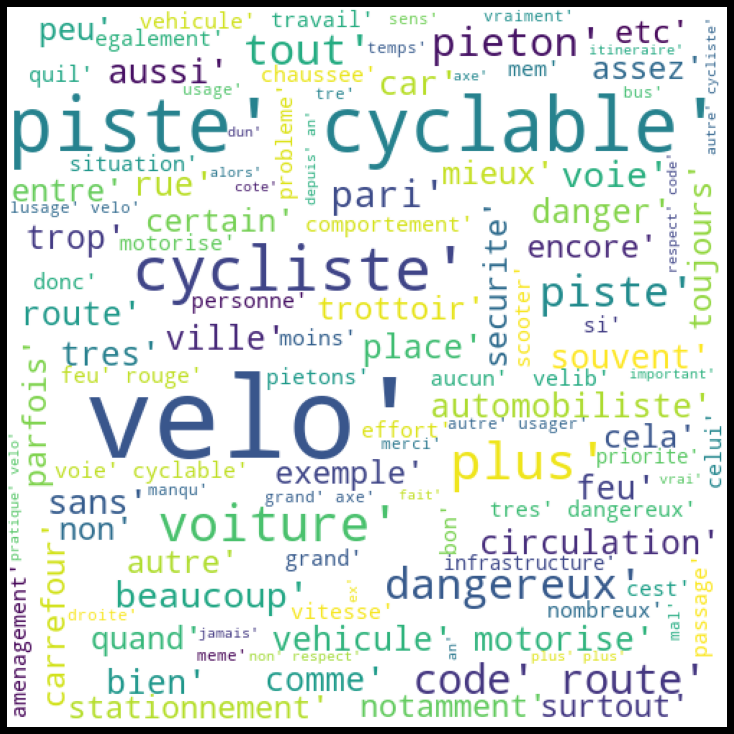

In [70]:
plt.figure(figsize = (10, 10), facecolor = 'black', edgecolor='blue') 
plt.imshow(wordcloud_no_verb) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

In [40]:
lemm=[]
for i in range(156406):
    lemm.append(doc[i].lemma_)
print(lemm)

['il', 'être', 'bon', 'de', 'signaler', 'au', 'sol', 'le', 'piste', 'cyclable', 'par', 'un', 'couleur', 'visible', 'qui', 'trancher', 'avec', 'le', 'route', 'ou', 'le', 'trottoir', 'cela', 'faire', 'de', 'grand', 'couloir', 'colore', 'qui', 'être', 'visible', 'par', 'tout', 'y', 'compris', 'par', 'le', 'cycliste', 'pour', 'moi', 'le', 'velo', 'en', 'libre', 'service', 'avoir', 'accentue', 'le', 'incivilite', 'et', 'le', 'usager', 'ne', 'être', 'ni', 'respectueux', 'de', 'materiel', 'ni', 'de', 'code', 'de', 'le', 'route', 'je', 'ne', 'vouloir', 'pas', 'que', 'mon', 'impot', 'servir', 'avoir', 'cela', 'le', 'difficulte', 'rencontreer', 'par', 'le', 'cycliste', 'être', 'plus', 'lieer', 'avoir', 'labsence', 'de', 'civisme', 'et', 'avoir', 'lincompetence', 'un', 'neo', 'cycliste', 'et', 'un', 'usager', 'de', 'velo', 'en', 'location', 'qua', 'le', 'qualite', 'de', 'piste', 'cyclable', 'dont', 'le', 'logique', 'dutilisation', 'laisser', 'par', 'ailleurs', 'avoir', 'desirer', 'tout', 'être', 

In [41]:
lem_stopwords = [w for w in lemm if not w in stoplist_final]  
lem_stopwords

['être',
 'bon',
 'signaler',
 'sol',
 'piste',
 'cyclable',
 'couleur',
 'visible',
 'trancher',
 'route',
 'trottoir',
 'cela',
 'faire',
 'grand',
 'couloir',
 'colore',
 'être',
 'visible',
 'tout',
 'compris',
 'cycliste',
 'velo',
 'libre',
 'service',
 'avoir',
 'accentue',
 'incivilite',
 'usager',
 'être',
 'ni',
 'respectueux',
 'materiel',
 'ni',
 'code',
 'route',
 'vouloir',
 'impot',
 'servir',
 'avoir',
 'cela',
 'difficulte',
 'rencontreer',
 'cycliste',
 'être',
 'plus',
 'lieer',
 'avoir',
 'labsence',
 'civisme',
 'avoir',
 'lincompetence',
 'neo',
 'cycliste',
 'usager',
 'velo',
 'location',
 'qua',
 'qualite',
 'piste',
 'cyclable',
 'dont',
 'logique',
 'dutilisation',
 'laisser',
 'ailleurs',
 'avoir',
 'desirer',
 'tout',
 'être',
 'faire',
 'neo',
 'cycliste',
 'sentir',
 'situation',
 'dimpunite',
 'mieux',
 'connecter',
 'piste',
 'cyclable',
 'entre',
 'avoir',
 'paris',
 'avoir',
 'maintenant',
 'enormement',
 'voie',
 'cyclable',
 'qualite',
 'être',
 'tr

In [42]:
lem_stopwords_series=pd.Series(lem_stopwords).value_counts()
lem_stopwords_series.head(50)

avoir            4353
être             3490
velo             2959
piste            2482
cyclable         2115
cycliste         1661
plus             1274
faire            1131
dangereux         976
voiture           874
route             821
tres              760
tout              736
falloir           732
trop              719
pieton            627
voie              626
beaucoup          610
cest              572
vehicule          552
pari              541
feu               503
code              489
motorise          468
rue               444
autre             437
respecter         437
sens              402
stationnement     399
usager            396
circulation       395
souvent           391
ville             388
place             377
devoir            362
entre             357
certain           356
pouvoir           356
grand             346
sans              346
danger            344
aussi             328
respect           325
bien              310
encore            305
non       

In [43]:
wordcloud = WordCloud(width = 500, height = 500, 
                background_color ='white', 
                min_font_size = 10).generate(str(lem_stopwords))

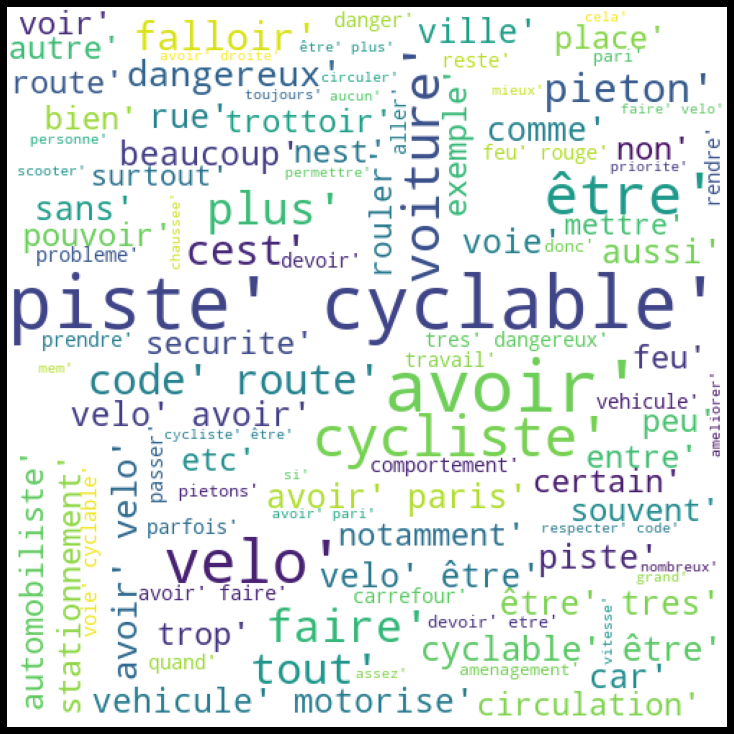

In [44]:
plt.figure(figsize = (10, 10), facecolor = 'black', edgecolor='blue') 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

#### from Olivier's cleaning

In [45]:
gender=pd.read_csv(r'C:\Users\Administrateur\Ironhack\LAB\DAFT_212\Final_project\Quali\wordcloud all genders.csv', sep=";", encoding='latin-1')

In [46]:
gender.head()

,Gender,Token,Lame1,Lame2,Lame3,Lame4,Count
0,All,abandonné,abandonné,abandonné,abandonné,abandonné,5
1,All,aberrations,aberrations,aberrations,aberrations,aberrations,5
2,All,abord,abord,abord,abord,abord,5
3,All,abords,abord,abord,abord,abord,7
4,All,absence,absence,absence,absence,absence,28


In [47]:
gender_token=gender[['Lame4', 'Count']]
gender_token.head()


,Lame4,Count
0,abandonné,5
1,aberrations,5
2,abord,5
3,abord,7
4,absence,28


In [48]:
l=[]
for i in range(0,len(gender_token["Lame4"])):
    for j in range (0,gender_token["Count"][i]):
        l.append(gender_token["Lame4"][i])


In [49]:
l

['abandonné',
 'abandonné',
 'abandonné',
 'abandonné',
 'abandonné',
 'aberrations',
 'aberrations',
 'aberrations',
 'aberrations',
 'aberrations',
 'abord',
 'abord',
 'abord',
 'abord',
 'abord',
 'abord',
 'abord',
 'abord',
 'abord',
 'abord',
 'abord',
 'abord',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absence',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'absolument',
 'ab

In [50]:
pd.Series(l).value_counts()

danger         265
trottinette    254
aménagé        156
point          140
respectant     137
              ... 
aberrations      5
ma              5
lutter           5
lui              5
abandonné        5
Length: 972, dtype: int64

In [51]:
str_l=' '.join(l)
str_l

'abandonné abandonné abandonné abandonné abandonné aberrations aberrations aberrations aberrations aberrations abord abord abord abord abord abord abord abord abord abord abord abord absence absence absence absence absence absence absence absence absence absence absence absence absence absence absence absence absence absence absence absence absence absence absence absence absence absence absence absence absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument absolument accès accès accès accès accès accès accès accessible accessible accessible accessible accessible accessible accessible accessible accessible accessible accident accident accident accident accident accident accident accident accident accident accident accident accident accid

In [52]:
wordcloud1 = WordCloud(width = 500, height = 500, 
                background_color ='white', 
                min_font_size = 10).generate(str_l)

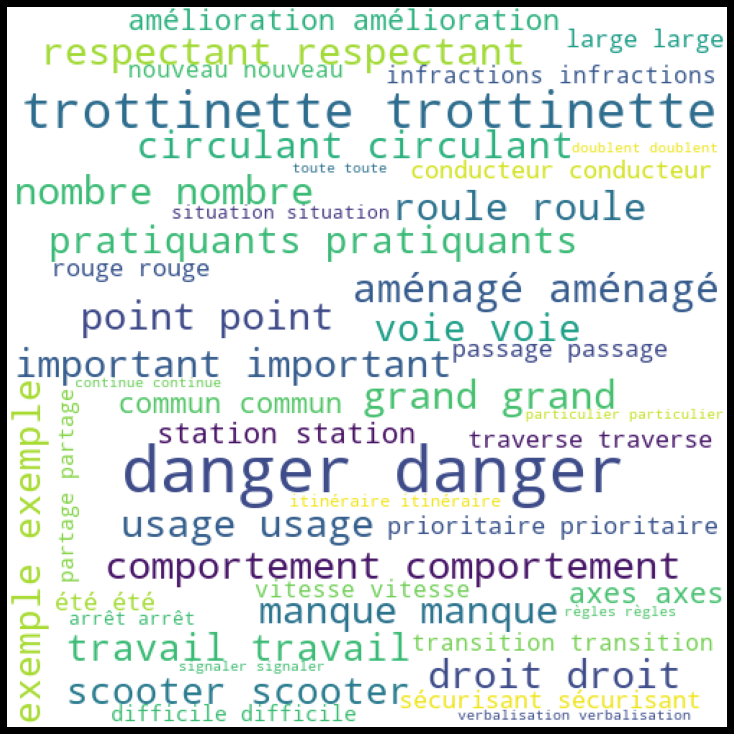

In [53]:
plt.figure(figsize = (10, 10), facecolor = 'black', edgecolor='blue') 
plt.imshow(wordcloud1) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

In [54]:
print(len(lemm))
print(len(lem_stopwords))

156406
99036


In [55]:
text_bigrams=list(nltk.bigrams(lemm))
text_bigrams

[('il', 'être'),
 ('être', 'bon'),
 ('bon', 'de'),
 ('de', 'signaler'),
 ('signaler', 'au'),
 ('au', 'sol'),
 ('sol', 'le'),
 ('le', 'piste'),
 ('piste', 'cyclable'),
 ('cyclable', 'par'),
 ('par', 'un'),
 ('un', 'couleur'),
 ('couleur', 'visible'),
 ('visible', 'qui'),
 ('qui', 'trancher'),
 ('trancher', 'avec'),
 ('avec', 'le'),
 ('le', 'route'),
 ('route', 'ou'),
 ('ou', 'le'),
 ('le', 'trottoir'),
 ('trottoir', 'cela'),
 ('cela', 'faire'),
 ('faire', 'de'),
 ('de', 'grand'),
 ('grand', 'couloir'),
 ('couloir', 'colore'),
 ('colore', 'qui'),
 ('qui', 'être'),
 ('être', 'visible'),
 ('visible', 'par'),
 ('par', 'tout'),
 ('tout', 'y'),
 ('y', 'compris'),
 ('compris', 'par'),
 ('par', 'le'),
 ('le', 'cycliste'),
 ('cycliste', 'pour'),
 ('pour', 'moi'),
 ('moi', 'le'),
 ('le', 'velo'),
 ('velo', 'en'),
 ('en', 'libre'),
 ('libre', 'service'),
 ('service', 'avoir'),
 ('avoir', 'accentue'),
 ('accentue', 'le'),
 ('le', 'incivilite'),
 ('incivilite', 'et'),
 ('et', 'le'),
 ('le', 'usager'

In [56]:
text_bigrams_series=pd.Series(text_bigrams).value_counts()
text_bigrams_series.head(50)

(piste, cyclable)       1590
(de, le)                1416
(le, piste)             1235
(sur, le)               1179
(de, velo)               898
(pour, le)               821
(le, route)              748
(le, velo)               714
(il, falloir)            664
(et, le)                 608
(le, cycliste)           600
(de, piste)              551
(dans, le)               523
(que, le)                484
(de, cycliste)           469
(code, de)               446
(y, avoir)               369
(avoir, un)              359
(le, voiture)            356
(avec, le)               350
(et, de)                 345
(tout, le)               344
(par, le)                323
(le, pieton)             317
(il, y)                  313
(pas, le)                310
(avoir, velo)            300
(plus, de)               283
(avoir, paris)           277
(le, voie)               275
(ne, être)               273
(respect, de)            271
(vehicule, motorise)     252
(avoir, le)              251
(le, code)    

In [57]:
text_bigrams=list(nltk.bigrams(lem_stopwords))
text_bigrams

[('être', 'bon'),
 ('bon', 'signaler'),
 ('signaler', 'sol'),
 ('sol', 'piste'),
 ('piste', 'cyclable'),
 ('cyclable', 'couleur'),
 ('couleur', 'visible'),
 ('visible', 'trancher'),
 ('trancher', 'route'),
 ('route', 'trottoir'),
 ('trottoir', 'cela'),
 ('cela', 'faire'),
 ('faire', 'grand'),
 ('grand', 'couloir'),
 ('couloir', 'colore'),
 ('colore', 'être'),
 ('être', 'visible'),
 ('visible', 'tout'),
 ('tout', 'compris'),
 ('compris', 'cycliste'),
 ('cycliste', 'velo'),
 ('velo', 'libre'),
 ('libre', 'service'),
 ('service', 'avoir'),
 ('avoir', 'accentue'),
 ('accentue', 'incivilite'),
 ('incivilite', 'usager'),
 ('usager', 'être'),
 ('être', 'ni'),
 ('ni', 'respectueux'),
 ('respectueux', 'materiel'),
 ('materiel', 'ni'),
 ('ni', 'code'),
 ('code', 'route'),
 ('route', 'vouloir'),
 ('vouloir', 'impot'),
 ('impot', 'servir'),
 ('servir', 'avoir'),
 ('avoir', 'cela'),
 ('cela', 'difficulte'),
 ('difficulte', 'rencontreer'),
 ('rencontreer', 'cycliste'),
 ('cycliste', 'être'),
 ('être

In [58]:
text_bigrams_series=pd.Series(text_bigrams).value_counts()
text_bigrams_series.head(50)

(piste, cyclable)        1590
(code, route)             449
(cyclable, être)          319
(avoir, velo)             311
(avoir, paris)            277
(velo, être)              269
(être, tres)              252
(vehicule, motorise)      252
(velo, avoir)             227
(tres, dangereux)         158
(avoir, faire)            152
(feu, rouge)              141
(voie, cyclable)          139
(devoir, etre)            134
(respecter, code)         133
(piste, être)             122
(être, plus)              117
(cycliste, être)          115
(avoir, pari)             115
(avoir, droite)           111
(cyclable, avoir)         111
(faire, velo)             109
(être, dangereux)         107
(avoir, ete)              106
(autre, usager)           104
(cycliste, avoir)         103
(être, souvent)           100
(grand, axe)               99
(pari, être)               99
(non, respect)             92
(lusage, velo)             92
(autre, cycliste)          91
(ny, avoir)                90
(pratique,

In [59]:
lemmed = [FrenchLefffLemmatizer().lemmatize(w) for w in splitwords_sample]

KeyboardInterrupt: 

In [ ]:
lemmed

In [ ]:
import fr_core_news_sm
nlp = fr_core_news_sm.load()
doc = nlp(t for t in splitwords_sample)

print([(sent.text) for sent in doc.sents])


print([(word.text, word.lemma_, word.pos_) for word in doc])


In [ ]:
from spacy_lefff import LefffLemmatizer, POSTagger
nlp = spacy.load('fr_core_news_sm')
pos = POSTagger()
french_lemmatizer = LefffLemmatizer(after_melt=True)
nlp.add_pipe(pos, name='pos', after='parser')
nlp.add_pipe(french_lemmatizer, name='lefff', after='pos')
doc = nlp(t for t in splitwords_sample)
for d in doc:
    print(d.text, d.pos_, d._.melt_tagger, d._.lefff_lemma, d.tag_, d.lemma_)

In [ ]:
import spacy
from spacy_lefff import LefffLemmatizer
from spacy.language import Language

@Language.factory('french_lemmatizer')
def create_french_lemmatizer(nlp, name):
    return LefffLemmatizer()

nlp = spacy.load('fr_core_news_sm')
nlp.add_pipe('french_lemmatizer', name='lefff')
doc = nlp(t for t in splitwords_sample)
for d in doc:
    print(d.text, d.pos_, d._.lefff_lemma, d.tag_, d.lemma_)

In [ ]:
import spacy
from spacy_lefff import LefffLemmatizer, POSTagger
from spacy.language import Language

@Language.factory('french_lemmatizer')
def create_french_lemmatizer(nlp, name):
    return LefffLemmatizer(after_melt=True, default=True)

@Language.factory('melt_tagger')  
def create_melt_tagger(nlp, name):
    return POSTagger()
 
nlp = spacy.load('fr_core_news_sm')
nlp.add_pipe('melt_tagger', after='parser')
nlp.add_pipe('french_lemmatizer', after='melt_tagger')
doc = nlp(u"Apple cherche a acheter une startup anglaise pour 1 milliard de dollard")
for d in doc:
    print(d.text, d.pos_, d._.melt_tagger, d._.lefff_lemma, d.tag_, d.lemma_)

In [ ]:
!pip install wordcloud

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt


plt.rcParams["figure.figsize"] = [16, 9]

In [ ]:
import wordcloud

In [ ]:
def create_ngrams(token_list, nb_elements):
    """
    Create n-grams for list of tokens
    Parameters
    ----------
    token_list : list
        list of strings
    nb_elements :
        number of elements in the n-gram
    Returns
    -------
    Generator
        generator of all n-grams
    """
    ngrams = zip(*[token_list[index_token:] for index_token in range(nb_elements)])
    return (" ".join(ngram) for ngram in ngrams)
create_ngrams(filtered_text, 2)

In [ ]:
def frequent_words(list_words, ngrams_number=1, number_top_words=10):
    """
    Create n-grams for list of tokens
    Parameters
    ----------
    ngrams_number : int
    number_top_words : int
        output dataframe length
    Returns
    -------
    DataFrame
        Dataframe with the entities and their frequencies.
    """
    frequent = []
    if ngrams_number == 1:
        pass
    elif ngrams_number >= 2:
        list_words = create_ngrams(list_words, ngrams_number)
    else:
        raise ValueError("number of n-grams should be >= 1")
    counter = Counter(list_words)
    frequent = counter.most_common(number_top_words)
    return frequent

frequent_words(filtered_text, ngrams_number=1, number_top_words=10)

In [ ]:
def make_word_cloud(text_or_counter, stop_words=None):
    if isinstance(text_or_counter, str):
        word_cloud = wordcloud.WordCloud(stopwords=stop_words).generate(text_or_counter)
    else:
        if stop_words is not None:
            text_or_counter = Counter(word for word in text_or_counter if word not in stop_words)
        word_cloud = wordcloud.WordCloud(stopwords=stop_words).generate_from_frequencies(text_or_counter)
    plt.imshow(word_cloud)
    plt.axis("off")
    plt.show()

In [ ]:
wnl = WordNetLemmatizer() 
filtered_text_lem=[]
for words in filtered_text: 
    words_new=wnl.lemmatize(words)
    filtered_text_lem.append(words_new)
filtered_text_lem

In [ ]:
count_lem = pd.Series(filtered_text_lem).value_counts()
count_lem.head(50)

In [ ]:
lématisation

In [ ]:
filtered_text.count(',')

In [ ]:
filtered_text.remove(',')
filtered_text.remove(':')
filtered_text.remove('...')
filtered_text

In [ ]:
count = pd.Series(filtered_text).value_counts()
count

In [ ]:
from collections import Counter
Counter(filtered_text)

In [ ]:
# remove anything but characters and spaces
text = text.str.replace('[^A-z ]','').str.replace(' +',' ').str.strip()
text
[^\w\s]

In [ ]:
pip install -U spacy

In [ ]:
pip install spacy download en_core_web_sm

In [ ]:
python -m spacy download en_core_web_sm

In [ ]:
import spacy
nlp = spacy.load("en_core_web_sm")

In [ ]:
import spacy

# Load English tokenizer, tagger, parser and NER
nlp = spacy.load("en_core_web_sm")

# Process whole documents
text = ("When Sebastian Thrun started working on self-driving cars at "
        "Google in 2007, few people outside of the company took him "
        "seriously. “I can tell you very senior CEOs of major American "
        "car companies would shake my hand and turn away because I wasn’t "
        "worth talking to,” said Thrun, in an interview with Recode earlier "
        "this week.")
doc = nlp(text)

# Analyze syntax
print("Noun phrases:", [chunk.text for chunk in doc.noun_chunks])
print("Verbs:", [token.lemma_ for token in doc if token.pos_ == "VERB"])

# Find named entities, phrases and concepts
for entity in doc.ents:
    print(entity.text, entity.label_)

In [ ]:
wnl = WordNetLemmatizer() 
  
list1 = ['kites', 'babies', 'dogs', 'flying', 'smiling',  
         'driving', 'died', 'tried', 'feet'] 
for words in list1: 
    print(words + " ---> " + wnl.lemmatize(words)) 

In [ ]:
string = 'the cat is sitting with the bats on the striped mat under many flying geese'
  
list2 = nltk.word_tokenize(string) 
print(list2) 
  
lemmatized_string = ' '.join([wnl.lemmatize(words) for words in list2]) 
  
print(lemmatized_string)  